# CS 4330 Data Science - Term Project

Team Space X

Members- Long Nguyen, Dhruba Panta, Seth Riddle, Areonia Robinson

## Set up access to the Barrios ISS dataset

In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [4]:
# dont' change the following folder path, but have the same folder shortcut in your home drive
flist = os.listdir('drive/MyDrive/Barrios-ASU - ISS Consumables Data Package/csv')

In [5]:
# Sort file names
flist.sort()

In [6]:
flist

['ims_consumables_category_lookup.csv',
 'inventory_mgmt_system_consumables_20220101-20230905.csv',
 'iss_flight_plan_20220101-20251231.csv',
 'iss_flight_plan_crew_20220101-20251321.csv',
 'iss_flight_plan_crew_nationality_lookup.csv',
 'rates_definition.csv',
 'rsa_consumable_water_summary_20220103-20230828.csv',
 'stored_items_only_inventory_mgmt_system_consumables_20220101-20230905.csv',
 'tank_capacity_definition.csv',
 'thresholds_limits_definition.csv',
 'us_rs_weekly_consumable_gas_summary_20220102-20230903.csv',
 'us_weekly_consumable_water_summary_20220102-20230903.csv',
 'vehicle_capcity_def.csv']

In [7]:
dir = 'drive/MyDrive/Barrios-ASU - ISS Consumables Data Package/csv/'

## International Space Station

<image src='https://www.nasa.gov/wp-content/uploads/2023/05/iss-blowout-updated-view-2023-300.png?resize=2000,1250' width='800'/>

## Reading all the csv files into Dataframe

Reading ims_consumables_category_lookup.csv into dataframe


In [8]:
df_imsc_cat=pd.read_csv(dir + flist[0])

Reading inventory_mgmt_system_consumables_20220101-20230905.csv into dataframe

---




In [9]:
df_imsc=pd.read_csv(dir + flist[1],header=None)

Reading iss_flight_plan_20220101-20251231.csv into dataframe

In [10]:
df_fltpln=pd.read_csv(dir + flist[2])

Reading iss_flight_plan_crew_20220101-20251321.csv into dataframe

In [11]:
df_fltpln_cr=pd.read_csv(dir + flist[3])

Reading iss_flight_plan_crew_nationality_lookup.csv into dataframe

In [12]:
df_fltpln_cr_nat=pd.read_csv(dir + flist[4])

Reading rates_definition.csv into dataframe

In [13]:
df_rtdefn=pd.read_csv(dir + flist[5])

Reading rsa_consumable_water_summary_20220103-20230828.csv into dataframe

In [14]:
df_rsac_wat=pd.read_csv(dir + flist[6])

Reading stored_items_only_inventory_mgmt_system_consumables_20220101-20230905.csv into dataframe

In [15]:
df_storedimsc=pd.read_csv(dir + flist[7])

Reading tank_capacity_definition.csv into dataframe

In [16]:
df_tnkcap=pd.read_csv(dir + flist[8])

Reading thresholds_limits_definition.csv into dataframe

In [17]:
df_thresh=pd.read_csv(dir+flist[9])

Reading us_rs_weekly_consumable_gas_summary_20220102-20230903.csv into dataframe

In [18]:
df_usrs_gas_sum=pd.read_csv(dir + flist[10])


Reading us_weekly_consumable_water_summary_20220102-20230903.csv into dataframe

In [19]:
df_wat_sum=pd.read_csv(dir + flist[11])

Reading vehicle_capacity_def.csv into dataframe

In [20]:
df_veh_cap=pd.read_csv(dir + flist[12])

# Progress Report 1

## Discovering and Analyzing df_imsc_cat dataframe

In [21]:
df_imsc_cat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7 entries, 0 to 6
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   category_name      7 non-null      object
 1   categoryID         7 non-null      int64 
 2   module_name        7 non-null      object
 3   moduleID           7 non-null      int64 
 4   unique_cat_mod_ID  7 non-null      object
dtypes: int64(2), object(3)
memory usage: 408.0+ bytes


Setting categoryID and category_name as category datatype

In [22]:
df_imsc_cat['categoryID']=df_imsc_cat['categoryID'].astype('category')
df_imsc_cat['category_name']=df_imsc_cat['category_name'].astype('category')
df_imsc_cat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7 entries, 0 to 6
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   category_name      7 non-null      category
 1   categoryID         7 non-null      category
 2   module_name        7 non-null      object  
 3   moduleID           7 non-null      int64   
 4   unique_cat_mod_ID  7 non-null      object  
dtypes: category(2), int64(1), object(2)
memory usage: 1022.0+ bytes


In [23]:
df_imsc_cat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7 entries, 0 to 6
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   category_name      7 non-null      category
 1   categoryID         7 non-null      category
 2   module_name        7 non-null      object  
 3   moduleID           7 non-null      int64   
 4   unique_cat_mod_ID  7 non-null      object  
dtypes: category(2), int64(1), object(2)
memory usage: 1022.0+ bytes


`## Discovering and Analyzing inventory_mgmt_system_consumables_20220101-20230905.csv

In [24]:
headers = '''datedim
id
id_parent
id_path
tree_depth
tree
part_number
serial_number
location_name
original_ip_owner
current_ip_owner
operational_nomenclature
russian_name
english_name
barcode
quantity
width
height
length
diameter
calculated_volume
stwg_ovrrd_vol
children_volume
stwg_ovrrd_chldren_vol
ovrrd_notes
volume_notes
expire_date
launch
type
hazard
state
status
is_container
is_moveable
system
subsystem
action_date
move_date
fill_status
categoryID
category_name'''

In [25]:
df_imsc.columns = headers.split('\n')

In [26]:
df_imsc_master=df_imsc

In [27]:
df_imsc.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
id,5790369.0,232818.537094,141525.843063,385.0000,119231.00000,225730.0000,355560.00000,502118.00000
id_parent,5790369.0,249109.507702,148989.283310,1.0000,128198.00000,230329.0000,380271.00000,501976.00000
tree_depth,5790369.0,4.563674,1.582816,1.0000,3.00000,4.0000,5.00000,11.00000
quantity,5790369.0,1.052273,1.545989,1.0000,1.00000,1.0000,1.00000,50.00000
width,4502409.0,283.238334,67.234952,0.0000,304.80000,304.8000,305.00000,774.70000
height,5202145.0,202.596213,132.827217,0.0000,123.00000,123.8300,383.00000,812.80000
length,4971070.0,281.099694,120.472907,0.0000,123.00000,345.0000,377.83000,960.12000
diameter,1526360.0,256.805384,125.626656,0.0000,160.00000,330.0000,330.00000,876.30000
calculated_volume,5622428.0,0.280256,0.237050,0.0000,0.24276,0.2698,0.27184,8.69893
stwg_ovrrd_vol,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


From above we can note that columns stwg_ovrrd_vol, stwg_ovrrd_children_vol and ovrrd_notes doesn't have any useful data. So we can drop those columns.

In [28]:
df_imsc.drop(['stwg_ovrrd_vol','stwg_ovrrd_chldren_vol','ovrrd_notes'],axis=1,inplace=True)

Assigning appropriate datatype to columns so that it's useful in future calculation.

In [29]:
df_imsc['datedim'] = pd.to_datetime(df_imsc['datedim'])
df_imsc['expire_date'] = pd.to_datetime(df_imsc['expire_date'])
df_imsc['action_date'] = pd.to_datetime(df_imsc['action_date'])
df_imsc['move_date'] = pd.to_datetime(df_imsc['move_date'])

df_imsc['categoryID']=df_imsc['categoryID'].astype('category')
df_imsc['category_name']=df_imsc['category_name'].astype('category')


As per discussion with Barrios, datedim can have potentially have duplicate run in a same day which could create duplicate data. To cleanup, we will be extracting only date part from datedim column, renaming the column as datedim_date and dropping any duplicate datas if any.

In [30]:
dtype_of_datedim = df_imsc['datedim'].dtype
df_imsc = df_imsc.rename(columns={'datedim': 'datedim_date'})
df_imsc['datedim_date'] = df_imsc['datedim_date'].astype(dtype_of_datedim)


In [31]:
df_imsc['datedim_date'] = pd.to_datetime(df_imsc['datedim_date'])
df_imsc['datedim_date']=df_imsc['datedim_date'].dt.date
df_imsc['datedim_date'] = pd.to_datetime(df_imsc['datedim_date'])
df_imsc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5790369 entries, 0 to 5790368
Data columns (total 38 columns):
 #   Column                    Dtype         
---  ------                    -----         
 0   datedim_date              datetime64[ns]
 1   id                        int64         
 2   id_parent                 int64         
 3   id_path                   object        
 4   tree_depth                int64         
 5   tree                      object        
 6   part_number               object        
 7   serial_number             object        
 8   location_name             object        
 9   original_ip_owner         object        
 10  current_ip_owner          object        
 11  operational_nomenclature  object        
 12  russian_name              object        
 13  english_name              object        
 14  barcode                   object        
 15  quantity                  int64         
 16  width                     float64       
 17  height  

Filtering out the data as interested data is only for tree as Storage Location

In [32]:
df_imsc=df_imsc[df_imsc['tree']=='Storage Location']
df_imsc_stg_loc=df_imsc

In [33]:
df_imsc.info()
df_imsc

<class 'pandas.core.frame.DataFrame'>
Index: 533987 entries, 0 to 5778004
Data columns (total 38 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   datedim_date              533987 non-null  datetime64[ns]
 1   id                        533987 non-null  int64         
 2   id_parent                 533987 non-null  int64         
 3   id_path                   533987 non-null  object        
 4   tree_depth                533987 non-null  int64         
 5   tree                      533987 non-null  object        
 6   part_number               533987 non-null  object        
 7   serial_number             533987 non-null  object        
 8   location_name             533987 non-null  object        
 9   original_ip_owner         533987 non-null  object        
 10  current_ip_owner          533987 non-null  object        
 11  operational_nomenclature  533987 non-null  object        
 12  russia

,datedim_date,id,id_parent,id_path,tree_depth,tree,part_number,serial_number,location_name,original_ip_owner,...,status,is_container,is_moveable,system,subsystem,action_date,move_date,fill_status,categoryID,category_name
0,2022-01-01,364155,265,/0/101/265/364155/,3,Storage Location,11Ф615.8720А55-20,1180,ФГБ1ГА,Russian Space Agency,...,Stowed,1,1,SM Hygiene Sanitary Equipment,АсСУ,2020-10-10 19:22:04.180,2020-10-10 19:22:04.180,NaN,3,KTO
1,2022-01-01,364156,265,/0/101/265/364156/,3,Storage Location,11Ф615.8720А55-20,1181,ФГБ1ГА,Russian Space Agency,...,Stowed,1,1,SM Hygiene Sanitary Equipment,АсСУ,2020-10-10 19:22:04.300,2020-10-10 19:22:04.300,NaN,3,KTO
2,2022-01-01,364157,265,/0/101/265/364157/,3,Storage Location,11Ф615.8720А55-20,1182,ФГБ1ГА,Russian Space Agency,...,Stowed,1,1,SM Hygiene Sanitary Equipment,АсСУ,2020-10-10 19:22:04.263,2020-10-10 19:22:04.263,NaN,3,KTO
3,2022-01-01,364158,265,/0/101/265/364158/,3,Storage Location,11Ф615.8720А55-10,1182,ФГБ1ГА,Russian Space Agency,...,Stowed,1,1,SM Hygiene Sanitary Equipment,АсСУ,2020-10-10 19:22:04.250,2020-10-10 19:22:04.250,NaN,3,KTO
4,2022-01-01,364160,265,/0/101/265/364160/,3,Storage Location,11Ф615.8720А55-20,1184,ФГБ1ГА,Russian Space Agency,...,Stowed,1,1,SM Hygiene Sanitary Equipment,АсСУ,2020-10-10 19:22:04.290,2020-10-10 19:22:04.290,NaN,3,KTO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5778000,2023-09-05,496349,422154,/0/87242/87249/87279/422154/496349/,5,Storage Location,10182.5514.000,2203414,NOD3A2,NASA,...,Stowed,1,1,ECLSS,WHC,2023-08-08 16:42:17.760,2023-08-08 16:42:17.760,NaN,5,Filter Inserts
5778001,2023-09-05,496351,422154,/0/87242/87249/87279/422154/496351/,5,Storage Location,10182.5514.000,2102396,NOD3A2,NASA,...,Stowed,1,1,ECLSS,WHC,2023-08-08 16:42:17.770,2023-08-08 16:42:17.770,NaN,5,Filter Inserts
5778002,2023-09-05,496353,422154,/0/87242/87249/87279/422154/496353/,5,Storage Location,10182.5514.000,2102399,NOD3A2,NASA,...,Stowed,1,1,ECLSS,WHC,2023-08-08 16:42:17.787,2023-08-08 16:42:17.787,NaN,5,Filter Inserts
5778003,2023-09-05,496357,422154,/0/87242/87249/87279/422154/496357/,5,Storage Location,10182.5514.000,2102394,NOD3A2,NASA,...,Stowed,1,1,ECLSS,WHC,2023-08-08 16:42:17.813,2023-08-08 16:42:17.813,NaN,5,Filter Inserts


Dropping any duplicate data based on columns datedim_date and id

In [34]:
df_imsc=df_imsc.drop_duplicates(subset=['datedim_date','id'])
df_imsc.info()

<class 'pandas.core.frame.DataFrame'>
Index: 528001 entries, 0 to 5778004
Data columns (total 38 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   datedim_date              528001 non-null  datetime64[ns]
 1   id                        528001 non-null  int64         
 2   id_parent                 528001 non-null  int64         
 3   id_path                   528001 non-null  object        
 4   tree_depth                528001 non-null  int64         
 5   tree                      528001 non-null  object        
 6   part_number               528001 non-null  object        
 7   serial_number             528001 non-null  object        
 8   location_name             528001 non-null  object        
 9   original_ip_owner         528001 non-null  object        
 10  current_ip_owner          528001 non-null  object        
 11  operational_nomenclature  528001 non-null  object        
 12  russia

Adding new feature year_month column for monthly usage calculations

In [35]:
df_imsc['year_month'] = df_imsc['datedim_date'].dt.strftime('%Y-%m')
df_imsc['year_month'] = pd.to_datetime(df_imsc['year_month'])
df_imsc

,datedim_date,id,id_parent,id_path,tree_depth,tree,part_number,serial_number,location_name,original_ip_owner,...,is_container,is_moveable,system,subsystem,action_date,move_date,fill_status,categoryID,category_name,year_month
0,2022-01-01,364155,265,/0/101/265/364155/,3,Storage Location,11Ф615.8720А55-20,1180,ФГБ1ГА,Russian Space Agency,...,1,1,SM Hygiene Sanitary Equipment,АсСУ,2020-10-10 19:22:04.180,2020-10-10 19:22:04.180,NaN,3,KTO,2022-01-01
1,2022-01-01,364156,265,/0/101/265/364156/,3,Storage Location,11Ф615.8720А55-20,1181,ФГБ1ГА,Russian Space Agency,...,1,1,SM Hygiene Sanitary Equipment,АсСУ,2020-10-10 19:22:04.300,2020-10-10 19:22:04.300,NaN,3,KTO,2022-01-01
2,2022-01-01,364157,265,/0/101/265/364157/,3,Storage Location,11Ф615.8720А55-20,1182,ФГБ1ГА,Russian Space Agency,...,1,1,SM Hygiene Sanitary Equipment,АсСУ,2020-10-10 19:22:04.263,2020-10-10 19:22:04.263,NaN,3,KTO,2022-01-01
3,2022-01-01,364158,265,/0/101/265/364158/,3,Storage Location,11Ф615.8720А55-10,1182,ФГБ1ГА,Russian Space Agency,...,1,1,SM Hygiene Sanitary Equipment,АсСУ,2020-10-10 19:22:04.250,2020-10-10 19:22:04.250,NaN,3,KTO,2022-01-01
4,2022-01-01,364160,265,/0/101/265/364160/,3,Storage Location,11Ф615.8720А55-20,1184,ФГБ1ГА,Russian Space Agency,...,1,1,SM Hygiene Sanitary Equipment,АсСУ,2020-10-10 19:22:04.290,2020-10-10 19:22:04.290,NaN,3,KTO,2022-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5778000,2023-09-05,496349,422154,/0/87242/87249/87279/422154/496349/,5,Storage Location,10182.5514.000,2203414,NOD3A2,NASA,...,1,1,ECLSS,WHC,2023-08-08 16:42:17.760,2023-08-08 16:42:17.760,NaN,5,Filter Inserts,2023-09-01
5778001,2023-09-05,496351,422154,/0/87242/87249/87279/422154/496351/,5,Storage Location,10182.5514.000,2102396,NOD3A2,NASA,...,1,1,ECLSS,WHC,2023-08-08 16:42:17.770,2023-08-08 16:42:17.770,NaN,5,Filter Inserts,2023-09-01
5778002,2023-09-05,496353,422154,/0/87242/87249/87279/422154/496353/,5,Storage Location,10182.5514.000,2102399,NOD3A2,NASA,...,1,1,ECLSS,WHC,2023-08-08 16:42:17.787,2023-08-08 16:42:17.787,NaN,5,Filter Inserts,2023-09-01
5778003,2023-09-05,496357,422154,/0/87242/87249/87279/422154/496357/,5,Storage Location,10182.5514.000,2102394,NOD3A2,NASA,...,1,1,ECLSS,WHC,2023-08-08 16:42:17.813,2023-08-08 16:42:17.813,NaN,5,Filter Inserts,2023-09-01


Selecting only few columns that might be of use for usage rate calcualtions

In [36]:
df_imsc=df_imsc[['datedim_date','id','tree','original_ip_owner','current_ip_owner','quantity','calculated_volume','expire_date','status','categoryID','category_name']]
df_imsc[df_imsc['datedim_date']<=df_imsc['expire_date']]

,datedim_date,id,tree,original_ip_owner,current_ip_owner,quantity,calculated_volume,expire_date,status,categoryID,category_name
0,2022-01-01,364155,Storage Location,Russian Space Agency,RSA00,1,0.68773,2024-07-17,Stowed,3,KTO
1,2022-01-01,364156,Storage Location,Russian Space Agency,RSA00,1,0.68773,2024-07-17,Stowed,3,KTO
2,2022-01-01,364157,Storage Location,Russian Space Agency,RSA00,1,0.68773,2024-07-17,Stowed,3,KTO
3,2022-01-01,364158,Storage Location,Russian Space Agency,RSA00,1,0.24930,2024-07-17,Stowed,3,KTO
4,2022-01-01,364160,Storage Location,Russian Space Agency,RSA00,1,0.68773,2024-07-17,Stowed,3,KTO
...,...,...,...,...,...,...,...,...,...,...,...
5777943,2023-09-05,498736,Storage Location,Russian Space Agency,RSA00,1,NaN,2027-07-17,Stowed,3,KTO
5777944,2023-09-05,498737,Storage Location,Russian Space Agency,RSA00,1,0.24930,2027-07-17,Stowed,3,KTO
5777945,2023-09-05,498738,Storage Location,Russian Space Agency,RSA00,1,NaN,2027-07-17,Stowed,3,KTO
5777946,2023-09-05,498739,Storage Location,Russian Space Agency,RSA00,1,NaN,2027-07-17,Stowed,3,KTO


Grouping data by category_name, datedim_date, status and calculating the quantity in record per day

In [37]:
df_imsc_gd = df_imsc.groupby(['category_name', 'datedim_date', 'status']).agg({'quantity': 'sum', 'calculated_volume': 'sum'}).reset_index()
df_imsc_gd.columns = ['category_name', 'datedim_date', 'status', 'total_quantity','total_volume']
df_imsc_gd

,category_name,datedim_date,status,total_quantity,total_volume
0,ACY Inserts,2022-01-01,Discard,11,0.93276
1,ACY Inserts,2022-01-01,Installed,0,0.00000
2,ACY Inserts,2022-01-01,Stowed,82,7.79656
3,ACY Inserts,2022-01-02,Discard,11,0.93276
4,ACY Inserts,2022-01-02,Installed,0,0.00000
...,...,...,...,...,...
13051,Pretreat Tanks,2023-09-04,Installed,3,0.63407
13052,Pretreat Tanks,2023-09-04,Stowed,8,1.47917
13053,Pretreat Tanks,2023-09-05,Discard,4,0.71516
13054,Pretreat Tanks,2023-09-05,Installed,3,0.63407


Creating pivot table for grouped data

In [38]:
pivot_table = df_imsc_gd.pivot_table(index=['category_name', 'datedim_date'],
                             columns='status',
                             values='total_quantity',
                             aggfunc='sum',
                             fill_value=0)
pivot_table['total_volume'] = df_imsc_gd.groupby(['category_name', 'datedim_date'])['total_volume'].sum()

pivot_table.reset_index(inplace=True)
df_imsc_Pivot=pivot_table


In [39]:
df_imsc_Pivot

status,category_name,datedim_date,Discard,Installed,Stowed,total_volume
0,ACY Inserts,2022-01-01,11,0,82,8.72932
1,ACY Inserts,2022-01-02,11,0,82,8.72932
2,ACY Inserts,2022-01-03,11,0,82,8.72932
3,ACY Inserts,2022-01-05,11,0,82,8.72932
4,ACY Inserts,2022-01-06,11,0,82,8.72932
...,...,...,...,...,...,...
4347,Pretreat Tanks,2023-09-01,4,3,8,2.82840
4348,Pretreat Tanks,2023-09-02,4,3,8,2.82840
4349,Pretreat Tanks,2023-09-03,4,3,8,2.82840
4350,Pretreat Tanks,2023-09-04,4,3,8,2.82840


### ACY Inserts - Category

In [40]:
df_imsc_ACY_Inserts = df_imsc_Pivot.sort_values(by=['category_name', 'datedim_date'])
df_imsc_ACY_Inserts=df_imsc_ACY_Inserts[df_imsc_ACY_Inserts['category_name']=='ACY Inserts']
df_imsc_ACY_Inserts['usage_quantity'] = df_imsc_ACY_Inserts['Discard']+df_imsc_ACY_Inserts['Installed']-df_imsc_ACY_Inserts['Discard'].shift(1)-df_imsc_ACY_Inserts['Installed'].shift(1)
df_imsc_ACY_Inserts['usage_quantity'].fillna(0, inplace=True)
df_imsc_ACY_Inserts

status,category_name,datedim_date,Discard,Installed,Stowed,total_volume,usage_quantity
0,ACY Inserts,2022-01-01,11,0,82,8.72932,0.0
1,ACY Inserts,2022-01-02,11,0,82,8.72932,0.0
2,ACY Inserts,2022-01-03,11,0,82,8.72932,0.0
3,ACY Inserts,2022-01-05,11,0,82,8.72932,0.0
4,ACY Inserts,2022-01-06,11,0,82,8.72932,0.0
...,...,...,...,...,...,...,...
539,ACY Inserts,2023-09-01,18,0,76,8.93752,2.0
540,ACY Inserts,2023-09-02,18,0,76,8.93752,0.0
541,ACY Inserts,2023-09-03,18,0,76,8.93752,0.0
542,ACY Inserts,2023-09-04,18,0,76,8.93752,0.0



#### Merging crew_count to ACY Inserts Category DataFrame

In [41]:
df_fltpln_cr.rename(columns={'datedim': 'datedim_date'}, inplace=True)
df_fltpln_cr['datedim_date'] = pd.to_datetime(df_fltpln_cr['datedim_date'])
crew_count_agg = df_fltpln_cr.groupby('datedim_date')['crew_count'].sum().reset_index()
df_imsc_ACY_Inserts = pd.merge(df_imsc_ACY_Inserts, crew_count_agg, on='datedim_date', how='left')
df_imsc_ACY_Inserts

,category_name,datedim_date,Discard,Installed,Stowed,total_volume,usage_quantity,crew_count
0,ACY Inserts,2022-01-01,11,0,82,8.72932,0.0,7
1,ACY Inserts,2022-01-02,11,0,82,8.72932,0.0,7
2,ACY Inserts,2022-01-03,11,0,82,8.72932,0.0,7
3,ACY Inserts,2022-01-05,11,0,82,8.72932,0.0,7
4,ACY Inserts,2022-01-06,11,0,82,8.72932,0.0,7
...,...,...,...,...,...,...,...,...
539,ACY Inserts,2023-09-01,18,0,76,8.93752,2.0,11
540,ACY Inserts,2023-09-02,18,0,76,8.93752,0.0,11
541,ACY Inserts,2023-09-03,18,0,76,8.93752,0.0,7
542,ACY Inserts,2023-09-04,18,0,76,8.93752,0.0,7



#### Time Series Plot for Usage Rate of ACY Inserts




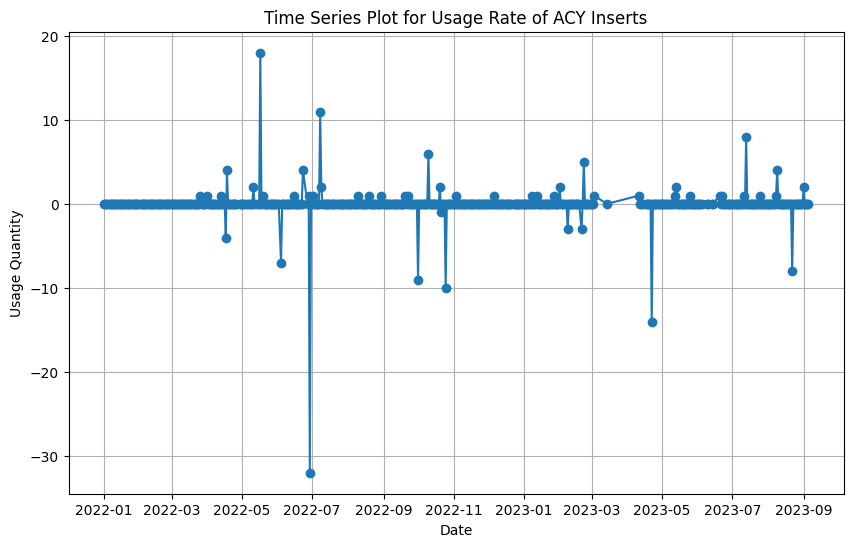

In [42]:
plt.figure(figsize=(10, 6))
plt.plot(df_imsc_ACY_Inserts['datedim_date'], df_imsc_ACY_Inserts['usage_quantity'], marker='o', linestyle='-')
plt.title('Time Series Plot for Usage Rate of ACY Inserts')
plt.xlabel('Date')
plt.ylabel('Usage Quantity')
plt.grid(True)
plt.show()

#### Box Plot for Total Volume of ACY Inserts

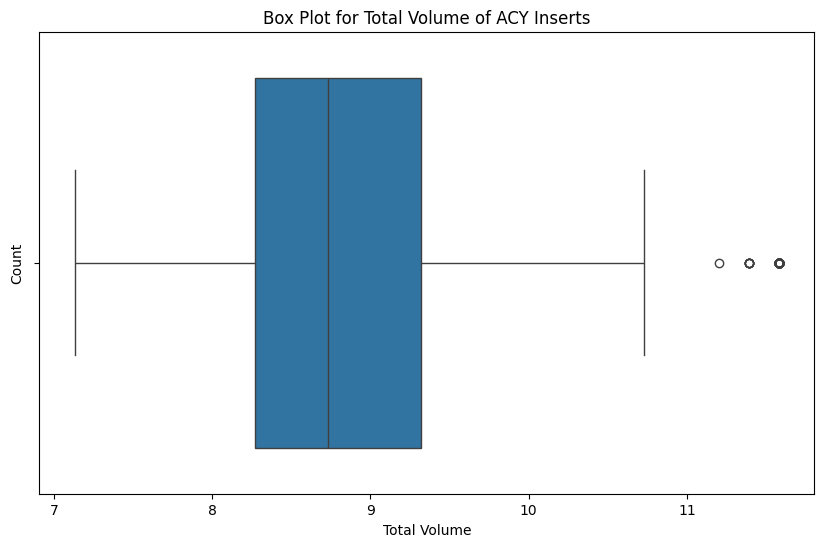

In [43]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='total_volume', data=df_imsc_ACY_Inserts)
plt.title('Box Plot for Total Volume of ACY Inserts')
plt.xlabel('Total Volume')
plt.ylabel('Count')
plt.show()


#### Scatter Plot of Usage Quantity vs. Total Volume for ACY Inserts



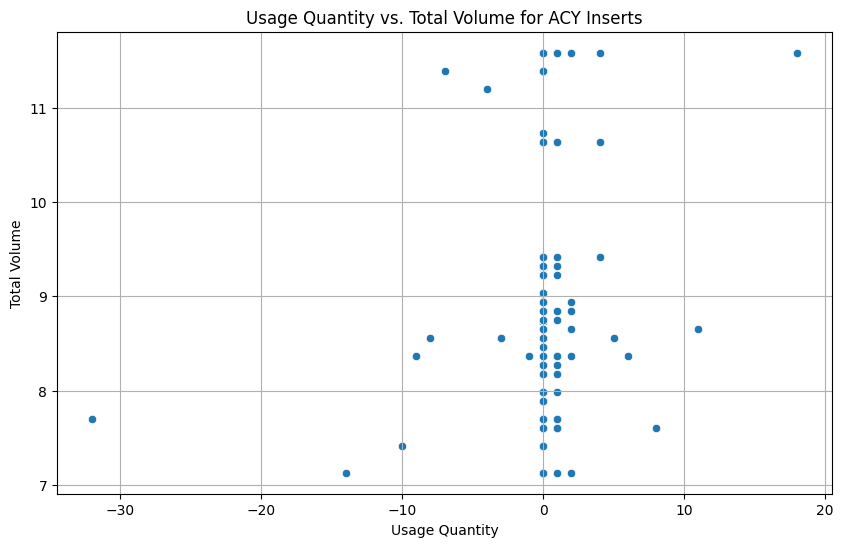

In [44]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='usage_quantity', y='total_volume', data=df_imsc_ACY_Inserts)
plt.title('Usage Quantity vs. Total Volume for ACY Inserts')
plt.xlabel('Usage Quantity')
plt.ylabel('Total Volume')
plt.grid(True)
plt.show()


#### Discard, Installed, and Stowed Over Time for ACY Inserts

### KTO Category

In [45]:
df_imsc_KTO= df_imsc_Pivot.sort_values(by=['category_name', 'datedim_date'])
df_imsc_KTO =df_imsc_KTO[df_imsc_KTO['category_name']=='KTO']
df_imsc_KTO['usage_quantity'] = df_imsc_KTO['Discard']+df_imsc_KTO['Installed']-df_imsc_KTO['Discard'].shift(1)-df_imsc_KTO['Installed'].shift(1)
df_imsc_KTO['usage_quantity'].fillna(0, inplace=True)
df_imsc_KTO

status,category_name,datedim_date,Discard,Installed,Stowed,total_volume,usage_quantity
3264,KTO,2022-01-01,6,15,123,58.13640,0.0
3265,KTO,2022-01-02,6,15,123,58.13640,0.0
3266,KTO,2022-01-03,6,15,123,58.13640,0.0
3267,KTO,2022-01-05,7,16,121,58.13640,2.0
3268,KTO,2022-01-06,7,16,121,58.13640,0.0
...,...,...,...,...,...,...,...
3803,KTO,2023-09-01,24,16,232,88.43179,0.0
3804,KTO,2023-09-02,26,16,230,88.43179,2.0
3805,KTO,2023-09-03,26,16,230,88.43179,0.0
3806,KTO,2023-09-04,26,16,230,88.43179,0.0



#### Merging crew_count to KTO Category DataFrame

In [46]:
df_imsc_KTO = pd.merge(df_imsc_KTO, crew_count_agg, on='datedim_date', how='left')
df_imsc_KTO

,category_name,datedim_date,Discard,Installed,Stowed,total_volume,usage_quantity,crew_count
0,KTO,2022-01-01,6,15,123,58.13640,0.0,7
1,KTO,2022-01-02,6,15,123,58.13640,0.0,7
2,KTO,2022-01-03,6,15,123,58.13640,0.0,7
3,KTO,2022-01-05,7,16,121,58.13640,2.0,7
4,KTO,2022-01-06,7,16,121,58.13640,0.0,7
...,...,...,...,...,...,...,...,...
539,KTO,2023-09-01,24,16,232,88.43179,0.0,11
540,KTO,2023-09-02,26,16,230,88.43179,2.0,11
541,KTO,2023-09-03,26,16,230,88.43179,0.0,7
542,KTO,2023-09-04,26,16,230,88.43179,0.0,7


In [47]:
# df_imsc_KTO['year_month'] = df_imsc_KTO['datedim_date'].apply(lambda x: str(x.year) + '-' + str(x.month))
# df_imsc_KTO['total_qty']=df_imsc_KTO['Discard']+df_imsc_KTO['Installed']+df_imsc_KTO['Stowed']
# df_imsc_KTO

#### Time Series Plot for Usage Rate of KTO

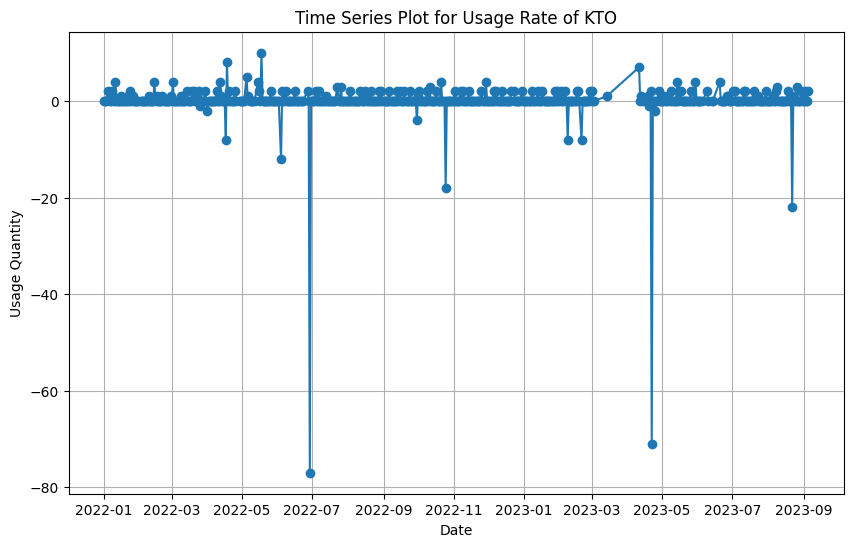

In [48]:
plt.figure(figsize=(10, 6))
plt.plot(df_imsc_KTO['datedim_date'], df_imsc_KTO['usage_quantity'], marker='o', linestyle='-')
plt.title('Time Series Plot for Usage Rate of KTO')
plt.xlabel('Date')
plt.ylabel('Usage Quantity')
plt.grid(True)
plt.show()

#### Box Plot for Total Volume of KTO Inserts

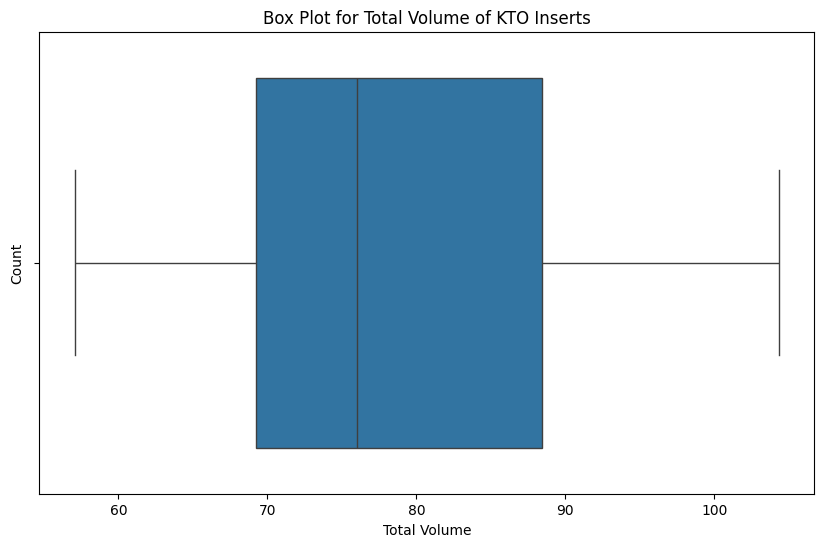

In [49]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='total_volume', data=df_imsc_KTO)
plt.title('Box Plot for Total Volume of KTO Inserts')
plt.xlabel('Total Volume')
plt.ylabel('Count')
plt.show()


#### Usage Quantity vs. Total Volume for KTO

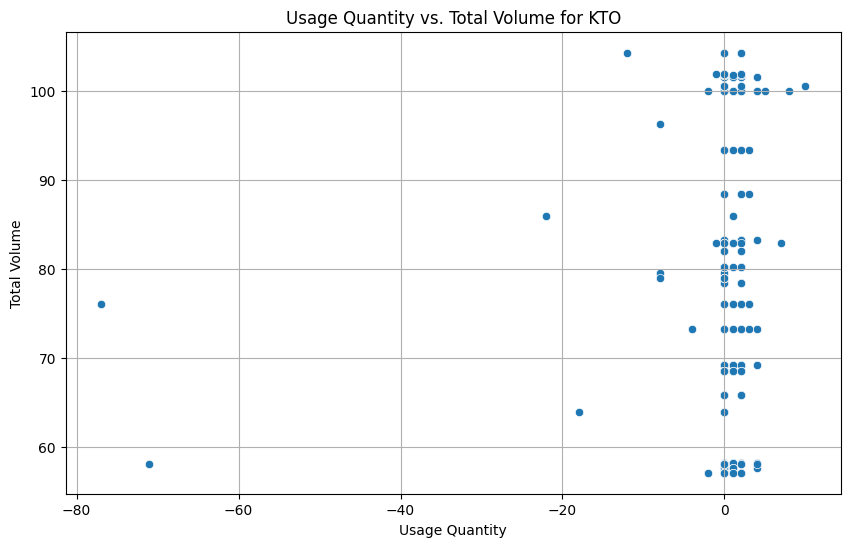

In [50]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='usage_quantity', y='total_volume', data=df_imsc_KTO)
plt.title('Usage Quantity vs. Total Volume for KTO')
plt.xlabel('Usage Quantity')
plt.ylabel('Total Volume')
plt.grid(True)
plt.show()

####Discard, Installed, and Stowed Over Time for KTO

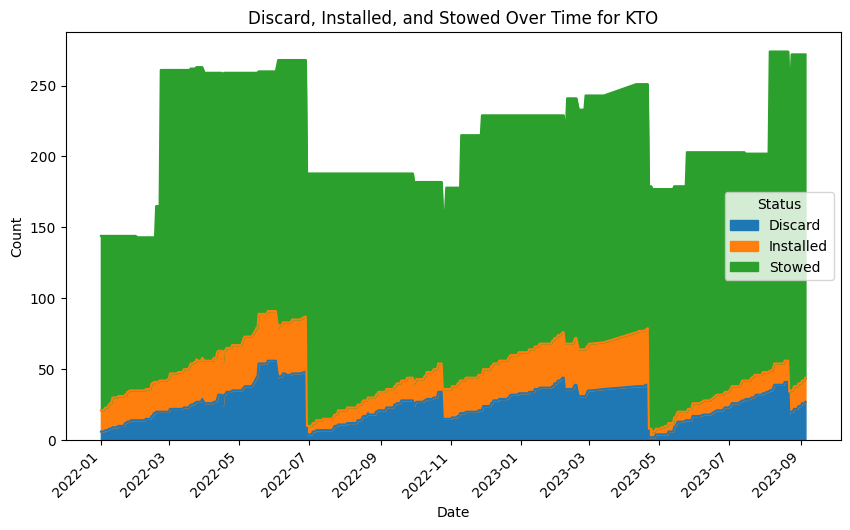

In [51]:
status_counts = df_imsc_KTO.groupby('datedim_date')[['Discard', 'Installed', 'Stowed']].sum()
status_counts.plot(kind='area', stacked=True, figsize=(10, 6))
plt.title('Discard, Installed, and Stowed Over Time for KTO')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Status')
plt.show()


### EDV

In [52]:
df_imsc_EDV= df_imsc_Pivot.sort_values(by=['category_name', 'datedim_date'])
df_imsc_EDV =df_imsc_EDV[df_imsc_EDV['category_name']=='EDV']
df_imsc_EDV['usage_quantity'] = df_imsc_EDV['Discard']+df_imsc_EDV['Installed']-df_imsc_EDV['Discard'].shift(1)-df_imsc_EDV['Installed'].shift(1)
df_imsc_EDV['usage_quantity'].fillna(0, inplace=True)
df_imsc_EDV = pd.merge(df_imsc_EDV, crew_count_agg, on='datedim_date', how='left')
df_imsc_EDV

,category_name,datedim_date,Discard,Installed,Stowed,total_volume,usage_quantity,crew_count
0,EDV,2022-01-01,0,2,33,4.92274,0.0,7
1,EDV,2022-01-02,0,2,33,4.92274,0.0,7
2,EDV,2022-01-03,0,2,33,4.92274,0.0,7
3,EDV,2022-01-05,1,3,31,4.92274,2.0,7
4,EDV,2022-01-06,1,3,31,4.92274,0.0,7
...,...,...,...,...,...,...,...,...
539,EDV,2023-09-01,1,4,33,5.25964,0.0,11
540,EDV,2023-09-02,1,4,33,5.25964,0.0,11
541,EDV,2023-09-03,1,4,33,5.25964,0.0,7
542,EDV,2023-09-04,1,4,33,5.25964,0.0,7


### Filter Inserts

In [53]:
df_imsc_FI= df_imsc_Pivot.sort_values(by=['category_name', 'datedim_date'])
df_imsc_FI =df_imsc_FI[df_imsc_FI['category_name']=='Filter Inserts']
df_imsc_FI['usage_quantity'] = df_imsc_FI['Discard']+df_imsc_FI['Installed']-df_imsc_FI['Discard'].shift(1)-df_imsc_FI['Installed'].shift(1)
df_imsc_FI['usage_quantity'].fillna(0, inplace=True)
df_imsc_FI = pd.merge(df_imsc_FI,crew_count_agg, on='datedim_date', how='left')
df_imsc_FI

,category_name,datedim_date,Discard,Installed,Stowed,total_volume,usage_quantity,crew_count
0,Filter Inserts,2022-01-01,3,3,29,0.1943,0.0,7
1,Filter Inserts,2022-01-02,3,3,29,0.1943,0.0,7
2,Filter Inserts,2022-01-03,3,3,29,0.1943,0.0,7
3,Filter Inserts,2022-01-05,3,3,29,0.1943,0.0,7
4,Filter Inserts,2022-01-06,3,3,29,0.1943,0.0,7
...,...,...,...,...,...,...,...,...
539,Filter Inserts,2023-09-01,5,4,21,0.1838,0.0,11
540,Filter Inserts,2023-09-02,5,4,21,0.1838,0.0,11
541,Filter Inserts,2023-09-03,5,4,21,0.1838,0.0,7
542,Filter Inserts,2023-09-04,5,4,21,0.1838,0.0,7


### Pretreat Tanks

In [54]:
df_imsc_PT= df_imsc_Pivot.sort_values(by=['category_name', 'datedim_date'])
df_imsc_PT =df_imsc_PT[df_imsc_PT['category_name']=='Pretreat Tanks']
df_imsc_PT['usage_quantity'] = df_imsc_PT['Discard']+df_imsc_PT['Installed']-df_imsc_PT['Discard'].shift(1)-df_imsc_PT['Installed'].shift(1)
df_imsc_PT['usage_quantity'].fillna(0, inplace=True)
df_imsc_PT = pd.merge(df_imsc_PT,crew_count_agg, on='datedim_date', how='left')
df_imsc_PT

,category_name,datedim_date,Discard,Installed,Stowed,total_volume,usage_quantity,crew_count
0,Pretreat Tanks,2022-01-01,1,4,14,3.75557,0.0,7
1,Pretreat Tanks,2022-01-02,1,4,14,3.75557,0.0,7
2,Pretreat Tanks,2022-01-03,1,4,14,3.75557,0.0,7
3,Pretreat Tanks,2022-01-05,1,4,14,3.75557,0.0,7
4,Pretreat Tanks,2022-01-06,1,4,14,3.75557,0.0,7
...,...,...,...,...,...,...,...,...
539,Pretreat Tanks,2023-09-01,4,3,8,2.82840,0.0,11
540,Pretreat Tanks,2023-09-02,4,3,8,2.82840,0.0,11
541,Pretreat Tanks,2023-09-03,4,3,8,2.82840,0.0,7
542,Pretreat Tanks,2023-09-04,4,3,8,2.82840,0.0,7


## Discovering and Analyzing iss_flight_plan_20220101-20251231.csv

Cleaning up flight plan data by dropping any rows which have all NaN values except for datedim columns.

In [55]:
df_fltpln.dropna(subset=df_fltpln.columns.difference(['datedim']), how='all', inplace=True)
df_fltpln_dock=df_fltpln[df_fltpln['event']=='Dock']
df_fltpln_dock

,datedim,vehicle_name,port_name,vehicle_type,eva_name,eva_type,eva_accuracy,event
47,2/17/2022,80Progress,MRM2 / SM Zenith,Progress,NaN,NaN,NaN,Dock
51,2/21/2022,NG-17,N1 Nadir,CRS2 Cygnus,NaN,NaN,NaN,Dock
76,3/18/2022,67Soyuz,NM,Soyuz,NaN,NaN,NaN,Dock
98,4/9/2022,Ax-1,N2 Zenith,PAM - SpaceX,NaN,NaN,NaN,Dock
116,4/27/2022,Crew-4,N2 Zenith,Crew Dragon,NaN,NaN,NaN,Dock
...,...,...,...,...,...,...,...,...
1356,9/10/2025,74Soyuz,MRM1 / FGB Nadir,Soyuz,NaN,NaN,NaN,Dock
1381,10/5/2025,CRS 2-24,N2 Nadir,CRS2,NaN,NaN,NaN,Dock
1409,11/2/2025,NG-24,N1 Nadir,CRS2 Cygnus,NaN,NaN,NaN,Dock
1434,11/27/2025,PAM-7,N2 Zenith,PAM,NaN,NaN,NaN,Dock


## Discovering and Analyzing iss_flight_plan_crew_20220101-20251321.csv




Filtering with crew_count more than 0.

In [56]:
df_fltpln_cr[df_fltpln_cr['crew_count']>0]

,datedim_date,nationality_category,crew_count
1559,2022-04-09,Commercial,4
1560,2022-04-10,Commercial,4
1561,2022-04-11,Commercial,4
1562,2022-04-12,Commercial,4
1563,2022-04-13,Commercial,4
...,...,...,...
17527,2025-12-27,USOS,4
17528,2025-12-28,USOS,4
17529,2025-12-29,USOS,4
17530,2025-12-30,USOS,4


In [57]:
crew_count_agg = df_fltpln_cr.groupby('datedim_date')['crew_count'].sum().reset_index()
crew_count_agg

,datedim_date,crew_count
0,2022-01-01,7
1,2022-01-02,7
2,2022-01-03,7
3,2022-01-04,7
4,2022-01-05,7
...,...,...
1456,2025-12-27,7
1457,2025-12-28,7
1458,2025-12-29,7
1459,2025-12-30,7


####Bar Plot for Crew Count Over Time

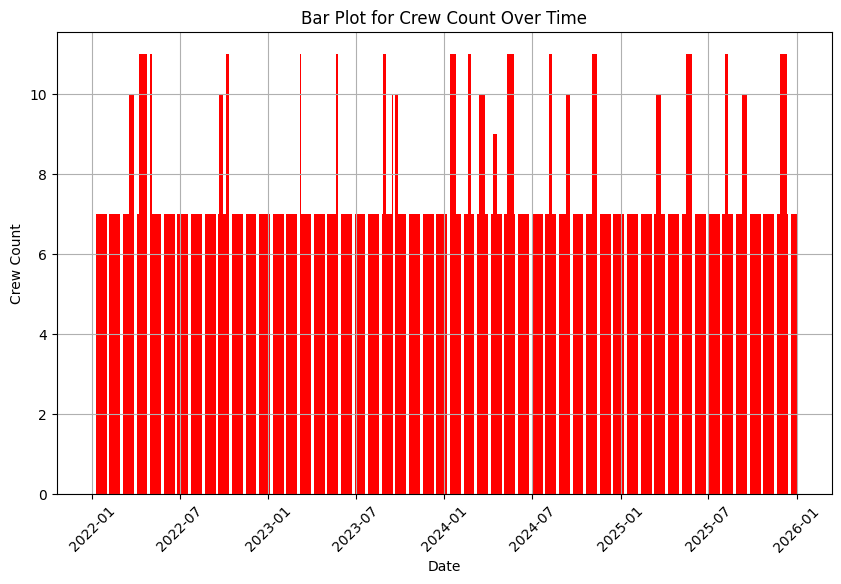

In [58]:
import matplotlib.pyplot as plt

# Set figure size
plt.figure(figsize=(10, 6))

plt.bar(crew_count_agg['datedim_date'], crew_count_agg['crew_count'], color='red')

# Add plot title and labels
plt.title('Bar Plot for Crew Count Over Time')
plt.xlabel('Date')
plt.ylabel('Crew Count')
plt.xticks(rotation=45)

# Display grid lines
plt.grid(True)

# Show the plot
plt.show()

##Discovering and Analyzing iss_flight_plan_crew_nationality_lookup.csv

In [59]:
df_fltpln_cr_nat

,nationality,is_usos_crew,is_rsa_crew
0,Commercial,0,0
1,CSA,1,0
2,ESA,1,0
3,JAXA,1,0
4,NASA,1,0
5,USOS,1,0
6,RSA,0,1
7,ASI,1,0
8,"NASA, USOS",1,0
9,SFP,0,1


##Discovering and Analyzing rates_definition.csv

In [60]:
df_rtdefn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24 entries, 0 to 23
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   rate_category        24 non-null     object 
 1   affected_consumable  24 non-null     object 
 2   rate                 24 non-null     float64
 3   units                24 non-null     object 
 4   type                 24 non-null     object 
 5   efficiency           1 non-null      float64
dtypes: float64(2), object(4)
memory usage: 1.2+ KB


In [61]:
df_rtdefn

,rate_category,affected_consumable,rate,units,type,efficiency
0,US Food BOBs,US Food BOBs,0.027000,BOBS/Crew/Day,usage,NaN
1,RS Food,RS Food Rations,0.200000,Rations/Crew/Day,usage,NaN
2,ACY Inserts,ACY Inserts,1.300000,Insert/Crew/Day,usage,NaN
3,KTO,KTO,0.035714,KTO/Crew/day,usage,NaN
4,Pretreat Tank,Pretreat Tanks,0.005556,Pretreat/Crew/Day,usage,NaN
5,Filter Inserts,Filter Inserts,0.007576,Insert Filter/Crew/Day,usage,NaN
6,Urine Receptacle,Urine Receptacle,0.007576,Urine Receptacle/Crew/Day,usage,NaN
7,Crew Metabolic O2 Usage,Oxygen,1.830000,lbs/Crew/Day,usage,NaN
8,Oxygen Generation Assembly (OGA),Oxygen,20.400000,lbs/Day*Efficiency,generation,1.0
9,PrK Leakage Air,Air,0.750000,lbs/Day,usage,NaN


##Discovering and Analyzing rsa_consumable_water_summary_20220103-20230828.csv

In [62]:
df_rsac_wat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87 entries, 0 to 86
Data columns (total 4 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Report Date                 87 non-null     object 
 1   Remain. Potable (liters)    87 non-null     float64
 2   Remain. Technical (liters)  87 non-null     float64
 3   Remain. Rodnik (liters)     87 non-null     int64  
dtypes: float64(2), int64(1), object(1)
memory usage: 2.8+ KB


Converting Report Date column to datetime datatype

In [63]:
df_rsac_wat['Report Date']=pd.to_datetime(df_rsac_wat['Report Date'])

Checking info of dataframe to makesure datatype is converted to datetime.

In [64]:
df_rsac_wat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87 entries, 0 to 86
Data columns (total 4 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   Report Date                 87 non-null     datetime64[ns]
 1   Remain. Potable (liters)    87 non-null     float64       
 2   Remain. Technical (liters)  87 non-null     float64       
 3   Remain. Rodnik (liters)     87 non-null     int64         
dtypes: datetime64[ns](1), float64(2), int64(1)
memory usage: 2.8 KB


In [65]:
df_rsac_wat

,Report Date,Remain. Potable (liters),Remain. Technical (liters),Remain. Rodnik (liters)
0,2022-01-03,340.0,187.60,234
1,2022-01-10,362.0,222.30,146
2,2022-01-19,360.0,188.20,146
3,2022-01-24,358.0,152.70,146
4,2022-01-31,334.0,149.30,146
...,...,...,...,...
82,2023-07-31,171.0,246.20,23
83,2023-08-07,169.0,220.60,23
84,2023-08-14,144.0,180.02,23
85,2023-08-21,118.0,168.70,23


##Discovering and Analyzing tank_capacity_definition.csv


In [66]:
df_tnkcap

,tank_category,tank_capacity,units
0,NORS O2 Tank,84.0,lbs
1,NORS N2 Tank,63.0,lbs
2,COTS Air Tank,7.4,lbs


##Discovering and Analyzing thresholds_limits_definition.csv

In [67]:
df_thresh

,threshold_category,threshold_value,threshold_owner,units
0,ACY Insert,800.0,USOS,ACY Inserts
1,KTO,22.0,USOS,KTO
2,Pretreat Tanks,4.0,USOS,Pretreat Tanks
3,Filter Inserts,4.0,USOS,Filter Inserts
4,Urine Receptacle,4.0,USOS,Urine Receptacles
5,EDVs,21.0,USOS,EDVs
6,ACY Insert,239.0,RSOS,ACY Inserts
7,KTO,6.0,RSOS,KTO
8,Pretreat Tanks,1.0,RSOS,Pretreat Tanks
9,Filter Inserts,4.0,RSOS,Filter Inserts


## Discovering and Analyzing us_rs_weekly_consumable_gas_summary_20220102-20230903.csv

In [68]:
df_usrs_gas_sum

,Date,USOS O2 (kg),RS O2 (kg),US N2 (kg),RS N2 (kg),Adjusted O2 (kg),Adjusted N2 (kg),Resupply O2 (kg),Resupply N2 (kg),Resupply Air (kg)
0,1/2/2022,175.57,10.75,163.76,45.25,231.14,470.97,NaN,NaN,NaN
1,1/9/2022,175.57,10.75,163.76,45.25,231.14,470.97,NaN,NaN,NaN
2,1/16/2022,175.57,7.03,163.76,34.08,227.42,459.80,NaN,NaN,NaN
3,1/23/2022,175.57,6.88,160.96,33.63,227.27,456.55,NaN,NaN,NaN
4,1/30/2022,172.59,6.88,158.35,33.63,224.29,453.94,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
83,8/6/2023,236.12,0.00,147.50,15.60,236.12,163.10,NaN,NaN,NaN
84,8/13/2023,232.05,0.00,147.50,13.00,232.05,160.50,NaN,NaN,NaN
85,8/20/2023,233.77,0.00,147.50,13.00,233.77,160.50,NaN,NaN,NaN
86,8/27/2023,231.28,0.00,146.48,0.00,231.28,146.48,NaN,NaN,NaN


##Discovering and Analyzing us_weekly_consumable_water_summary_20220102-20230903.csv

In [69]:
df_wat_sum.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87 entries, 0 to 86
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Date                      87 non-null     object 
 1   Corrected Potable (L)     87 non-null     float64
 2   Corrected Technical  (L)  87 non-null     float64
 3   Corrected Total (L)       87 non-null     float64
 4   Resupply Potable (L)      4 non-null      float64
 5   Resupply Technical (L)    1 non-null      float64
 6   Corrected Predicted (L)   87 non-null     float64
 7   Unnamed: 7                0 non-null      float64
 8   Unnamed: 8                2 non-null      object 
dtypes: float64(7), object(2)
memory usage: 6.2+ KB


##Discovering and Analyzing vehicle_capacity_def.csv

In [70]:
df_veh_cap

,vehicle,ascent_capacity_ctbe,descent_capacity_ctbe,trash_capacity_ctbe,total_capacity_ctbe
0,SpX,100.0,100.0,NaN,NaN
1,NG,200.0,NaN,400.0,NaN
2,HTV-X,240.0,330.0,NaN,NaN
3,DCC,275.0,125.0,200.0,NaN
4,ISS,NaN,NaN,NaN,1582.5


# Progress Report #2


###Step 1 Identify numerical and categorical features in the Barrios dataset and list them out with their ranges and category values.

In [71]:
df_imsc.info()

<class 'pandas.core.frame.DataFrame'>
Index: 528001 entries, 0 to 5778004
Data columns (total 11 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   datedim_date       528001 non-null  datetime64[ns]
 1   id                 528001 non-null  int64         
 2   tree               528001 non-null  object        
 3   original_ip_owner  528001 non-null  object        
 4   current_ip_owner   528001 non-null  object        
 5   quantity           528001 non-null  int64         
 6   calculated_volume  522520 non-null  float64       
 7   expire_date        120280 non-null  datetime64[ns]
 8   status             527903 non-null  object        
 9   categoryID         528001 non-null  category      
 10  category_name      528001 non-null  category      
dtypes: category(2), datetime64[ns](2), float64(1), int64(2), object(4)
memory usage: 41.3+ MB


**Below code lists the data type and range for each numerical feature that we are using in df_imsc dataframe. Also counts the number of category in categorical feature in the dataset.**

In [72]:
numerical_features = df_imsc.select_dtypes(include=['int', 'float']).columns.tolist()
categorical_features = df_imsc.select_dtypes(include=['object', 'category']).columns.tolist()

numerical_ranges = df_imsc.describe().loc[['min', 'max']].transpose()

categorical_values = df_imsc_master[categorical_features].nunique()

print("Numerical Features:")
print(numerical_ranges)
print("\nCategorical Features:")
print(categorical_values)

Numerical Features:
                                   min                  max
datedim_date       2022-01-01 00:00:00  2023-09-05 00:00:00
id                              2901.0             502118.0
quantity                           1.0                  1.0
calculated_volume              0.00001              0.71288
expire_date        2013-11-13 19:00:00  2028-05-04 00:00:00

Categorical Features:
tree                 5
original_ip_owner    2
current_ip_owner     2
status               4
categoryID           7
category_name        8
dtype: int64


### Step 2: Show an example of each of the following single feature plots on Barrios dataset. Explain the results of each plot briefly.


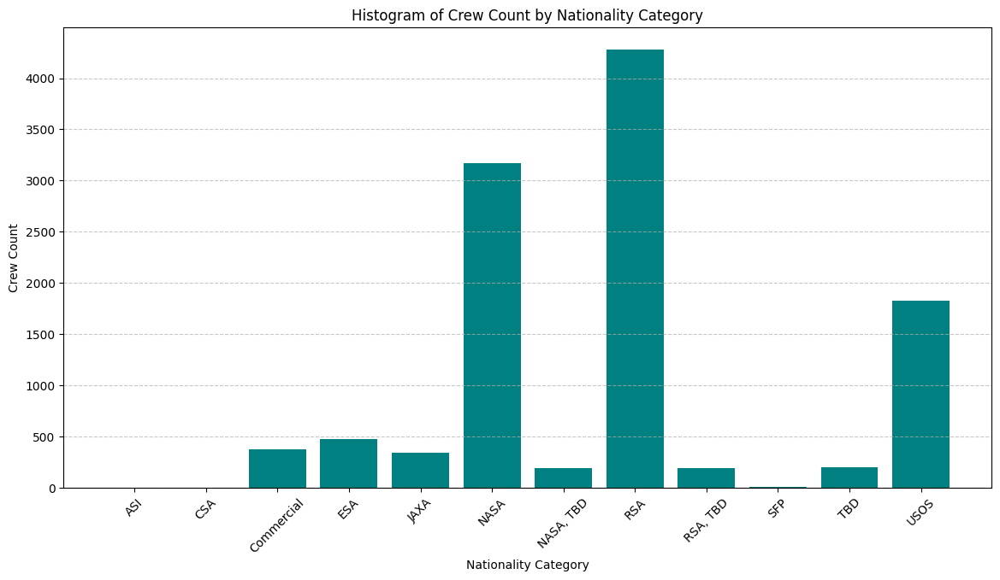

In [73]:
grouped_data = df_fltpln_cr.groupby('nationality_category')['crew_count'].sum().reset_index()
plt.figure(figsize=(14, 7))
plt.bar(grouped_data['nationality_category'], grouped_data['crew_count'], color='teal')
plt.title('Histogram of Crew Count by Nationality Category')
plt.xlabel('Nationality Category')
plt.ylabel('Crew Count')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

The histogram displaying the crew count by nationality category. Each bar represents a different nationality category with the respective crew count

**Creating density plot for category_name 'KTO'.**

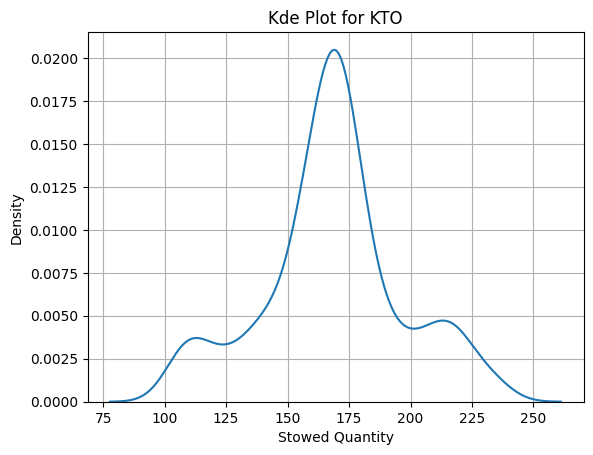

In [74]:
sns.kdeplot(df_imsc_KTO, x='Stowed')
plt.grid(True)
plt.title('Kde Plot for KTO')
plt.xlabel('Stowed Quantity')
plt.ylabel('Density')
plt.show()

The Kde plot above shows an even distribution of the consumable KTO centered around 0.0200.

**Creating countplot based on Ims consumable categories.**

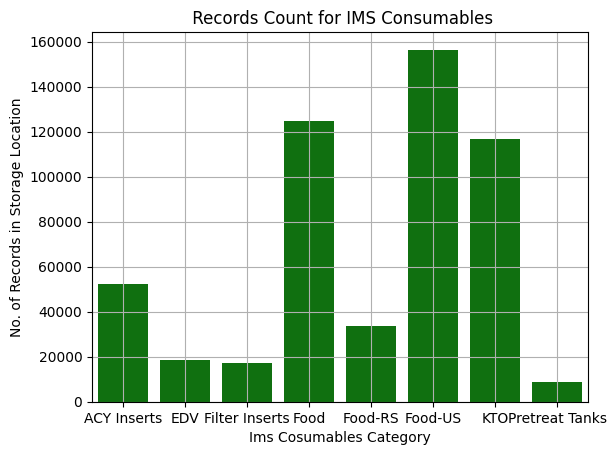

In [75]:
sns.countplot(df_imsc, x='category_name', color='green')
plt.title(' Records Count for IMS Consumables')
plt.xlabel('Ims Cosumables Category')
plt.ylabel('No. of Records in Storage Location')
plt.grid(True)

As expected, the above countplotdemonstrates that Food is the mostly used category in IMS consumables.

**Creating a Boxplot to demonstrate the tendencies for Pretreat Tanks**

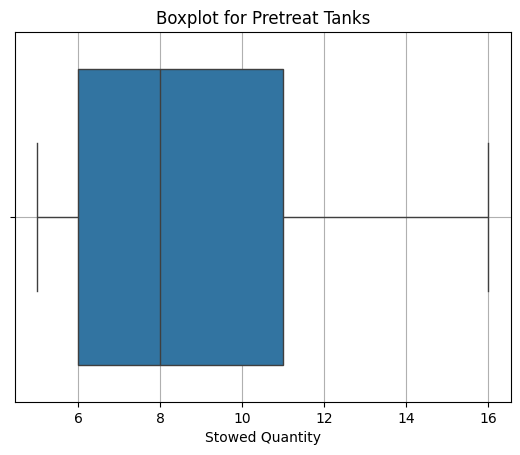

In [76]:
sns.boxplot(df_imsc_PT, x='Stowed')
plt.title('Boxplot for Pretreat Tanks')
plt.xlabel('Stowed Quantity')
plt.grid(True)

The boxplot above shows that the stowed quantity for Pretreat Tanks had a range from approximately 5 to 16, and the quantity is skewed towards the lower end of the range.

**Creating a Violin Plot for PreTreat Tanks**

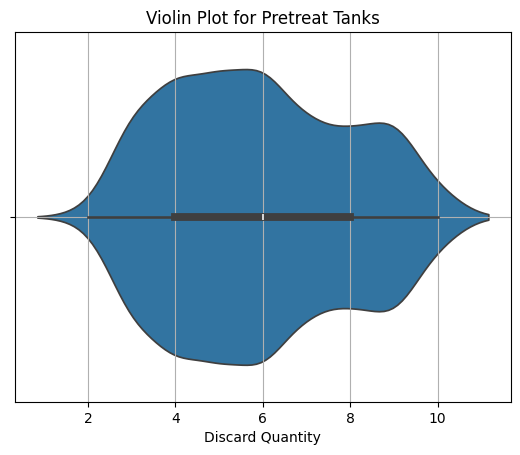

In [77]:
sns.violinplot(df_imsc_FI, x='Discard')
plt.title('Violin Plot for Pretreat Tanks')
plt.xlabel('Discard Quantity')

plt.grid(True)


The Violin plot above shows that the discard quantity of Pretreat Tanks tended to be closer to the lower end of the range from 1-11.

###Show an example of each of the following two feature plots on Barrios dataset. Use hue, style, and size parameters  as well.  Explain the results of each plot briefly.

In [78]:
df_mod=df_imsc_master
# df_mod=df_mod[df_mod['datedim']=='2022-01-01 10:01:08.690']
df_mod = df_mod.groupby(['category_name','datedim','tree', 'status']).agg({'quantity': 'sum', 'calculated_volume': 'sum'}).reset_index()
df_mod.shape
df_mod

,category_name,datedim,tree,status,quantity,calculated_volume
0,ACY Inserts,2022-01-01 10:01:08.690,Launch,Discard,0,0.00000
1,ACY Inserts,2022-01-01 10:01:08.690,Launch,Installed,0,0.00000
2,ACY Inserts,2022-01-01 10:01:08.690,Launch,Return,0,0.00000
3,ACY Inserts,2022-01-01 10:01:08.690,Launch,Stowed,0,0.00000
4,ACY Inserts,2022-01-01 10:01:08.690,Lost,Discard,0,0.00000
...,...,...,...,...,...,...
88155,Pretreat Tanks,2023-09-05 15:20:48.003,Storage Location,Stowed,8,1.47917
88156,Pretreat Tanks,2023-09-05 15:20:48.003,Trash,Discard,0,0.00000
88157,Pretreat Tanks,2023-09-05 15:20:48.003,Trash,Installed,0,0.00000
88158,Pretreat Tanks,2023-09-05 15:20:48.003,Trash,Return,0,0.00000


In [79]:
df_master_PT = df_mod.pivot_table(index=['category_name', 'datedim'],
                             columns=['tree','status'],
                             values='quantity',
                             aggfunc='sum',
                             fill_value=0)

df_master_PT.columns = ['_'.join(col).strip() for col in df_master_PT.columns.values]
df_master_PT.reset_index(inplace=True)
dtype_of_datedim = df_master_PT['datedim'].dtype
df_master_PT = df_master_PT.rename(columns={'datedim': 'datedim_date'})



df_master_PT['datedim_date']=df_master_PT['datedim_date'].dt.date
df_master_PT=df_master_PT.drop_duplicates(subset=['datedim_date','category_name'])
columns_to_exclude = ['category_name', 'datedim_date']  # List of columns to exclude
columns_to_include = [col for col in df_master_PT.columns if col not in columns_to_exclude]

# Select only the columns you want to include and then sum across rows
df_master_PT['total_qty'] = df_master_PT[columns_to_include].sum(axis=1)

df_master_PT dataframe holds filtered data with all IMS Consumables. It sums of data for each job run day and provides total count of quantity that are in different status such as Storage Location_Discard, Storage Location_Installed etc.

**Creating a Scatter Plot for the consumable category ACY Inserts**

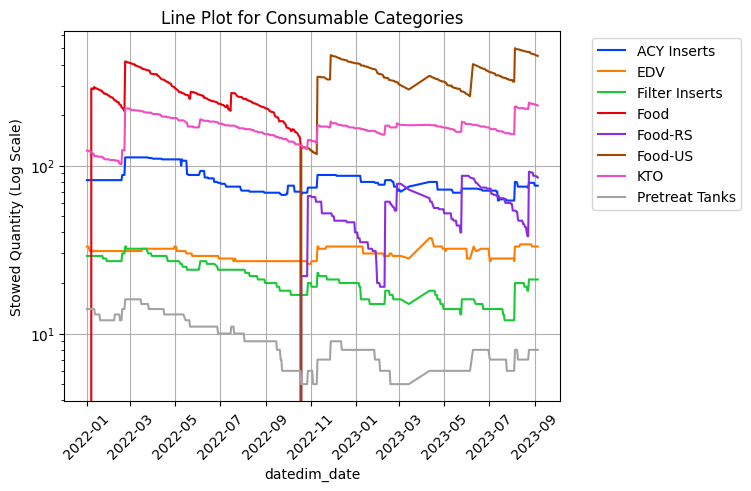

In [80]:
import seaborn as sns
import matplotlib.pyplot as plt

bright_palette = sns.color_palette("bright")

sns.lineplot(data=df_master_PT, x='datedim_date', y='Storage Location_Stowed', hue='category_name', palette=bright_palette)

plt.yscale('log')

plt.title('Line Plot for Consumable Categories')
plt.xlabel('datedim_date')
plt.ylabel('Stowed Quantity (Log Scale)')
plt.xticks(rotation=45)
plt.grid(True)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()


The scatter plot above shows a stowed quantity of all IMS Consumables from Jan. 2022 to Sept. 2023. From the graph, we can also note that Food-US is the most stowed consumables in Station.

**Creating a Swarm Plot to display tendencies in distribution/volume of each type of consumable.**

In [81]:
'''
plt.figure(figsize=(10, 6))
sns.swarmplot(data=df_master_PT, x='Storage Location_Stowed', y='category_name',hue='category_name')
plt.title('Swarm Plot of total_volume by category_name')
plt.xlabel('Total Volume')
plt.ylabel('Category Name')
plt.grid(True)
plt.show()
'''

"\nplt.figure(figsize=(10, 6))\nsns.swarmplot(data=df_master_PT, x='Storage Location_Stowed', y='category_name',hue='category_name')\nplt.title('Swarm Plot of total_volume by category_name')\nplt.xlabel('Total Volume')\nplt.ylabel('Category Name')\nplt.grid(True)\nplt.show()\n"

The swarm plot above shows gives the viewer an idea of the volume of each consumable the ISS likes to keep on hand. With the food items ranging on the high end.

**Creating a Strip Plot of Stowed Quanity of various consumables on the ISS.**

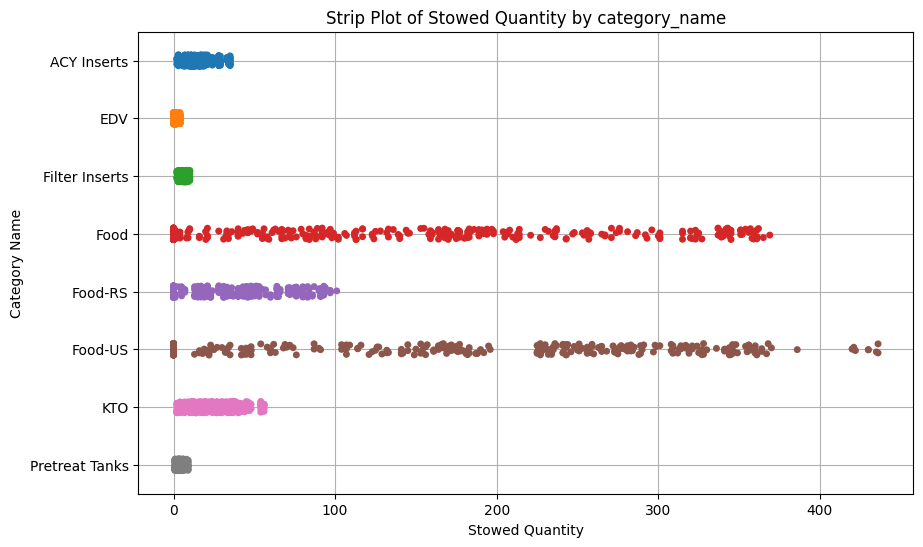

In [82]:
plt.figure(figsize=(10, 6))
sns.stripplot(data=df_master_PT, x='Storage Location_Discard', y='category_name',hue='category_name')
plt.title('Strip Plot of Stowed Quantity by category_name')
plt.xlabel('Stowed Quantity')
plt.ylabel('Category Name')
plt.grid(True)
plt.show()

The strip plot above helps a viewer visualize the range of discarded quantities of each consumable. From the plot, Food is the most discarded category.

### Step 4: Summarize the dataset using the following methods.


In [83]:
df_master_PT.shape

(4352, 23)

In [84]:
df_master_PT.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4352 entries, 0 to 4407
Data columns (total 23 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   category_name               4352 non-null   category
 1   datedim_date                4352 non-null   object  
 2   Launch_Discard              4352 non-null   int64   
 3   Launch_Installed            4352 non-null   int64   
 4   Launch_Return               4352 non-null   int64   
 5   Launch_Stowed               4352 non-null   int64   
 6   Lost_Discard                4352 non-null   int64   
 7   Lost_Installed              4352 non-null   int64   
 8   Lost_Return                 4352 non-null   int64   
 9   Lost_Stowed                 4352 non-null   int64   
 10  Return_Discard              4352 non-null   int64   
 11  Return_Installed            4352 non-null   int64   
 12  Return_Return               4352 non-null   int64   
 13  Return_Stowed          

From above we can see:

category_name: Categorical column with the name of the category.

datedim_date: Date column.

Launch_Discard through Trash_Stowed: These columns represent different actions (Launch, Lost, Return, Storage Location, Trash) with different outcomes (Discard, Installed, Return, Stowed) and quantities associated with each action.

total_qty: Total quantity associated with all actions.

In [85]:
df_master_PT.describe(include = "all")

,category_name,datedim_date,Launch_Discard,Launch_Installed,Launch_Return,Launch_Stowed,Lost_Discard,Lost_Installed,Lost_Return,Lost_Stowed,...,Return_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Return,Storage Location_Stowed,Trash_Discard,Trash_Installed,Trash_Return,Trash_Stowed,total_qty
count,4352,4352,4352.0,4352.0,4352.0,4352.000000,4352.000000,4352.0,4352.0,4352.000000,...,4352.000000,4352.000000,4352.000000,4352.0,4352.000000,4352.0,4352.000000,4352.0,4352.000000,4352.000000
unique,8,544,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,ACY Inserts,2022-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,544,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,0.0,0.0,0.0,2.067096,0.989200,0.0,0.0,10.714844,...,107.287454,32.524586,8.562960,0.0,80.122013,0.0,0.250000,0.0,2.420726,1379.075827
std,NaN,NaN,0.0,0.0,0.0,12.683246,2.044129,0.0,0.0,16.273837,...,104.328459,72.199243,10.927024,0.0,105.137677,0.0,0.661514,0.0,5.219799,1637.196392
min,NaN,NaN,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,...,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000
25%,NaN,NaN,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,...,24.000000,1.000000,0.000000,0.0,8.000000,0.0,0.000000,0.0,0.000000,81.000000
50%,NaN,NaN,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,3.000000,...,44.000000,6.000000,3.000000,0.0,31.000000,0.0,0.000000,0.0,0.000000,395.000000
75%,NaN,NaN,0.0,0.0,0.0,0.000000,1.000000,0.0,0.0,14.000000,...,181.000000,22.000000,19.000000,0.0,112.000000,0.0,0.000000,0.0,1.000000,2505.000000


Above function provides statisctial data for each columns. There are 8 unique categories, 544 frequency for each category. Average items launched through Flights are 2.067 per day.



### Step 5: Show examples of the following visualization methods on selected dataset columns. Try to interpret the results that are interesting and useful.

In [86]:
df_master_PT_flt=df_master_PT[['category_name','datedim_date','Launch_Stowed','Storage Location_Discard','Storage Location_Installed','Storage Location_Stowed','total_qty']]
df_master_PT_flt

,category_name,datedim_date,Launch_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,total_qty
0,ACY Inserts,2022-01-01,0,11,0,82,1291
1,ACY Inserts,2022-01-02,0,11,0,82,1291
2,ACY Inserts,2022-01-03,0,11,0,82,1291
3,ACY Inserts,2022-01-05,0,11,0,82,1291
4,ACY Inserts,2022-01-06,0,11,0,82,1291
...,...,...,...,...,...,...,...
4403,Pretreat Tanks,2023-09-01,0,4,3,8,222
4404,Pretreat Tanks,2023-09-02,0,4,3,8,222
4405,Pretreat Tanks,2023-09-03,0,4,3,8,222
4406,Pretreat Tanks,2023-09-04,0,4,3,8,222


Filtering only interested data for histogram.

<Figure size 1200x800 with 0 Axes>

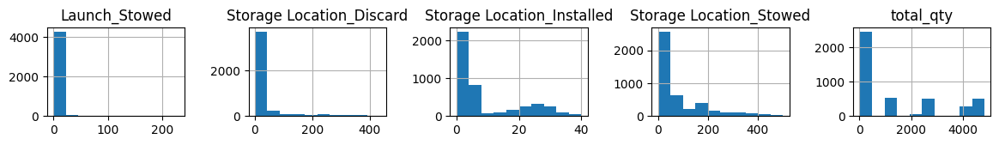

In [87]:
plt.figure(figsize=(12, 8))
df_master_PT_flt.hist(layout=(5, 5), figsize=(12, 8))
plt.tight_layout(pad=2.0)


Histogram for every columns in the data frame.

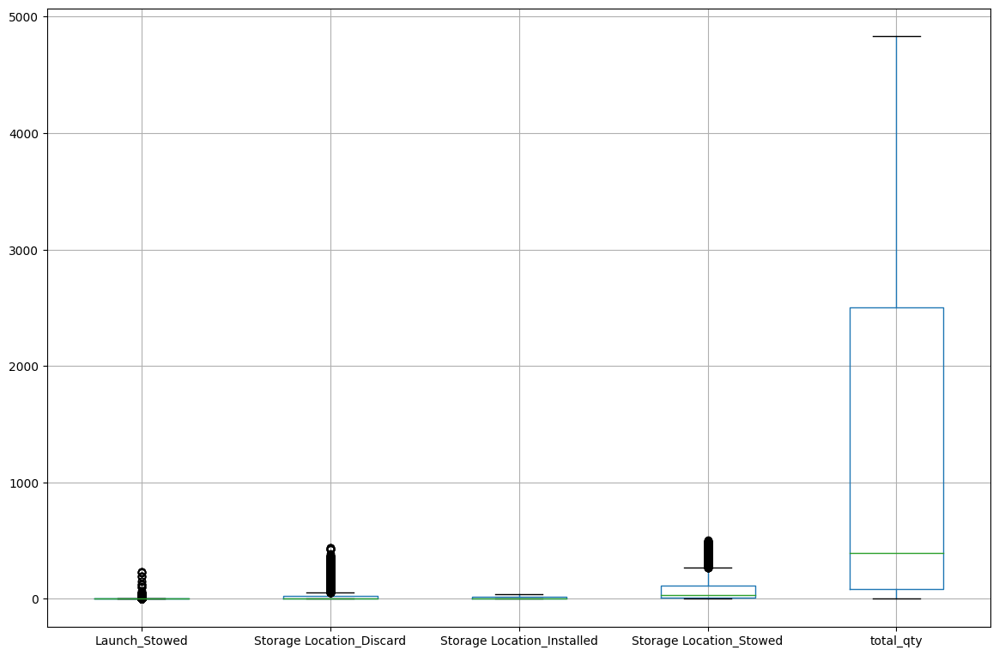

In [88]:
plt.figure(figsize=(12, 8))
df_master_PT_flt.boxplot(figsize=(12, 8))
plt.tight_layout(pad=2.0)

Box plot for every columns in data frame.

array([[<Axes: xlabel='Launch_Stowed', ylabel='Launch_Stowed'>,
        <Axes: xlabel='Storage Location_Discard', ylabel='Launch_Stowed'>,
        <Axes: xlabel='Storage Location_Installed', ylabel='Launch_Stowed'>,
        <Axes: xlabel='Storage Location_Stowed', ylabel='Launch_Stowed'>,
        <Axes: xlabel='total_qty', ylabel='Launch_Stowed'>],
       [<Axes: xlabel='Launch_Stowed', ylabel='Storage Location_Discard'>,
        <Axes: xlabel='Storage Location_Discard', ylabel='Storage Location_Discard'>,
        <Axes: xlabel='Storage Location_Installed', ylabel='Storage Location_Discard'>,
        <Axes: xlabel='Storage Location_Stowed', ylabel='Storage Location_Discard'>,
        <Axes: xlabel='total_qty', ylabel='Storage Location_Discard'>],
       [<Axes: xlabel='Launch_Stowed', ylabel='Storage Location_Installed'>,
        <Axes: xlabel='Storage Location_Discard', ylabel='Storage Location_Installed'>,
        <Axes: xlabel='Storage Location_Installed', ylabel='Storage Location_I

<Figure size 1200x800 with 0 Axes>

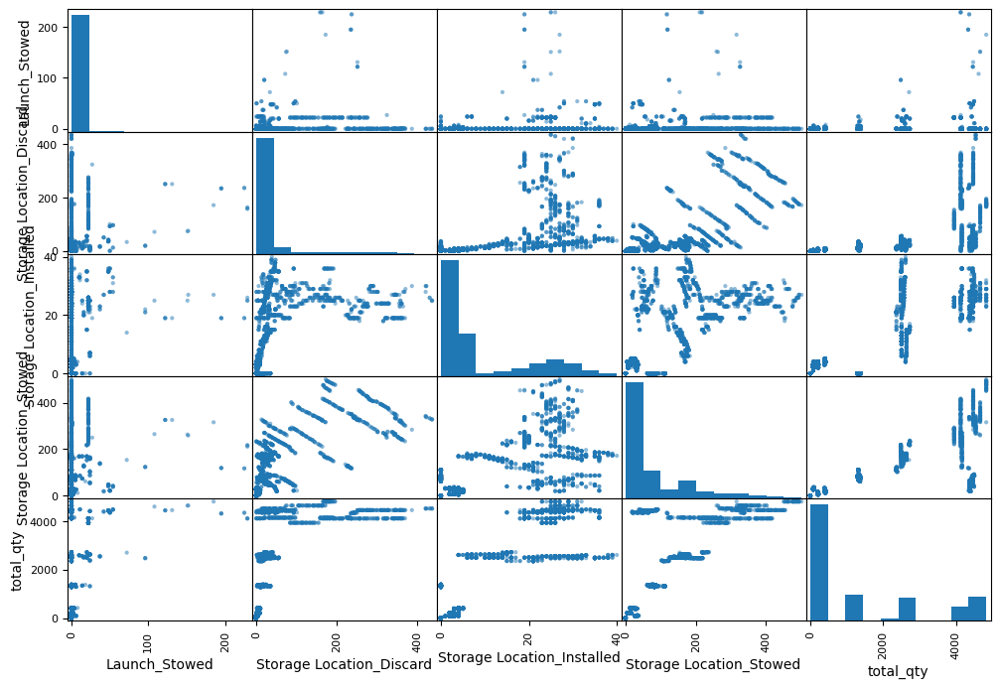

In [89]:
plt.figure(figsize=(12, 8))
pd.plotting.scatter_matrix(df_master_PT_flt, figsize=(12, 8))

Plotting every pair of numerical feature as an individual scatter plot.

###Step 6: Try to find outliers in the dataset such as the following, show examples, and show how you are cleaning them.


In [90]:
df_master_PT_flt['usage_qty']=df_master_PT['Storage Location_Stowed']-df_master_PT_flt['Storage Location_Stowed'].shift(1)
df_master_PT_flt['usage_qty'].fillna(0,inplace=True)

In [91]:
df_master_PT_flt

,category_name,datedim_date,Launch_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,total_qty,usage_qty
0,ACY Inserts,2022-01-01,0,11,0,82,1291,0.0
1,ACY Inserts,2022-01-02,0,11,0,82,1291,0.0
2,ACY Inserts,2022-01-03,0,11,0,82,1291,0.0
3,ACY Inserts,2022-01-05,0,11,0,82,1291,0.0
4,ACY Inserts,2022-01-06,0,11,0,82,1291,0.0
...,...,...,...,...,...,...,...,...
4403,Pretreat Tanks,2023-09-01,0,4,3,8,222,0.0
4404,Pretreat Tanks,2023-09-02,0,4,3,8,222,0.0
4405,Pretreat Tanks,2023-09-03,0,4,3,8,222,0.0
4406,Pretreat Tanks,2023-09-04,0,4,3,8,222,0.0


In [92]:
df_master_PT_flt['category_name'].unique()

['ACY Inserts', 'EDV', 'Filter Inserts', 'Food', 'Food-RS', 'Food-US', 'KTO', 'Pretreat Tanks']
Categories (8, object): ['ACY Inserts', 'EDV', 'Filter Inserts', 'Food', 'Food-RS', 'Food-US', 'KTO',
                         'Pretreat Tanks']

<Figure size 1200x800 with 0 Axes>

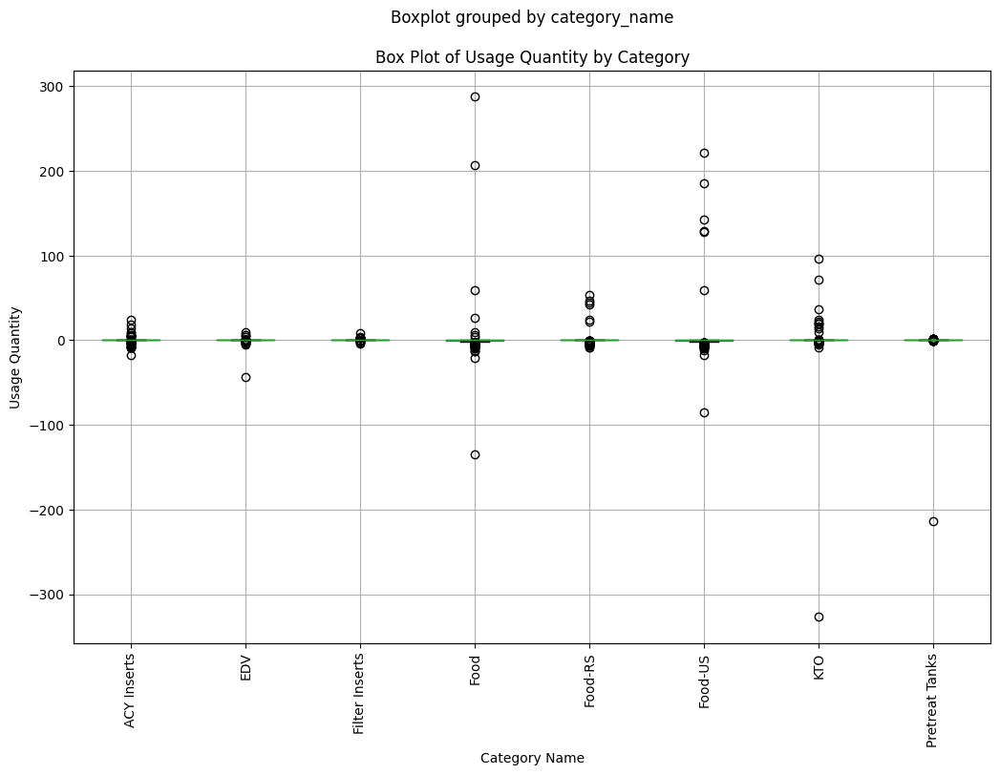

In [93]:
plt.figure(figsize=(12, 8))
df_master_PT_flt.boxplot(column='usage_qty', by='category_name', figsize=(12, 8), rot=90)
plt.title('Box Plot of Usage Quantity by Category')
plt.xlabel('Category Name')
plt.ylabel('Usage Quantity')
plt.show()

From above box plot, we can note that certain usage quantity are way outside the whiskers of the box plot , which notes the presence of the outliers in the data.

In [94]:
df_master_PT_flt[df_master_PT_flt['usage_qty']<-10]

,category_name,datedim_date,Launch_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,total_qty,usage_qty
128,ACY Inserts,2022-05-17,0,34,0,89,1321,-18.0
551,EDV,2022-01-01,0,0,2,33,81,-43.0
1653,Food,2022-01-01,0,0,0,0,0,-21.0
1738,Food,2022-03-28,22,227,25,356,4128,-13.0
1833,Food,2022-07-12,0,16,19,216,4133,-12.0
1930,Food,2022-10-18,0,221,20,135,4168,-13.0
1931,Food,2022-10-19,0,0,0,0,0,-135.0
2755,Food-US,2022-01-01,0,0,0,0,0,-85.0
3166,Food-US,2023-03-14,0,386,30,284,4474,-17.0
3229,Food-US,2023-06-20,0,104,27,382,4665,-12.0


From above most of the data in date '2022-01-01' is less than 0. It is because of the calculation error, since usage qty is getting subtracted with usage qty of different category data.Hence, we can set those values to 0.

In [95]:
df_master_PT_flt['datedim_date'] = pd.to_datetime(df_master_PT_flt['datedim_date'])
df_master_PT_flt.loc[df_master_PT_flt['datedim_date'] == '2022-01-01', 'usage_qty']=0

In [96]:
df_master_PT_flt[df_master_PT_flt['usage_qty']<0]

,category_name,datedim_date,Launch_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,total_qty,usage_qty
83,ACY Inserts,2022-03-26,0,12,0,111,1321,-1.0
88,ACY Inserts,2022-04-01,0,13,0,110,1321,-1.0
100,ACY Inserts,2022-04-13,0,14,0,109,1321,-1.0
122,ACY Inserts,2022-05-09,0,14,0,100,1321,-9.0
124,ACY Inserts,2022-05-11,0,16,0,107,1321,-2.0
...,...,...,...,...,...,...,...,...
4241,Pretreat Tanks,2023-02-03,0,6,4,6,214,-1.0
4254,Pretreat Tanks,2023-02-17,0,7,4,5,214,-1.0
4342,Pretreat Tanks,2023-07-02,0,4,2,7,219,-1.0
4365,Pretreat Tanks,2023-07-25,0,4,3,6,219,-1.0



Since usage_qty cannot be less than 0, we can set other values less than 0 to 0 as well.

In [97]:
def replace_negatives_with_zero(x):
    if x < 0:
        return 0
    else:
        return x

Creating function to set any negative usage qty to 0

In [98]:
df_master_PT_flt['usage_qty']=df_master_PT_flt['usage_qty'].apply(replace_negatives_with_zero)

In [99]:
df_master_PT_flt[df_master_PT_flt['usage_qty']<0]

,category_name,datedim_date,Launch_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,total_qty,usage_qty


In [100]:
df_master_PT_flt

,category_name,datedim_date,Launch_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,total_qty,usage_qty
0,ACY Inserts,2022-01-01,0,11,0,82,1291,0.0
1,ACY Inserts,2022-01-02,0,11,0,82,1291,0.0
2,ACY Inserts,2022-01-03,0,11,0,82,1291,0.0
3,ACY Inserts,2022-01-05,0,11,0,82,1291,0.0
4,ACY Inserts,2022-01-06,0,11,0,82,1291,0.0
...,...,...,...,...,...,...,...,...
4403,Pretreat Tanks,2023-09-01,0,4,3,8,222,0.0
4404,Pretreat Tanks,2023-09-02,0,4,3,8,222,0.0
4405,Pretreat Tanks,2023-09-03,0,4,3,8,222,0.0
4406,Pretreat Tanks,2023-09-04,0,4,3,8,222,0.0


<Figure size 1200x800 with 0 Axes>

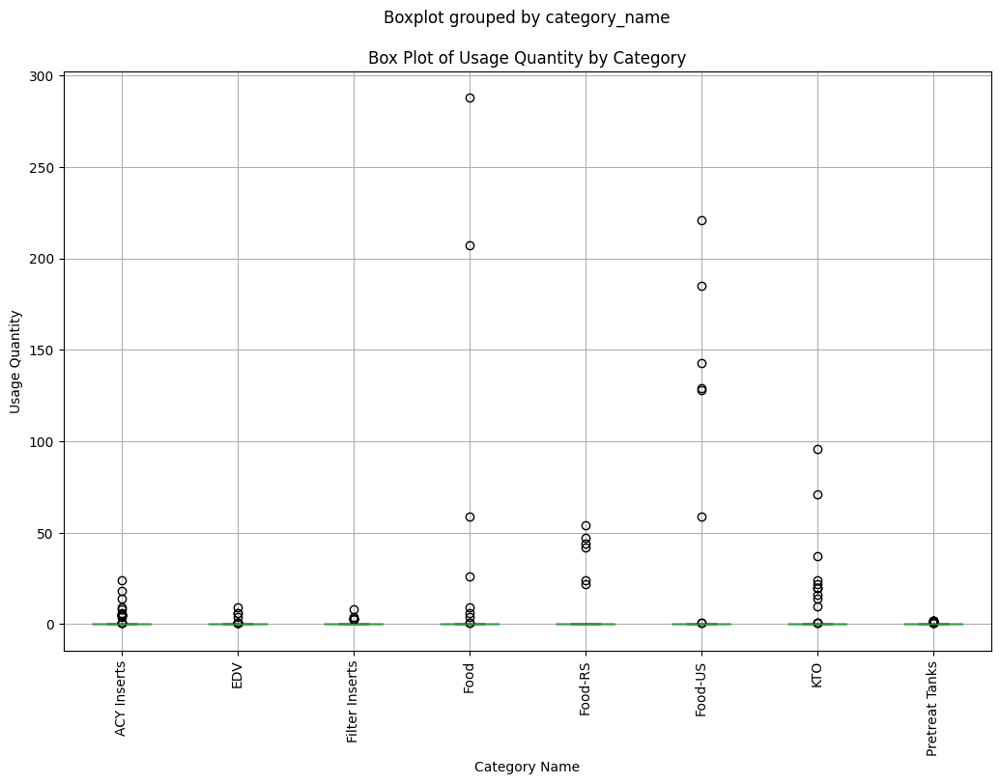

In [101]:
plt.figure(figsize=(12, 8))
df_master_PT_flt.boxplot(column='usage_qty', by='category_name', figsize=(12, 8), rot=90)
plt.title('Box Plot of Usage Quantity by Category')
plt.xlabel('Category Name')
plt.ylabel('Usage Quantity')
plt.show()

From the box plot, we can not that all the negative values are removed now.

In [102]:
df_master_PT_flt[df_master_PT_flt['usage_qty']>100]

,category_name,datedim_date,Launch_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,total_qty,usage_qty
1659,Food,2022-01-07,22,84,23,288,3950,288.0
1704,Food,2022-02-22,22,164,26,418,4130,207.0
3033,Food-US,2022-10-19,0,227,20,128,4167,128.0
3055,Food-US,2022-11-10,0,241,19,338,4365,221.0
3073,Food-US,2022-11-28,0,253,19,455,4473,129.0
3220,Food-US,2023-06-09,0,87,25,402,4665,143.0
3274,Food-US,2023-08-05,0,172,27,501,4831,185.0


I think there is a good possibility of Food being consumed at higher quantity. Also as per domain knowledge, FOOD used consist of both Food-US and Food-RS before 2022-10-19. So we can consider these values for the calculations.

### Plots for ACY Inserts
Please use below navigations for Plots


[Time Series Plot for Usage Rate of ACY Inserts](#scrollTo=usOWvszSB6X7)


[Box Plot for Total Volume of ACY Inserts](#scrollTo=aMXvvX_QcsPm)

[Scatter Plot of Usage Quantity vs. Total Volume for ACY Insert](#scrollTo=NESYUnVMnLyp)

[Discard, Installed, and Stowed Over Time for ACY Inserts](#scrollTo=iXTyMLX4oqyE)

### Plots for Crew Count

[Line Plot for Crew Count Over Time](#scrollTo=CWC7kPD0tvh7)


### Plots for KTO

[Time Series Plot for Usage Rate of KTO](#scrollTo=2uO3kGSHmsVt)


[Box Plot for Total Volume of KTO](#scrollTo=8bML3uv-pobl)

[Scatter Plot of Usage Quantity vs. Total Volume for KTO](#scrollTo=5SzIQ8jSquf8)

[Discard, Installed, and Stowed Over Time for KTO](#scrollTo=bkELjTePrDO5)

# Progress Report #3

### Data Preparation for Machine Learning

In [103]:
df_imsc_master= df_imsc_master.groupby(['category_name','datedim','tree', 'status']).agg({'quantity': 'sum', 'calculated_volume': 'sum'}).reset_index()
df_imsc_master.shape

(88160, 6)

In [104]:
df_master_PT = df_imsc_master.pivot_table(index=['category_name', 'datedim'],
                             columns=['tree','status'],
                             values='quantity',
                             aggfunc='sum',
                             fill_value=0)

df_master_PT.columns = ['_'.join(col).strip() for col in df_master_PT.columns.values]
df_master_PT.reset_index(inplace=True)
dtype_of_datedim = df_master_PT['datedim'].dtype
df_master_PT = df_master_PT.rename(columns={'datedim': 'datedim_date'})

df_master_PT['datedim_date']=df_master_PT['datedim_date'].dt.date
df_master_PT=df_master_PT.drop_duplicates(subset=['datedim_date','category_name'])
columns_to_exclude = ['category_name', 'datedim_date']
columns_to_include = [col for col in df_master_PT.columns if col not in columns_to_exclude]

df_master_PT['total_qty'] = df_master_PT[columns_to_include].sum(axis=1)



In [105]:
df_master_PT

,category_name,datedim_date,Launch_Discard,Launch_Installed,Launch_Return,Launch_Stowed,Lost_Discard,Lost_Installed,Lost_Return,Lost_Stowed,...,Return_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Return,Storage Location_Stowed,Trash_Discard,Trash_Installed,Trash_Return,Trash_Stowed,total_qty
0,ACY Inserts,2022-01-01,0,0,0,0,0,0,0,2,...,169,11,0,0,82,0,0,0,0,1291
1,ACY Inserts,2022-01-02,0,0,0,0,0,0,0,2,...,169,11,0,0,82,0,0,0,0,1291
2,ACY Inserts,2022-01-03,0,0,0,0,0,0,0,2,...,169,11,0,0,82,0,0,0,0,1291
3,ACY Inserts,2022-01-05,0,0,0,0,0,0,0,2,...,169,11,0,0,82,0,0,0,0,1291
4,ACY Inserts,2022-01-06,0,0,0,0,0,0,0,2,...,169,11,0,0,82,0,0,0,0,1291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4403,Pretreat Tanks,2023-09-01,0,0,0,0,1,0,0,2,...,24,4,3,0,8,0,0,0,1,222
4404,Pretreat Tanks,2023-09-02,0,0,0,0,1,0,0,2,...,24,4,3,0,8,0,0,0,1,222
4405,Pretreat Tanks,2023-09-03,0,0,0,0,1,0,0,2,...,24,4,3,0,8,0,0,0,1,222
4406,Pretreat Tanks,2023-09-04,0,0,0,0,1,0,0,2,...,24,4,3,0,8,0,0,0,1,222


In [106]:
df_master_PT=df_master_PT.drop(['Launch_Discard','Launch_Installed','Launch_Return','Lost_Installed','Lost_Return','Storage Location_Return','Trash_Discard','Trash_Return'],axis=1)
df_master_PT

,category_name,datedim_date,Launch_Stowed,Lost_Discard,Lost_Stowed,Return_Discard,Return_Installed,Return_Return,Return_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,Trash_Installed,Trash_Stowed,total_qty
0,ACY Inserts,2022-01-01,0,0,2,1027,0,0,169,11,0,82,0,0,1291
1,ACY Inserts,2022-01-02,0,0,2,1027,0,0,169,11,0,82,0,0,1291
2,ACY Inserts,2022-01-03,0,0,2,1027,0,0,169,11,0,82,0,0,1291
3,ACY Inserts,2022-01-05,0,0,2,1027,0,0,169,11,0,82,0,0,1291
4,ACY Inserts,2022-01-06,0,0,2,1027,0,0,169,11,0,82,0,0,1291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4403,Pretreat Tanks,2023-09-01,0,1,2,179,0,0,24,4,3,8,0,1,222
4404,Pretreat Tanks,2023-09-02,0,1,2,179,0,0,24,4,3,8,0,1,222
4405,Pretreat Tanks,2023-09-03,0,1,2,179,0,0,24,4,3,8,0,1,222
4406,Pretreat Tanks,2023-09-04,0,1,2,179,0,0,24,4,3,8,0,1,222


### Common Function for Feature Engineering

In [107]:
def replace_negatives_with_zero(x):
    if x < 0:
        return 0
    else:
        return x

In [108]:
def process_data(df, category_name, df_fltpln_dock,hist_usage_rate):
    # Filter dataframe based on category_name
    df_category = df[df['category_name'] == category_name]

    # Calculate resupplied_with_flight
    df_category['resupplied_with_flight'] = df_category['Launch_Stowed'].shift(1) - df_category['Launch_Stowed']
    df_category['resupplied_with_flight'] = df_category['resupplied_with_flight'].apply(replace_negatives_with_zero)

    # Calculate usage_rate_stowed
    df_category['usage_rate_stowed'] = df_category['Storage Location_Stowed'].shift(1) + df_category['resupplied_with_flight'] - df_category['Storage Location_Stowed']
    df_category['usage_rate_stowed'] = df_category['usage_rate_stowed'].apply(replace_negatives_with_zero)


    # Convert 'datedim_date' to datetime
    df_category['datedim_date'] = pd.to_datetime(df_category['datedim_date'])

    # Calculate days_difference
    df_category['days_difference'] = (df_category['datedim_date'] - df_category['datedim_date'].shift(1)).dt.days

    # Merge with crew_count_agg
    df_category = pd.merge(df_category, crew_count_agg, on='datedim_date', how='left')

    if category_name=='ACY Inserts':
    # Calculate usage_rate_per_crew_per_day
      df_category['usage_rate_per_crew_per_day'] = df_category['usage_rate_stowed'] / (df_category['days_difference'] * df_category['crew_count'])*50
    else:
      df_category['usage_rate_per_crew_per_day'] = df_category['usage_rate_stowed'] / (df_category['days_difference'] * df_category['crew_count'])


    # Fill missing values with 0
    df_category[['resupplied_with_flight', 'usage_rate_stowed', 'usage_rate_per_crew_per_day']] = df_category[['resupplied_with_flight', 'usage_rate_stowed', 'usage_rate_per_crew_per_day']].fillna(0)

    # Replacing usage rate less than 0 with 0
    df_category['usage_rate_per_crew_per_day'] = df_category['usage_rate_per_crew_per_day'].apply(replace_negatives_with_zero)


    # Fill missing values for days difference with 1
    df_category['days_difference'] = df_category['days_difference'].fillna(1)

    # Select relevant columns
    df_category = df_category[['datedim_date', 'Launch_Stowed', 'Lost_Stowed', 'Storage Location_Discard', 'Storage Location_Installed', 'Storage Location_Stowed', 'total_qty', 'resupplied_with_flight', 'usage_rate_stowed', 'days_difference', 'crew_count', 'usage_rate_per_crew_per_day']]

    # Calculate hist_usage
    df_category['hist_usage'] = df_category['crew_count'] * df_category['days_difference'] * hist_usage_rate

    # Merge with df_fltpln_dock
    df_fltpln_dock = df_fltpln_dock.rename(columns={'datedim': 'datedim_date'})
    df_fltpln_dock['datedim_date'] = pd.to_datetime(df_fltpln_dock['datedim_date'])
    df_category = pd.merge(df_category, df_fltpln_dock, on='datedim_date', how='left')

    # Calculate burn_rate
    df_category['burn_rate'] = df_category['hist_usage'].cumsum()

    # Fill missing values
    df_category['vehicle_name'] = df_category['vehicle_name'].fillna('')
    df_category['event'] = df_category['event'].fillna('')

    df_category['calculated_burn_rate'] = (df_category['usage_rate_per_crew_per_day'] * df_category['crew_count']).cumsum()

    # Creating new column Item Used, it is 1 if the any items are used by that day , else 0
    df_category['Item Used'] = df_category['usage_rate_per_crew_per_day'].apply(lambda x: 1 if x > 0 else 0)

    df_category=df_category[['datedim_date', 'Launch_Stowed','Storage Location_Discard', 'Storage Location_Installed','Storage Location_Stowed', 'resupplied_with_flight','usage_rate_stowed', 'days_difference', 'crew_count','usage_rate_per_crew_per_day', 'hist_usage', 'vehicle_name', 'event', 'burn_rate', 'calculated_burn_rate', 'Item Used']]
    return df_category




In [109]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_consumables_analysis(df, threshold, category):
    selected_columns = ['datedim_date', 'Storage Location_Stowed', 'resupplied_with_flight',
                        'days_difference', 'crew_count', 'usage_rate_stowed', 'usage_rate_per_crew_per_day',
                        'vehicle_name', 'event', 'burn_rate', 'calculated_burn_rate', 'hist_usage', 'Item Used']
    selected_data = df[selected_columns]

    dates = pd.to_datetime(selected_data['datedim_date'])
    calculated_usage_rate_per_day_per_crew = selected_data['usage_rate_per_crew_per_day']
    hist_usage_rate_per_day_per_crew = selected_data['hist_usage']
    stowed = selected_data['Storage Location_Stowed']
    resupplied_with_flight = selected_data['resupplied_with_flight']
    usage_qty_stowed = selected_data['usage_rate_stowed']

    # Filter out the specific date range for the first plot
    mask = (dates < '2023-03-03 00:00:00') | (dates > '2023-04-11 00:00:00')
    filtered_dates = dates[mask]
    filtered_calculated_usage = calculated_usage_rate_per_day_per_crew[mask]
    filtered_hist_usage = hist_usage_rate_per_day_per_crew[mask]

    # Create subplots
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))

    # Plot filtered calculated and historical usage rates (first plot)
    axes[0].plot(filtered_dates, filtered_calculated_usage, label='Actual Usage Rate per Day per Crew')
    axes[0].plot(filtered_dates, filtered_hist_usage, label='Assumed Usage Rate per Day per Crew')
    axes[0].set_xlabel('Date')
    axes[0].set_ylabel('Usage Rate/crew/day')
    axes[0].set_title(f'Assumed Usage Rate vs Actual Usage Rate: {category}')
    axes[0].legend()
    axes[0].grid(True)
    axes[0].tick_params(axis='x', rotation=45)
    axes[0].set_yscale('log')  # Set y-axis to log scale

    # Plot all quantities (stowed, resupplied, used) without filtering (second plot)
    axes[1].plot(dates, stowed, label='Actual Stowed Quantity', color='orange')
    axes[1].plot(dates, resupplied_with_flight, label='Actual Resupplied Quantity', color='red')
    axes[1].plot(dates, usage_qty_stowed, label='Actual Used Quantity', color='blue')
    # Add threshold line
    axes[1].axhline(y=threshold, color='g', linestyle='--', label=f'Threshold: {threshold}')
    axes[1].legend()

    axes[1].set_xlabel('Date')
    axes[1].set_ylabel('Quantity')
    axes[1].set_title(f'Usage Quantity Analysis: {category}')
    axes[1].legend()
    axes[1].grid(True)
    axes[1].tick_params(axis='x', rotation=45)
    axes[1].set_yscale('log')  # Set y-axis to log scale

    plt.tight_layout()
    plt.show()


In [110]:
df_rtdefn

,rate_category,affected_consumable,rate,units,type,efficiency
0,US Food BOBs,US Food BOBs,0.027000,BOBS/Crew/Day,usage,NaN
1,RS Food,RS Food Rations,0.200000,Rations/Crew/Day,usage,NaN
2,ACY Inserts,ACY Inserts,1.300000,Insert/Crew/Day,usage,NaN
3,KTO,KTO,0.035714,KTO/Crew/day,usage,NaN
4,Pretreat Tank,Pretreat Tanks,0.005556,Pretreat/Crew/Day,usage,NaN
5,Filter Inserts,Filter Inserts,0.007576,Insert Filter/Crew/Day,usage,NaN
6,Urine Receptacle,Urine Receptacle,0.007576,Urine Receptacle/Crew/Day,usage,NaN
7,Crew Metabolic O2 Usage,Oxygen,1.830000,lbs/Crew/Day,usage,NaN
8,Oxygen Generation Assembly (OGA),Oxygen,20.400000,lbs/Day*Efficiency,generation,1.0
9,PrK Leakage Air,Air,0.750000,lbs/Day,usage,NaN


In [111]:
df_thresh

,threshold_category,threshold_value,threshold_owner,units
0,ACY Insert,800.0,USOS,ACY Inserts
1,KTO,22.0,USOS,KTO
2,Pretreat Tanks,4.0,USOS,Pretreat Tanks
3,Filter Inserts,4.0,USOS,Filter Inserts
4,Urine Receptacle,4.0,USOS,Urine Receptacles
5,EDVs,21.0,USOS,EDVs
6,ACY Insert,239.0,RSOS,ACY Inserts
7,KTO,6.0,RSOS,KTO
8,Pretreat Tanks,1.0,RSOS,Pretreat Tanks
9,Filter Inserts,4.0,RSOS,Filter Inserts


## Validation Analysis

### Usage Rate Calcualtion for ACY Inserts

In [112]:
df_master_PT_ACY = process_data(df_master_PT, 'ACY Inserts', df_fltpln_dock,1.3)
df_master_PT_ACY

,datedim_date,Launch_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,resupplied_with_flight,usage_rate_stowed,days_difference,crew_count,usage_rate_per_crew_per_day,hist_usage,vehicle_name,event,burn_rate,calculated_burn_rate,Item Used
0,2022-01-01,0,11,0,82,0.0,0.0,1.0,7,0.000000,9.1,,,9.1,0.000000,0
1,2022-01-02,0,11,0,82,0.0,0.0,1.0,7,0.000000,9.1,,,18.2,0.000000,0
2,2022-01-03,0,11,0,82,0.0,0.0,1.0,7,0.000000,9.1,,,27.3,0.000000,0
3,2022-01-05,0,11,0,82,0.0,0.0,2.0,7,0.000000,18.2,,,45.5,0.000000,0
4,2022-01-06,0,11,0,82,0.0,0.0,1.0,7,0.000000,9.1,,,54.6,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
539,2023-09-01,0,18,0,76,0.0,3.0,1.0,11,13.636364,14.3,,,5859.1,6083.333333,1
540,2023-09-02,0,18,0,76,0.0,0.0,1.0,11,0.000000,14.3,,,5873.4,6083.333333,0
541,2023-09-03,0,18,0,76,0.0,0.0,1.0,7,0.000000,9.1,,,5882.5,6083.333333,0
542,2023-09-04,0,18,0,76,0.0,0.0,1.0,7,0.000000,9.1,,,5891.6,6083.333333,0


In [113]:
print('Actual usage rate for ACY Inserts/Crew/Day :',df_master_PT_ACY['usage_rate_per_crew_per_day'].sum()/df_master_PT_ACY['days_difference'].sum())

Actual usage rate for ACY Inserts/Crew/Day : 1.3598581950947366


In [114]:
df_master_PT_ACY_plt=df_master_PT_ACY.copy()
df_master_PT_ACY_plt['usage_rate_per_crew_per_day']=df_master_PT_ACY_plt['usage_rate_per_crew_per_day']
df_master_PT_ACY_plt['hist_usage']=df_master_PT_ACY_plt['hist_usage']/50

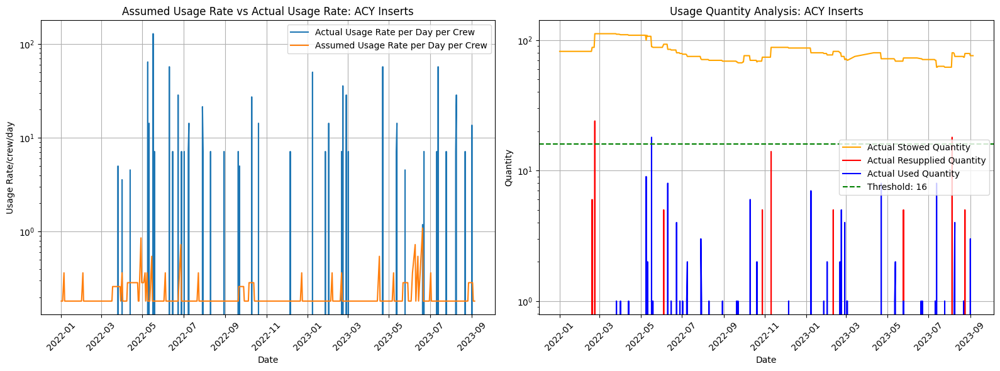

In [115]:
plot_consumables_analysis(df_master_PT_ACY_plt,16,'ACY Inserts')

In [116]:
df_master_PT_ACY_plt

,datedim_date,Launch_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,resupplied_with_flight,usage_rate_stowed,days_difference,crew_count,usage_rate_per_crew_per_day,hist_usage,vehicle_name,event,burn_rate,calculated_burn_rate,Item Used
0,2022-01-01,0,11,0,82,0.0,0.0,1.0,7,0.000000,0.182,,,9.1,0.000000,0
1,2022-01-02,0,11,0,82,0.0,0.0,1.0,7,0.000000,0.182,,,18.2,0.000000,0
2,2022-01-03,0,11,0,82,0.0,0.0,1.0,7,0.000000,0.182,,,27.3,0.000000,0
3,2022-01-05,0,11,0,82,0.0,0.0,2.0,7,0.000000,0.364,,,45.5,0.000000,0
4,2022-01-06,0,11,0,82,0.0,0.0,1.0,7,0.000000,0.182,,,54.6,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
539,2023-09-01,0,18,0,76,0.0,3.0,1.0,11,13.636364,0.286,,,5859.1,6083.333333,1
540,2023-09-02,0,18,0,76,0.0,0.0,1.0,11,0.000000,0.286,,,5873.4,6083.333333,0
541,2023-09-03,0,18,0,76,0.0,0.0,1.0,7,0.000000,0.182,,,5882.5,6083.333333,0
542,2023-09-04,0,18,0,76,0.0,0.0,1.0,7,0.000000,0.182,,,5891.6,6083.333333,0


### Usage Rate Calcualtion for KTO

In [117]:
df_master_PT_KTO = process_data(df_master_PT, 'KTO', df_fltpln_dock,0.035714)
df_master_PT_KTO

,datedim_date,Launch_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,resupplied_with_flight,usage_rate_stowed,days_difference,crew_count,usage_rate_per_crew_per_day,hist_usage,vehicle_name,event,burn_rate,calculated_burn_rate,Item Used
0,2022-01-01,0,6,15,123,0.0,0.0,1.0,7,0.000000,0.249998,,,0.249998,0.000000,0
1,2022-01-02,0,6,15,123,0.0,0.0,1.0,7,0.000000,0.249998,,,0.499996,0.000000,0
2,2022-01-03,0,6,15,123,0.0,0.0,1.0,7,0.000000,0.249998,,,0.749994,0.000000,0
3,2022-01-05,0,7,16,121,0.0,2.0,2.0,7,0.142857,0.499996,,,1.249990,1.000000,1
4,2022-01-06,0,7,16,121,0.0,0.0,1.0,7,0.000000,0.249998,,,1.499988,1.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
539,2023-09-01,0,24,16,232,0.0,0.0,1.0,11,0.000000,0.392854,,,160.962998,227.590909,0
540,2023-09-02,0,26,16,230,0.0,2.0,1.0,11,0.181818,0.392854,,,161.355852,229.590909,1
541,2023-09-03,0,26,16,230,0.0,0.0,1.0,7,0.000000,0.249998,,,161.605850,229.590909,0
542,2023-09-04,0,26,16,230,0.0,0.0,1.0,7,0.000000,0.249998,,,161.855848,229.590909,0


In [118]:
df_master_PT_KTO.columns

Index(['datedim_date', 'Launch_Stowed', 'Storage Location_Discard',
       'Storage Location_Installed', 'Storage Location_Stowed',
       'resupplied_with_flight', 'usage_rate_stowed', 'days_difference',
       'crew_count', 'usage_rate_per_crew_per_day', 'hist_usage',
       'vehicle_name', 'event', 'burn_rate', 'calculated_burn_rate',
       'Item Used'],
      dtype='object')

In [119]:
print('Calculated usage rate for KTO/Crew/Day :',df_master_PT_KTO['usage_rate_per_crew_per_day'].sum()/df_master_PT_KTO['days_difference'].sum())

Calculated usage rate for KTO/Crew/Day : 0.05178703841020317


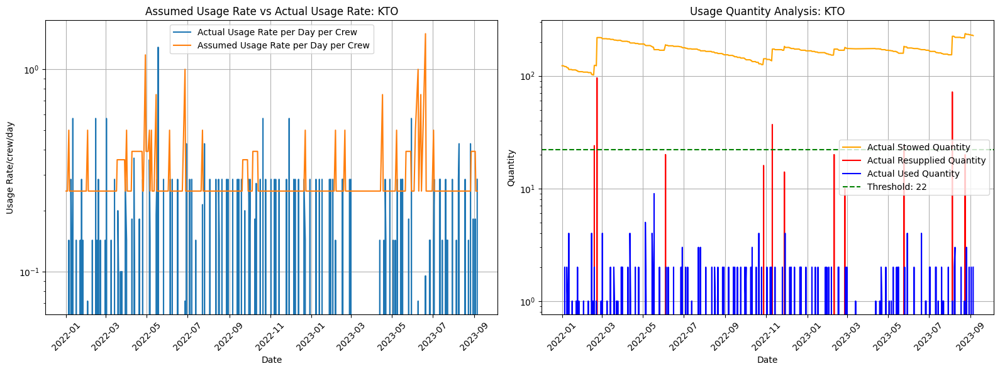

In [120]:
plot_consumables_analysis(df_master_PT_KTO,22,'KTO')

### Usage Rate Calcualtion for EDV

In [121]:
df_master_PT_EDV = process_data(df_master_PT, 'EDV', df_fltpln_dock,0.007576)
df_master_PT_EDV

,datedim_date,Launch_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,resupplied_with_flight,usage_rate_stowed,days_difference,crew_count,usage_rate_per_crew_per_day,hist_usage,vehicle_name,event,burn_rate,calculated_burn_rate,Item Used
0,2022-01-01,0,0,2,33,0.0,0.0,1.0,7,0.000000,0.053032,,,0.053032,0.000000,0
1,2022-01-02,0,0,2,33,0.0,0.0,1.0,7,0.000000,0.053032,,,0.106064,0.000000,0
2,2022-01-03,0,0,2,33,0.0,0.0,1.0,7,0.000000,0.053032,,,0.159096,0.000000,0
3,2022-01-05,0,1,3,31,0.0,2.0,2.0,7,0.142857,0.106064,,,0.265160,1.000000,1
4,2022-01-06,0,1,3,31,0.0,0.0,1.0,7,0.000000,0.053032,,,0.318192,1.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
539,2023-09-01,0,1,4,33,0.0,0.0,1.0,11,0.000000,0.083336,,,34.145032,26.590909,0
540,2023-09-02,0,1,4,33,0.0,0.0,1.0,11,0.000000,0.083336,,,34.228368,26.590909,0
541,2023-09-03,0,1,4,33,0.0,0.0,1.0,7,0.000000,0.053032,,,34.281400,26.590909,0
542,2023-09-04,0,1,4,33,0.0,0.0,1.0,7,0.000000,0.053032,,,34.334432,26.590909,0


In [122]:
print('Calculated usage rate for EDV/Crew/Day :',df_master_PT_EDV['usage_rate_per_crew_per_day'].sum()/df_master_PT_EDV['days_difference'].sum())

Calculated usage rate for EDV/Crew/Day : 0.005942670706129106


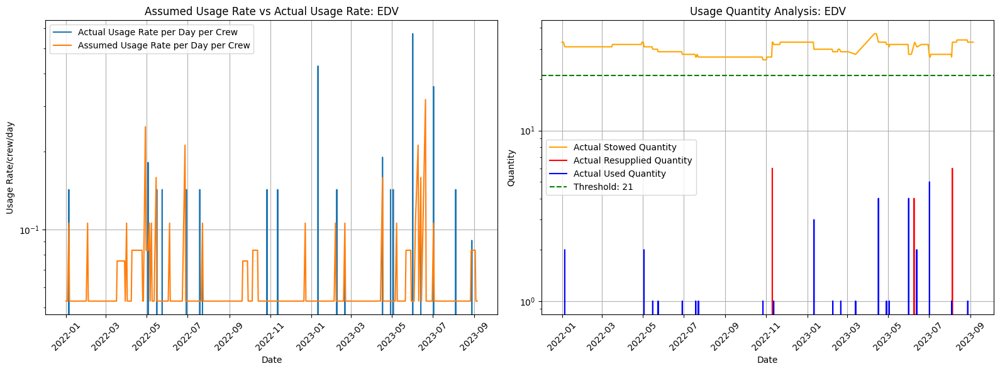

In [123]:
plot_consumables_analysis(df_master_PT_EDV,21,'EDV')

### Usage Rate Calculation for Filter Inserts

In [124]:
df_master_PT_FI = process_data(df_master_PT, 'Filter Inserts', df_fltpln_dock,0.007576)
df_master_PT_FI

,datedim_date,Launch_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,resupplied_with_flight,usage_rate_stowed,days_difference,crew_count,usage_rate_per_crew_per_day,hist_usage,vehicle_name,event,burn_rate,calculated_burn_rate,Item Used
0,2022-01-01,0,3,3,29,0.0,0.0,1.0,7,0.0,0.053032,,,0.053032,0.000000,0
1,2022-01-02,0,3,3,29,0.0,0.0,1.0,7,0.0,0.053032,,,0.106064,0.000000,0
2,2022-01-03,0,3,3,29,0.0,0.0,1.0,7,0.0,0.053032,,,0.159096,0.000000,0
3,2022-01-05,0,3,3,29,0.0,0.0,2.0,7,0.0,0.106064,,,0.265160,0.000000,0
4,2022-01-06,0,3,3,29,0.0,0.0,1.0,7,0.0,0.053032,,,0.318192,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
539,2023-09-01,0,5,4,21,0.0,0.0,1.0,11,0.0,0.083336,,,34.145032,41.174242,0
540,2023-09-02,0,5,4,21,0.0,0.0,1.0,11,0.0,0.083336,,,34.228368,41.174242,0
541,2023-09-03,0,5,4,21,0.0,0.0,1.0,7,0.0,0.053032,,,34.281400,41.174242,0
542,2023-09-04,0,5,4,21,0.0,0.0,1.0,7,0.0,0.053032,,,34.334432,41.174242,0


In [125]:
print('Calculated usage rate for Filter Inserts/Crew/Day :',df_master_PT_FI['usage_rate_per_crew_per_day'].sum()/df_master_PT_FI['days_difference'].sum())

Calculated usage rate for Filter Inserts/Crew/Day : 0.009201429348248273


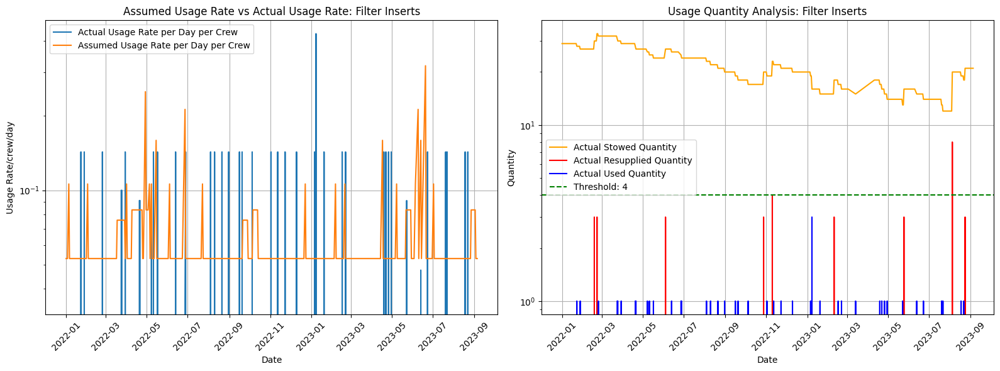

In [126]:
plot_consumables_analysis(df_master_PT_FI,4, 'Filter Inserts')

### Usage Rate Calculation for Food-RS

In [127]:
import datetime
df_master_PT_FOOD_RS = process_data(df_master_PT, 'Food-RS', df_fltpln_dock,0.200000)
df_master_PT_FOOD_RS
date_to_compare = datetime.datetime.strptime('2022-10-19 00:00:00', '%Y-%m-%d %H:%M:%S')

# Convert the datetime_column to datetime objects
df_master_PT_FOOD_RS['datedim_date'] = pd.to_datetime(df_master_PT_FOOD_RS['datedim_date'])

# Filter the DataFrame
df_master_PT_FOOD_RS = df_master_PT_FOOD_RS[df_master_PT_FOOD_RS['datedim_date'] > date_to_compare]
df_master_PT_FOOD_RS['burn_rate'] = df_master_PT_FOOD_RS['hist_usage'].cumsum()


df_master_PT_FOOD_RS.reset_index()

,index,datedim_date,Launch_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,resupplied_with_flight,usage_rate_stowed,days_difference,crew_count,usage_rate_per_crew_per_day,hist_usage,vehicle_name,event,burn_rate,calculated_burn_rate,Item Used
0,278,2022-10-20,50,93,36,22,0.0,0.0,1.0,7,0.000000,1.4,,,1.4,0.000000,0
1,279,2022-10-21,50,93,36,22,0.0,0.0,1.0,7,0.000000,1.4,,,2.8,0.000000,0
2,280,2022-10-22,50,93,36,22,0.0,0.0,1.0,7,0.000000,1.4,,,4.2,0.000000,0
3,281,2022-10-23,50,93,36,22,0.0,0.0,1.0,7,0.000000,1.4,,,5.6,0.000000,0
4,282,2022-10-24,50,101,28,22,0.0,0.0,1.0,7,0.000000,1.4,,,7.0,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,539,2023-09-01,0,17,34,87,0.0,0.0,1.0,11,0.000000,2.2,,,455.8,126.247835,0
262,540,2023-09-02,11,23,32,87,0.0,0.0,1.0,11,0.000000,2.2,,,458.0,126.247835,0
263,541,2023-09-03,11,19,33,86,0.0,1.0,1.0,7,0.142857,1.4,,,459.4,127.247835,1
264,542,2023-09-04,11,19,33,86,0.0,0.0,1.0,7,0.000000,1.4,,,460.8,127.247835,0


In [128]:
print('Calculated usage rate for Food-RS :',df_master_PT_FOOD_RS['usage_rate_per_crew_per_day'].sum()/df_master_PT_FOOD_RS['days_difference'].sum())

Calculated usage rate for Food-RS : 0.05561865074548652


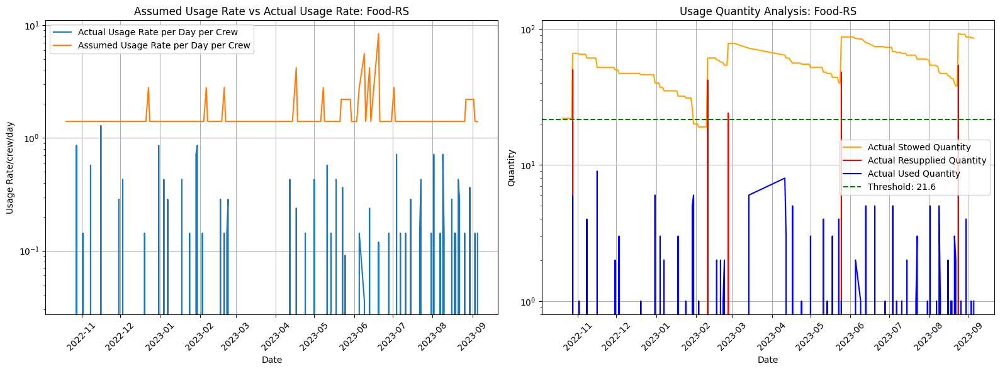

In [129]:
plot_consumables_analysis(df_master_PT_FOOD_RS,21.6, 'Food-RS')

In [130]:
df_master_PT_FOOD_RS

,datedim_date,Launch_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,resupplied_with_flight,usage_rate_stowed,days_difference,crew_count,usage_rate_per_crew_per_day,hist_usage,vehicle_name,event,burn_rate,calculated_burn_rate,Item Used
278,2022-10-20,50,93,36,22,0.0,0.0,1.0,7,0.000000,1.4,,,1.4,0.000000,0
279,2022-10-21,50,93,36,22,0.0,0.0,1.0,7,0.000000,1.4,,,2.8,0.000000,0
280,2022-10-22,50,93,36,22,0.0,0.0,1.0,7,0.000000,1.4,,,4.2,0.000000,0
281,2022-10-23,50,93,36,22,0.0,0.0,1.0,7,0.000000,1.4,,,5.6,0.000000,0
282,2022-10-24,50,101,28,22,0.0,0.0,1.0,7,0.000000,1.4,,,7.0,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
539,2023-09-01,0,17,34,87,0.0,0.0,1.0,11,0.000000,2.2,,,455.8,126.247835,0
540,2023-09-02,11,23,32,87,0.0,0.0,1.0,11,0.000000,2.2,,,458.0,126.247835,0
541,2023-09-03,11,19,33,86,0.0,1.0,1.0,7,0.142857,1.4,,,459.4,127.247835,1
542,2023-09-04,11,19,33,86,0.0,0.0,1.0,7,0.000000,1.4,,,460.8,127.247835,0


### Usage Rate Calculation for Food-US

In [131]:
df_master_PT_Food_US = process_data(df_master_PT, 'Food-US', df_fltpln_dock,0.027000)
date_to_compare = datetime.datetime.strptime('2022-10-19 00:00:00', '%Y-%m-%d %H:%M:%S')

# Convert the datetime_column to datetime objects
df_master_PT_Food_US['datedim_date'] = pd.to_datetime(df_master_PT_Food_US['datedim_date'])

# Filter the DataFrame
df_master_PT_Food_US = df_master_PT_Food_US[df_master_PT_Food_US['datedim_date'] > date_to_compare]
df_master_PT_Food_US['burn_rate'] = df_master_PT_Food_US['hist_usage'].cumsum()

df_master_PT_Food_US.reset_index()

,index,datedim_date,Launch_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,resupplied_with_flight,usage_rate_stowed,days_difference,crew_count,usage_rate_per_crew_per_day,hist_usage,vehicle_name,event,burn_rate,calculated_burn_rate,Item Used
0,278,2022-10-20,0,227,20,128,0.0,0.0,1.0,7,0.000000,0.189,,,0.189,0.000000,0
1,279,2022-10-21,0,227,20,129,0.0,0.0,1.0,7,0.000000,0.189,,,0.378,0.000000,0
2,280,2022-10-22,0,227,20,129,0.0,0.0,1.0,7,0.000000,0.189,,,0.567,0.000000,0
3,281,2022-10-23,0,227,20,129,0.0,0.0,1.0,7,0.000000,0.189,,,0.756,0.000000,0
4,282,2022-10-24,0,228,20,128,0.0,1.0,1.0,7,0.142857,0.189,,,0.945,1.000000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,539,2023-09-01,0,177,29,459,0.0,1.0,1.0,11,0.090909,0.297,,,61.533,379.128788,1
262,540,2023-09-02,0,182,29,455,0.0,4.0,1.0,11,0.363636,0.297,,,61.830,383.128788,1
263,541,2023-09-03,0,181,31,453,0.0,2.0,1.0,7,0.285714,0.189,,,62.019,385.128788,1
264,542,2023-09-04,0,181,31,453,0.0,0.0,1.0,7,0.000000,0.189,,,62.208,385.128788,0


In [132]:
print('Calculated usage rate for Food-US:',df_master_PT_Food_US['usage_rate_per_crew_per_day'].sum()/df_master_PT_Food_US['days_difference'].sum())

Calculated usage rate for Food-US: 0.16803886663699746


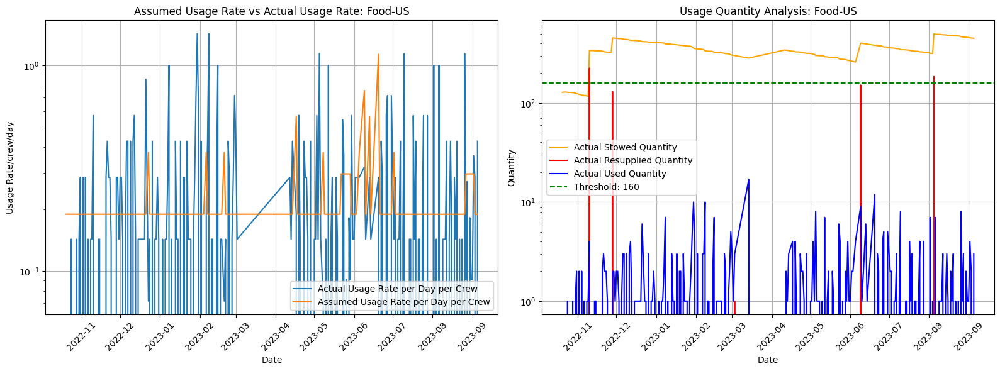

In [133]:
plot_consumables_analysis(df_master_PT_Food_US,160,'Food-US')

### Simple Linear Regression for KTO


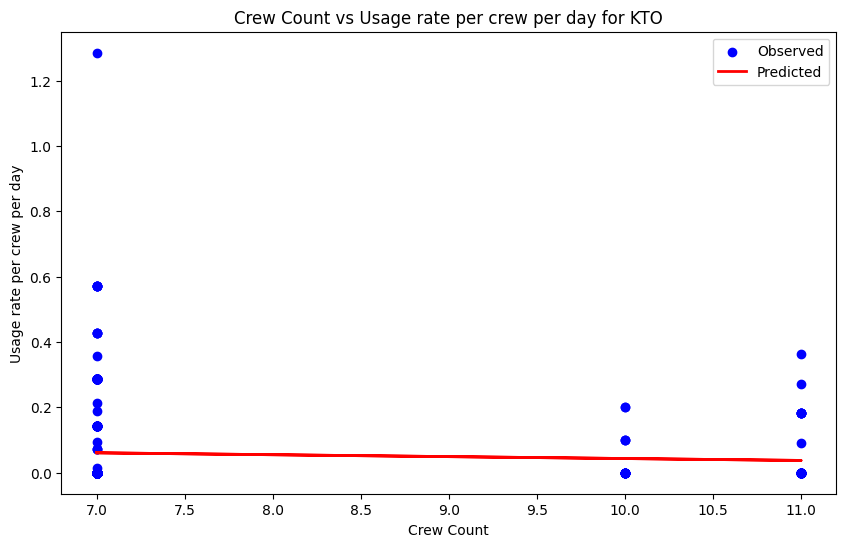

Mean Squared Error (MSE): 0.01620724925805951
R-squared: 0.0030558440673366105


In [134]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score
# Select two attributes that you hypothesize have a linear relationship

X = df_master_PT_KTO[['crew_count']]  # Predictor
y = df_master_PT_KTO['usage_rate_per_crew_per_day']

# Initialize and fit the Linear Regression model
model = LinearRegression()
model.fit(X, y)

# Predict using the model
predictions = model.predict(X)

# Plotting the observed vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(X, y, color='blue', label='Observed')  # observed data
plt.plot(X, predictions, color='red', linewidth=2, label='Predicted')  # regression line
plt.title('Crew Count vs Usage rate per crew per day for KTO')
plt.xlabel('Crew Count')
plt.ylabel('Usage rate per crew per day')
plt.legend()
plt.show()

# Model's performance evaluation
mse = mean_squared_error(y, predictions)
r2 = r2_score(y, predictions)

print(f"Mean Squared Error (MSE): {mse}")
print(f"R-squared: {r2}")

The scatter plot "Crew Count vs Usage rate per crew per day for KTO" shows a marked variation in observed usage rates, with denser, higher values at lower crew counts that taper off as the crew count increases. This pattern is not mirrored by the predictive model, represented by a flat red line just above zero, which suggests no change in usage rate with varying crew sizes. This indicates a potential underfitting by the model, which fails to capture the downward trend in usage rate as crew count rises, suggesting that additional factors affecting usage rates are not being considered in the model.

### Simple Linear Regression for ACY Inserts

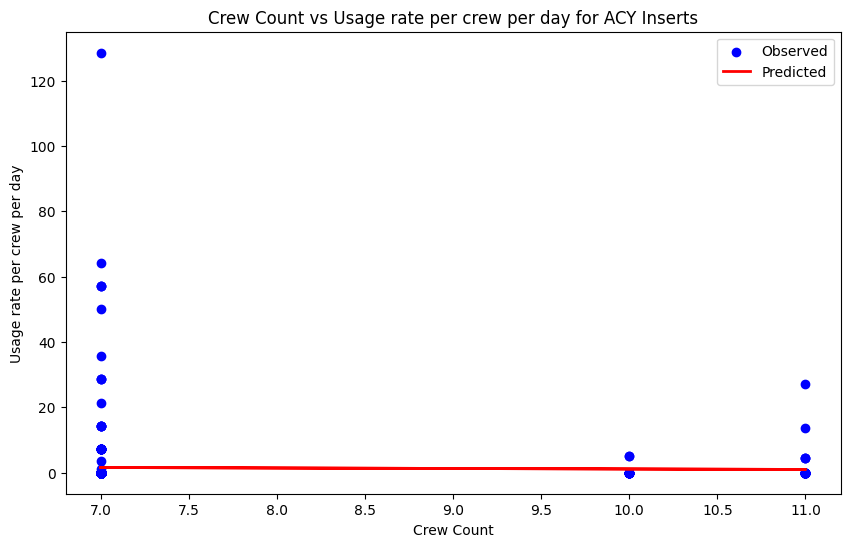

Mean Squared Error (MSE): 71.49486429787711
R-squared: 0.0004627604807229124


In [135]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score
# Select two attributes that you hypothesize have a linear relationship

X = df_master_PT_ACY[['crew_count']]  # Predictor
y = df_master_PT_ACY['usage_rate_per_crew_per_day']

# Initialize and fit the Linear Regression model
model = LinearRegression()
model.fit(X, y)

# Predict using the model
predictions = model.predict(X)

# Plotting the observed vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(X, y, color='blue', label='Observed')  # observed data
plt.plot(X, predictions, color='red', linewidth=2, label='Predicted')  # regression line
plt.title('Crew Count vs Usage rate per crew per day for ACY Inserts')
plt.xlabel('Crew Count')
plt.ylabel('Usage rate per crew per day')
plt.legend()
plt.show()

# Model's performance evaluation
mse = mean_squared_error(y, predictions)
r2 = r2_score(y, predictions)

print(f"Mean Squared Error (MSE): {mse}")
print(f"R-squared: {r2}")

The graph "Crew Count vs Usage rate per crew per day for ACY Inserts" shows observed usage rates (blue dots) across different crew counts, exhibiting considerable variability and no clear trend. The predicted usage rate (red line) remains constant at zero, regardless of crew count, indicating a prediction model that fails to account for the variability in the observed data. This suggests that the model may be underfitting, not capturing other influential factors that affect usage rates beyond just the crew count.



### Simple Linear Regression for EDV

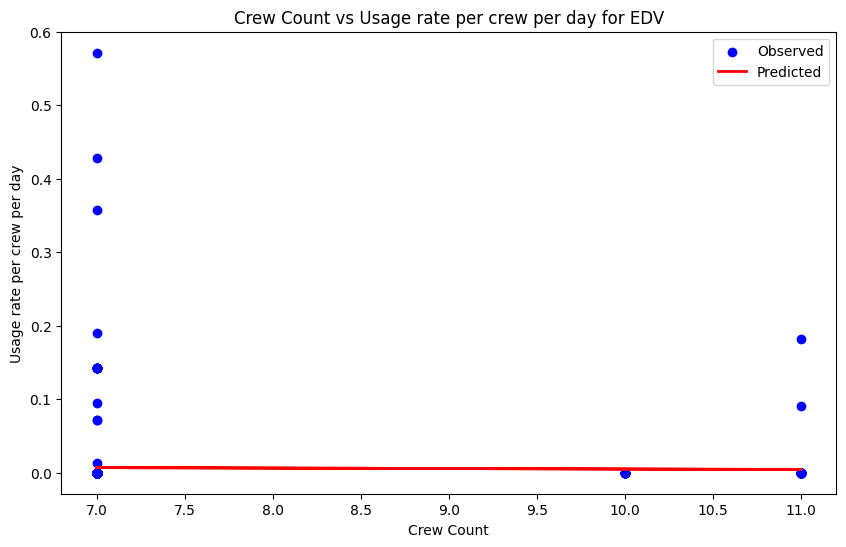

Mean Squared Error (MSE): 0.0017179443165868272
R-squared: 0.00035895835326760217


In [136]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score
# Select two attributes that you hypothesize have a linear relationship

X = df_master_PT_EDV[['crew_count']]  # Predictor
y = df_master_PT_EDV['usage_rate_per_crew_per_day']

# Initialize and fit the Linear Regression model
model = LinearRegression()
model.fit(X, y)

# Predict using the model
predictions = model.predict(X)

# Plotting the observed vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(X, y, color='blue', label='Observed')  # observed data
plt.plot(X, predictions, color='red', linewidth=2, label='Predicted')  # regression line
plt.title('Crew Count vs Usage rate per crew per day for EDV')
plt.xlabel('Crew Count')
plt.ylabel('Usage rate per crew per day')
plt.legend()
plt.show()

# Model's performance evaluation
mse = mean_squared_error(y, predictions)
r2 = r2_score(y, predictions)

print(f"Mean Squared Error (MSE): {mse}")
print(f"R-squared: {r2}")

The graph "Crew Count vs Usage rate per crew per day for EDV" shows observed usage rates of EDVs varying widely for smaller crew counts, with a decrease in usage as the crew count increases. Despite this, the prediction line (in red) remains flat, near zero, across all crew counts. This discrepancy suggests that the predictive model does not account for the actual observed trend of higher usage rates at lower crew counts. The model's constant prediction implies it may be underfitting, lacking the complexity needed to capture the real-world data's nuances or missing other relevant factors influencing the usage rates.

### Function for performing Multiple Linear Regression

In [137]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from mpl_toolkits.mplot3d import Axes3D

def perform_linear_regression(df, features, category_name):
    # Extracting features and target variable
    X = df[features]
    y = df['usage_rate_per_crew_per_day']

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Initialize the linear regression model
    model = LinearRegression()

    # Train the model
    model.fit(X_train, y_train)

    # Predict usage rate on the testing set
    y_pred = model.predict(X_test)

    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"Mean Squared Error for category '{category_name}': {mse}")
    print(f"R Squared Error for category '{category_name}': {r2}")

    # 3D plot
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    # Plot observed values
    ax.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], y_test, color='blue', label='Observed')

    # Plot predicted values
    ax.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], y_pred, color='red', label='Predicted')

    ax.set_xlabel(features[0])
    ax.set_ylabel(features[1])
    ax.set_zlabel('Usage Rate per Crew per Day')
    ax.set_title(f'Observed vs Predicted for category "{category_name}"\n(MSE: {mse}, R2: {r2})')

    plt.legend()
    plt.show()


Above function can be called for Linear regression by each Category.

In [138]:
def plot_features_with_target(df, features, target, category_name):
    for feature in features:
        plt.scatter(df[feature], df[target], color='blue')
        plt.title(f'{feature} vs. {target} for category "{category_name}"')
        plt.xlabel(feature)
        plt.ylabel(target)
        plt.show()

Above function can be called for plotting each feature with target values by each Category.

### Multiple Linear Regression for ACY Inserts

In [139]:
features = [
    'Launch_Stowed', 'Storage Location_Discard',
    'Storage Location_Installed', 'Storage Location_Stowed',
    'resupplied_with_flight', 'days_difference', 'crew_count']


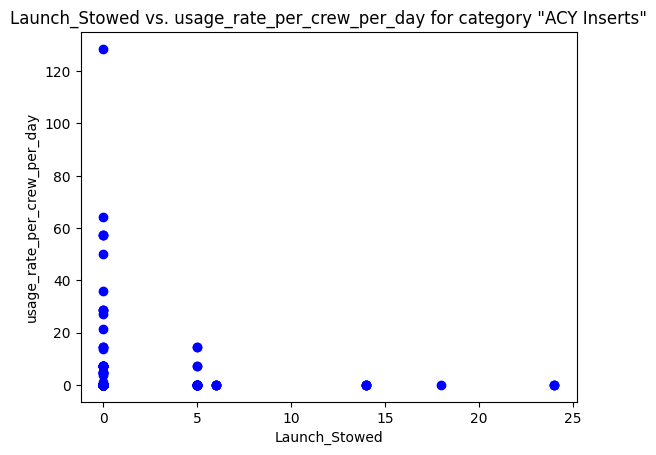

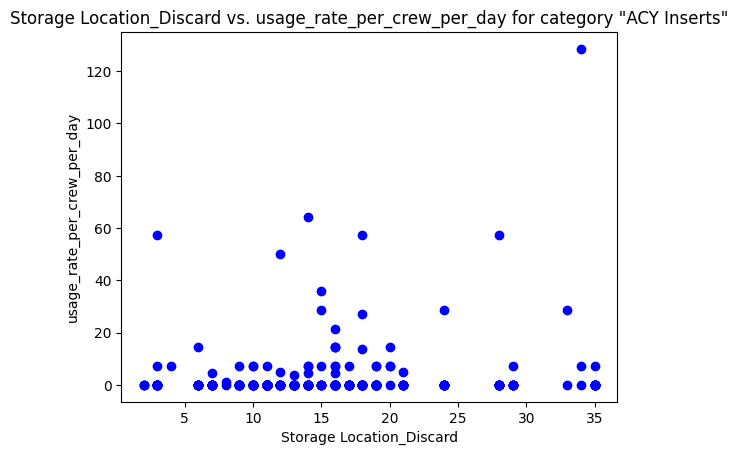

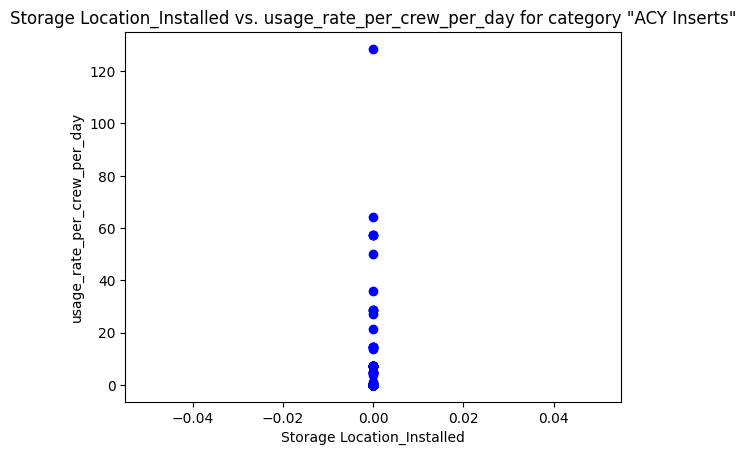

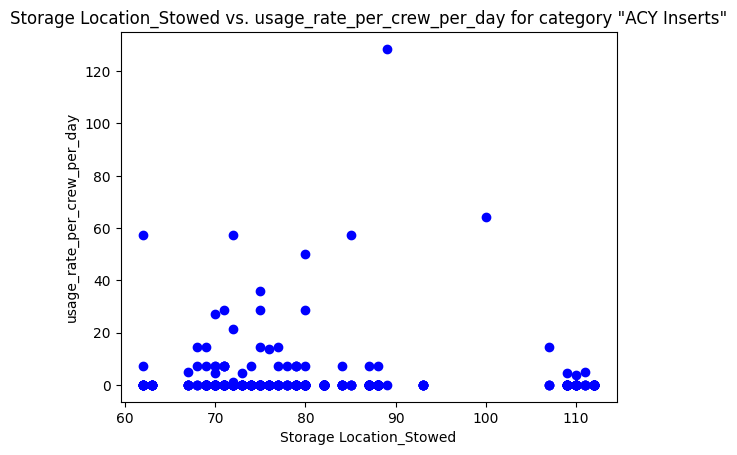

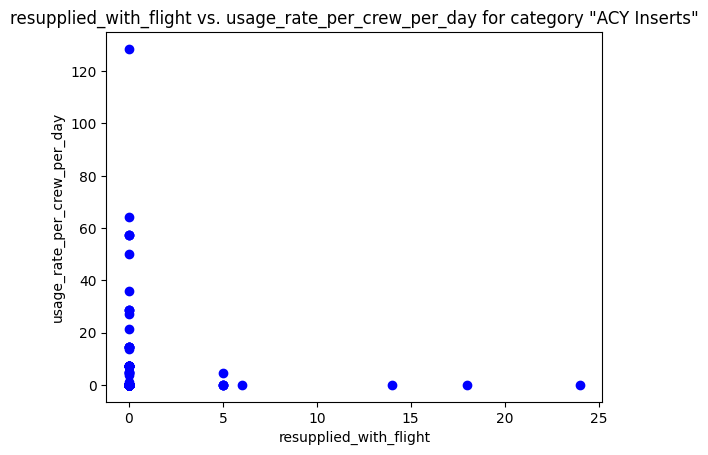

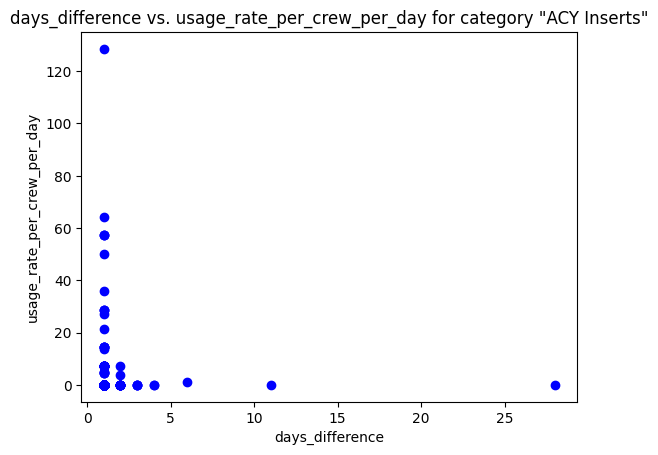

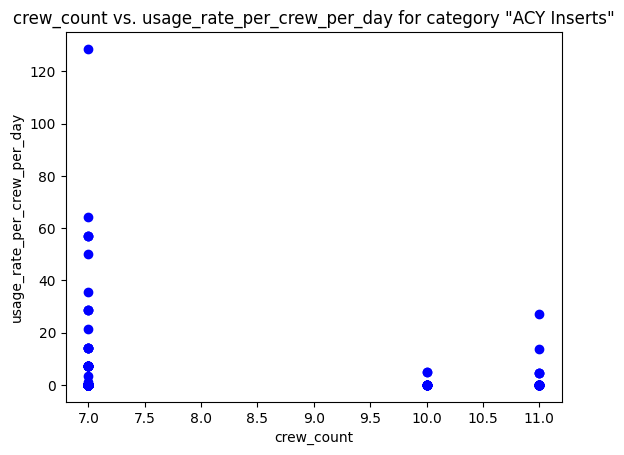

In [140]:
plot_features_with_target(df_master_PT_ACY, features, 'usage_rate_per_crew_per_day','ACY Inserts')


Looking at plots of each feature it looks like there is not any features that have direct linear relationship with target usage_rate_per_crew.Hence,linear Regression might not be the best algrothim to predict usage rate per crew.

Mean Squared Error for category 'ACY Inserts': 38.333813373188654
R Squared Error for category 'ACY Inserts': -0.03817478016485665


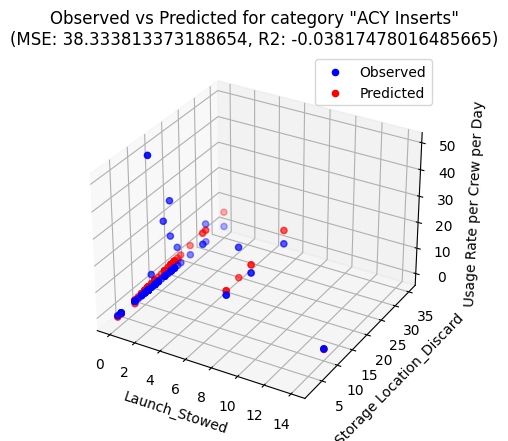

In [141]:
perform_linear_regression(df_master_PT_ACY, features,'ACY Inserts')

The mean squared error (MSE) of approximately 39.017 for the 'ACY Inserts' category indicates that the model's predictions for this category deviated from the actual values by an average squared error of around 39.017. A negative R-squared value of -0.0567 suggests that the model's predictions for 'ACY Inserts' are performing worse than a model that simply predicts the mean of the target variable. This indicates that the model's predictions are not explaining much of the variance in the data and are possibly worse than baseline predictions for this category

In [142]:
df_master_PT_ACY['usage_rate_per_crew_per_day'].mean()

1.532340208810797

### Multiple Linear Regression for KTO

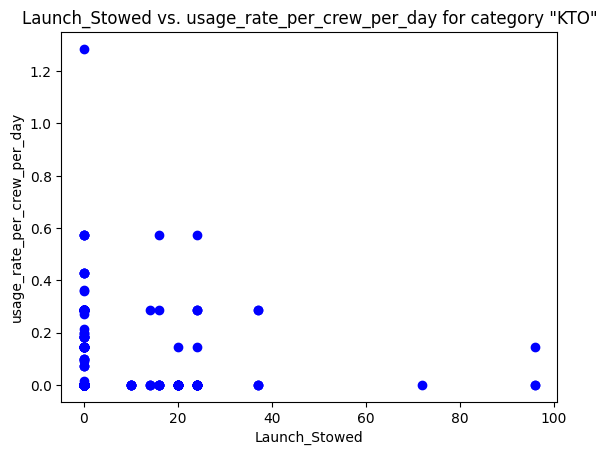

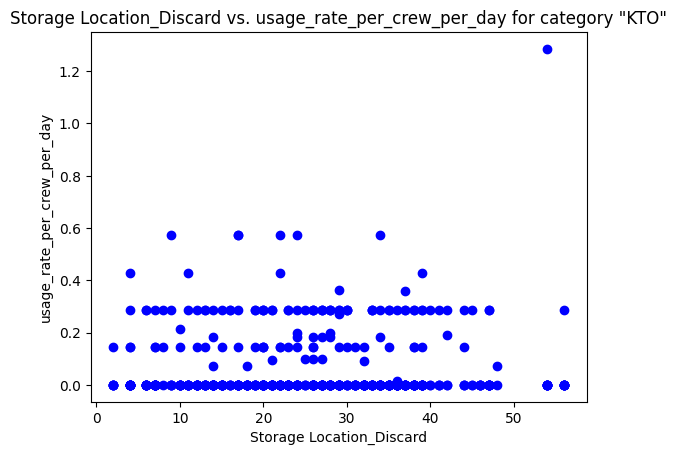

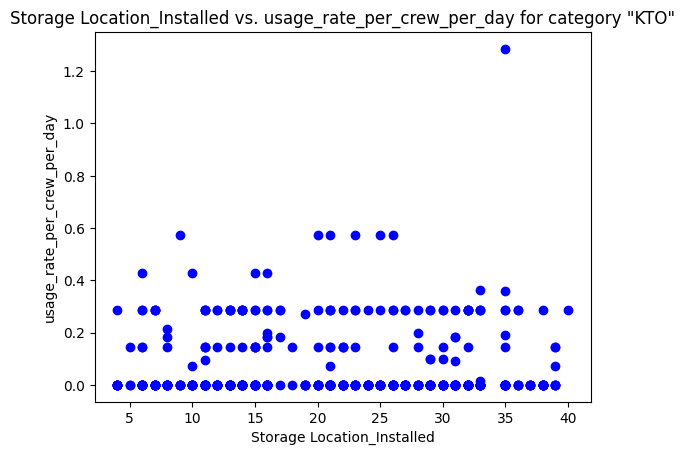

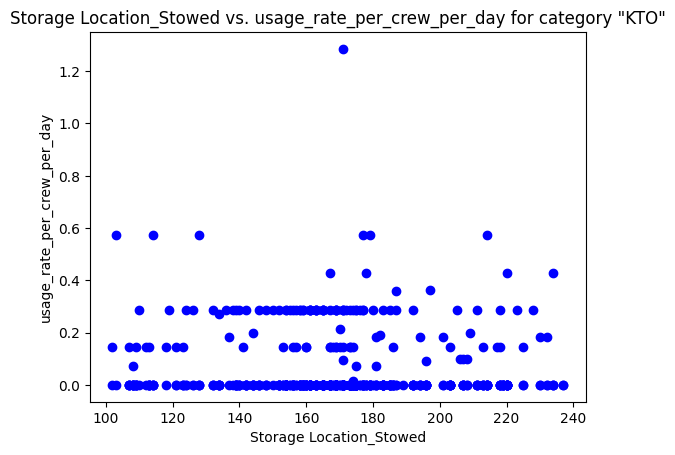

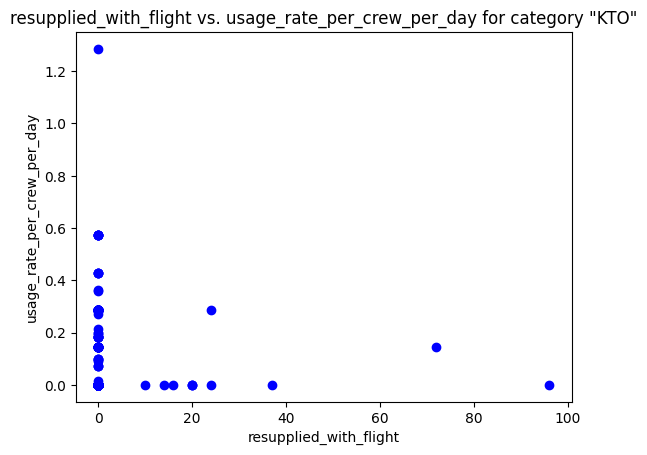

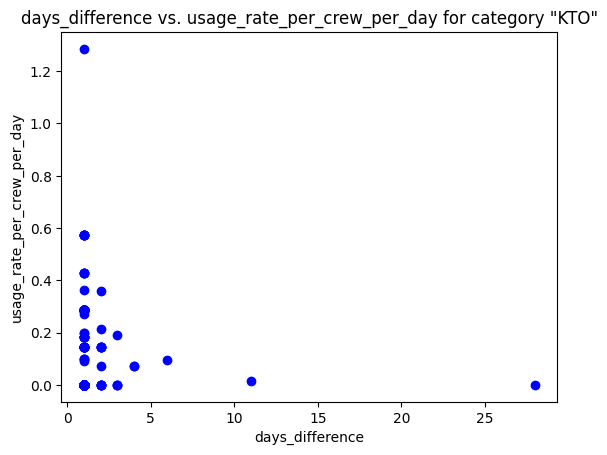

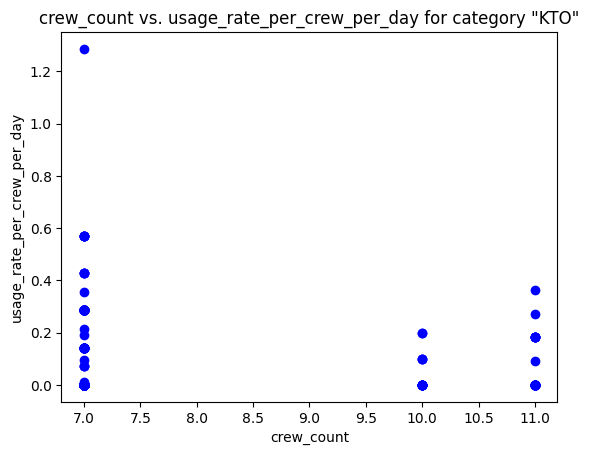

In [143]:
plot_features_with_target(df_master_PT_KTO, features, 'usage_rate_per_crew_per_day','KTO')

Looking at plots of each feature it looks like there is not any features that have direct linear relationship with target usage_rate_per_crew.Hence,linear Regression might not be the best algrothim to predict usage rate per crew.

In [144]:
df_master_PT_KTO

,datedim_date,Launch_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,resupplied_with_flight,usage_rate_stowed,days_difference,crew_count,usage_rate_per_crew_per_day,hist_usage,vehicle_name,event,burn_rate,calculated_burn_rate,Item Used
0,2022-01-01,0,6,15,123,0.0,0.0,1.0,7,0.000000,0.249998,,,0.249998,0.000000,0
1,2022-01-02,0,6,15,123,0.0,0.0,1.0,7,0.000000,0.249998,,,0.499996,0.000000,0
2,2022-01-03,0,6,15,123,0.0,0.0,1.0,7,0.000000,0.249998,,,0.749994,0.000000,0
3,2022-01-05,0,7,16,121,0.0,2.0,2.0,7,0.142857,0.499996,,,1.249990,1.000000,1
4,2022-01-06,0,7,16,121,0.0,0.0,1.0,7,0.000000,0.249998,,,1.499988,1.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
539,2023-09-01,0,24,16,232,0.0,0.0,1.0,11,0.000000,0.392854,,,160.962998,227.590909,0
540,2023-09-02,0,26,16,230,0.0,2.0,1.0,11,0.181818,0.392854,,,161.355852,229.590909,1
541,2023-09-03,0,26,16,230,0.0,0.0,1.0,7,0.000000,0.249998,,,161.605850,229.590909,0
542,2023-09-04,0,26,16,230,0.0,0.0,1.0,7,0.000000,0.249998,,,161.855848,229.590909,0


Mean Squared Error for category 'KTO': 0.01713769437857473
R Squared Error for category 'KTO': -0.027350727152205767


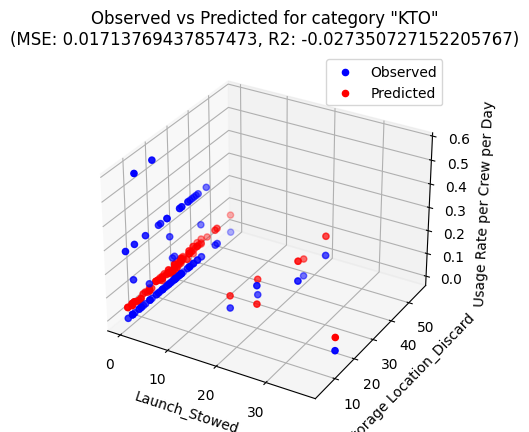

In [145]:
perform_linear_regression(df_master_PT_KTO, features,'KTO')

The mean squared error (MSE) of approximately 0.0173 for the 'KTO' category indicates that the model's predictions for this category deviated from the actual values by an average squared error of around 0.0173. A negative R-squared value of -0.0371 suggests that the model's predictions for 'KTO' are performing worse than a model that simply predicts the mean of the target variable. This indicates that the model's predictions are not explaining much of the variance in the data and are possibly worse than baseline predictions for this category.

### Multiple Linear Regression for EDV

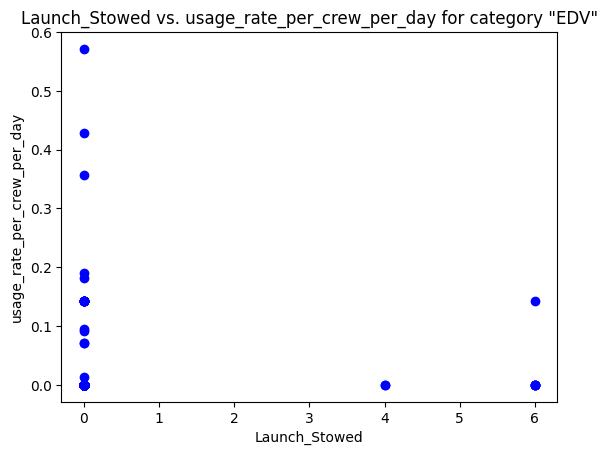

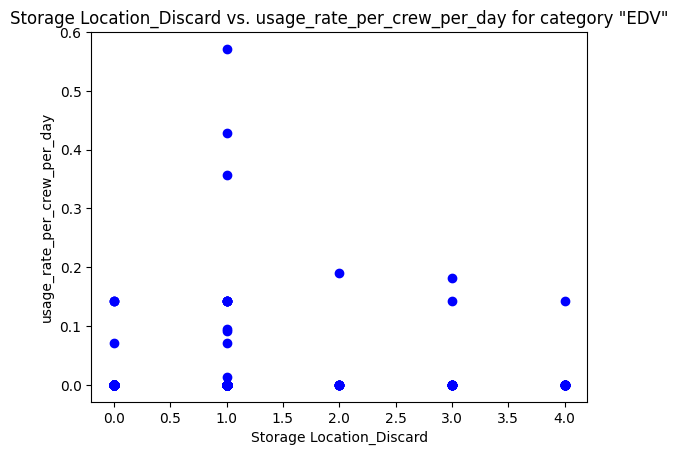

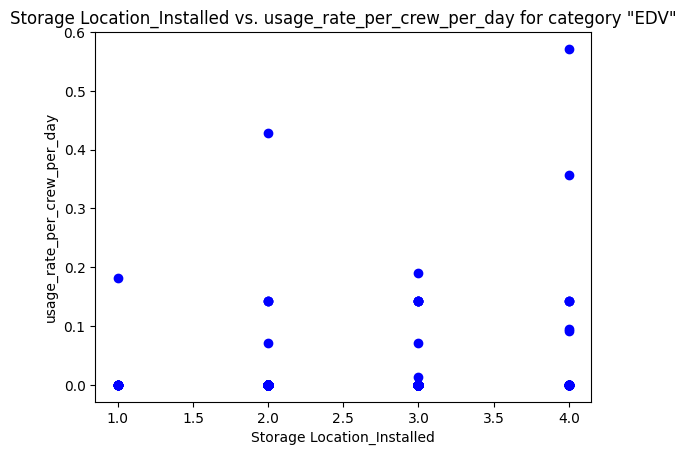

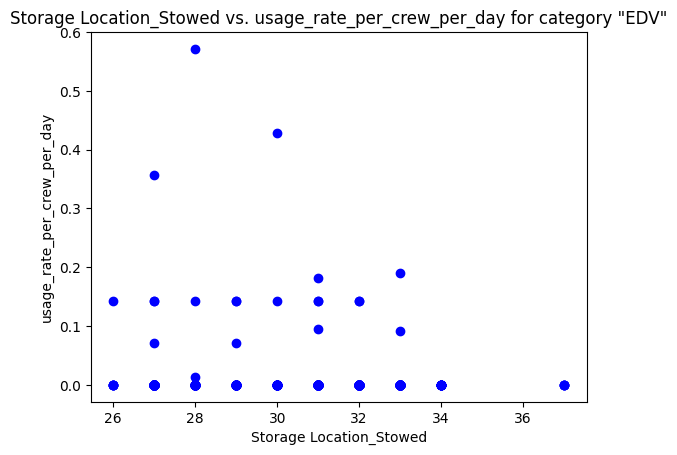

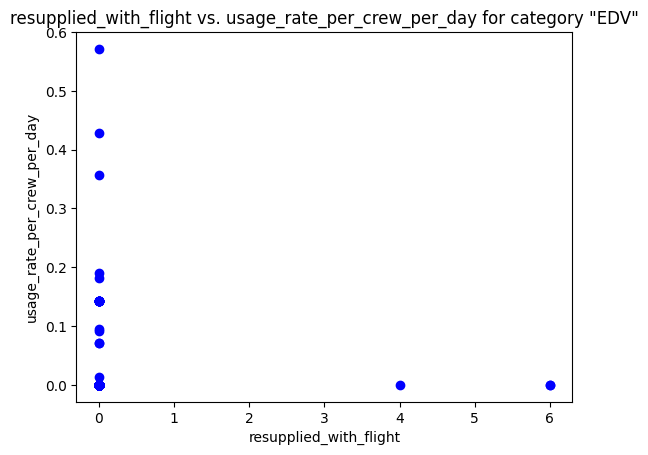

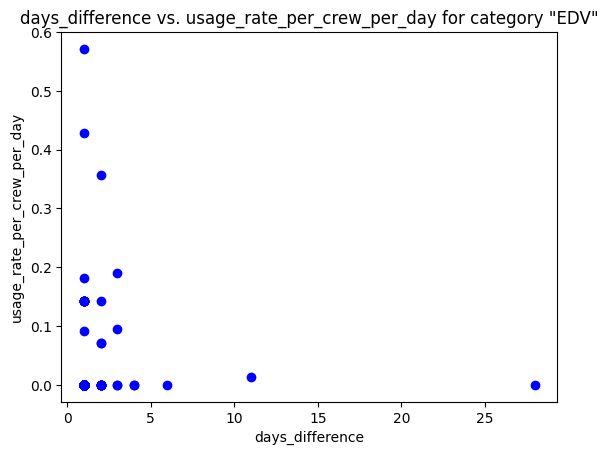

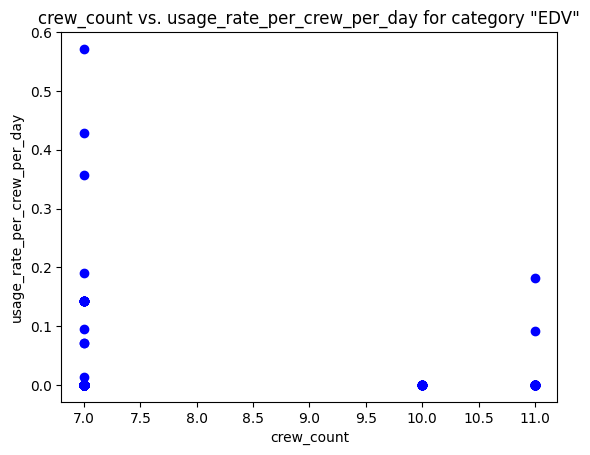

In [146]:
plot_features_with_target(df_master_PT_EDV, features, 'usage_rate_per_crew_per_day','EDV')

Looking at plots of each feature it looks like there is not any features that have direct linear relationship with target usage_rate_per_crew.Hence,linear Regression might not be the best algrothim to predict usage rate per crew.

Mean Squared Error for category 'EDV': 0.0004349463361770235
R Squared Error for category 'EDV': -0.4474057588759832


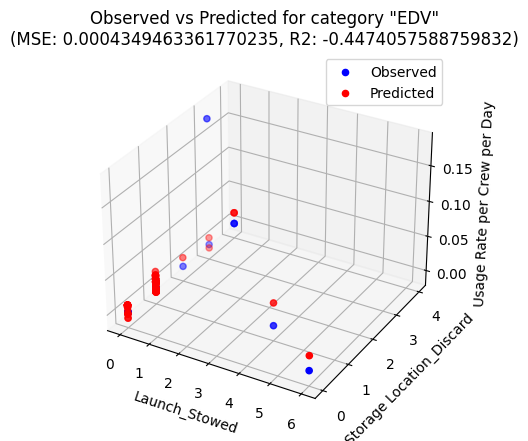

In [147]:
perform_linear_regression(df_master_PT_EDV, features,'EDV')

The mean squared error (MSE) of approximately 0.00044 for the 'EDV' category indicates that the model's predictions for this category deviated from the actual values by an average squared error of around 0.00044. A negative R-squared value of -0.449 suggests that the model's predictions for 'EDV' are performing worse than a model that simply predicts the mean of the target variable. This indicates that the model's predictions are not explaining much of the variance in the data and are possibly worse than baseline predictions for this category.








### Multiple Linear Regression for Filter Inserts

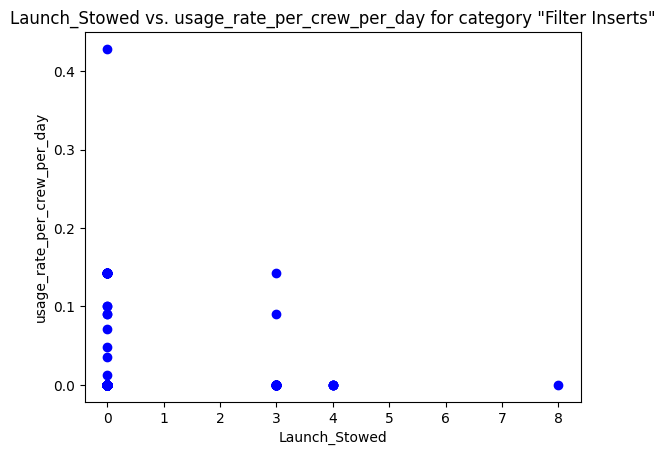

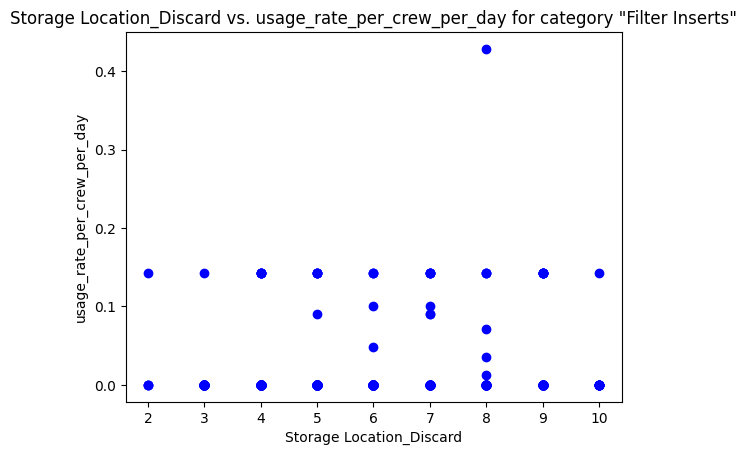

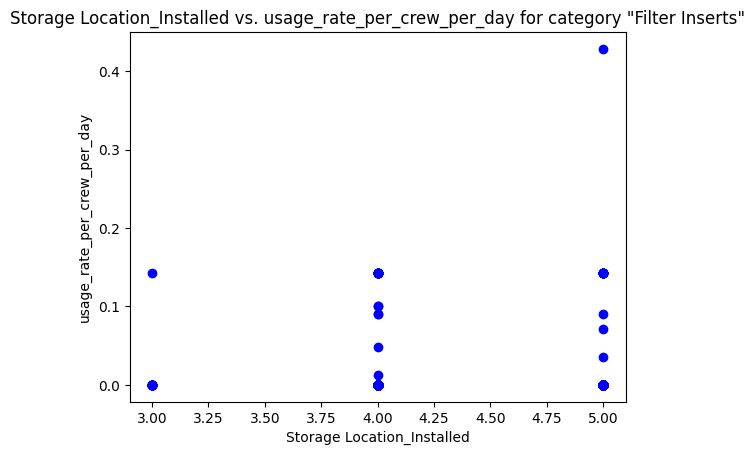

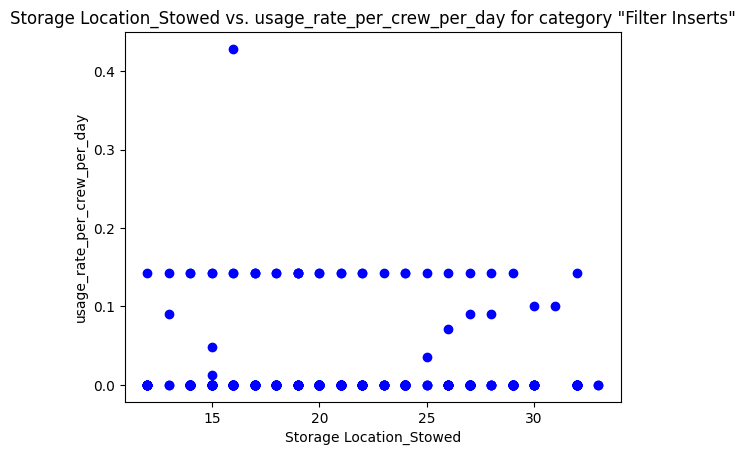

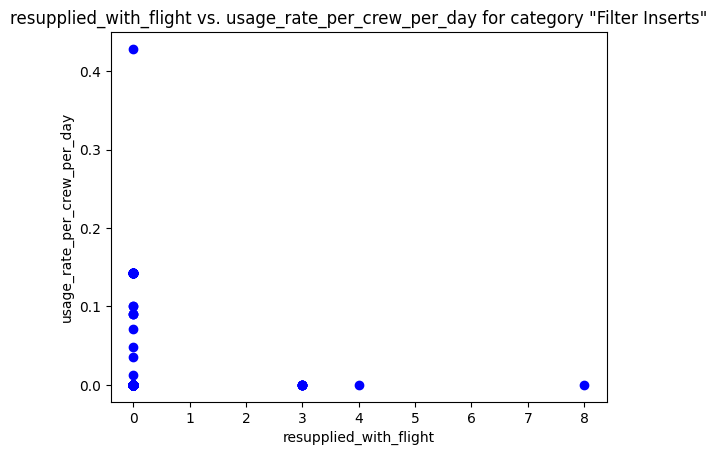

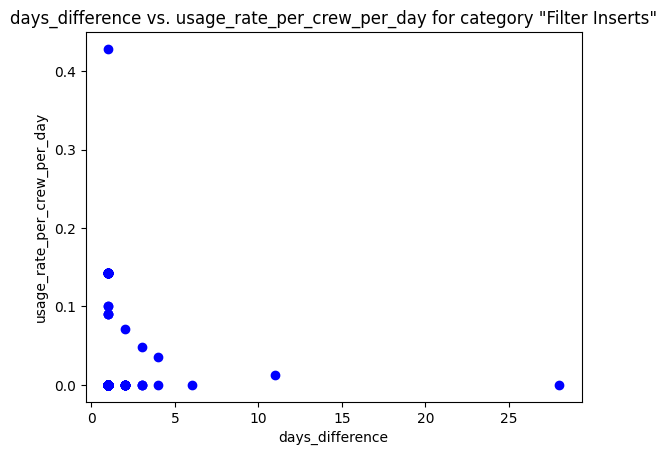

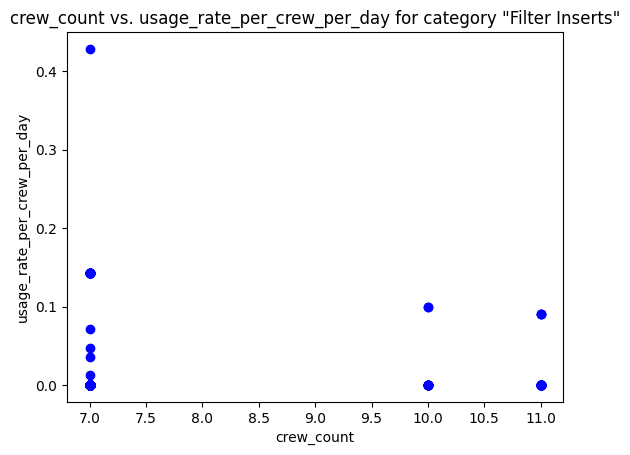

In [148]:
plot_features_with_target(df_master_PT_FI, features, 'usage_rate_per_crew_per_day','Filter Inserts')

Looking at plots of each feature it looks like there is not any features that have direct linear relationship with target usage_rate_per_crew.Hence,linear Regression might not be the best algrothim to predict usage rate per crew.

Mean Squared Error for category 'Filter Inserts': 0.0029576263825570937
R Squared Error for category 'Filter Inserts': 0.005866978344756912


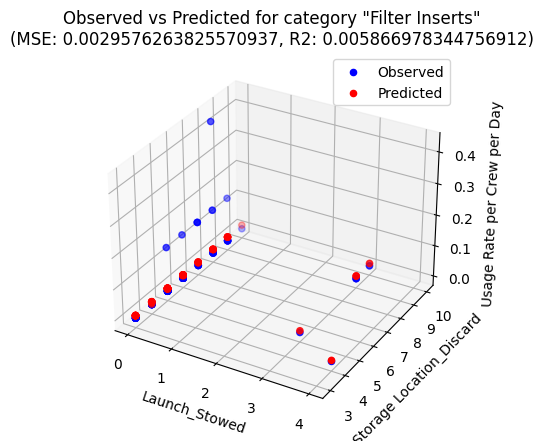

In [149]:
perform_linear_regression(df_master_PT_FI, features,'Filter Inserts')


The mean squared error (MSE) of approximately 0.003 for the 'Filter Inserts' category indicates that the model's predictions for this category deviated from the actual values by an average squared error of around 0.003. A low R-squared value of approximately 0.005 suggests that the model's predictions for 'Filter Inserts' are not explaining much of the variance in the data. While the R-squared value is positive, it's quite close to zero, indicating that the model's predictions are only slightly better than a model that predicts the mean of the target variable

### Multiple Linear Regression for Food-RS

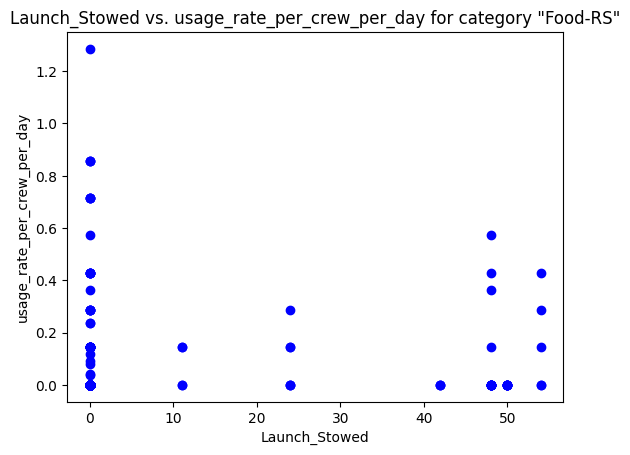

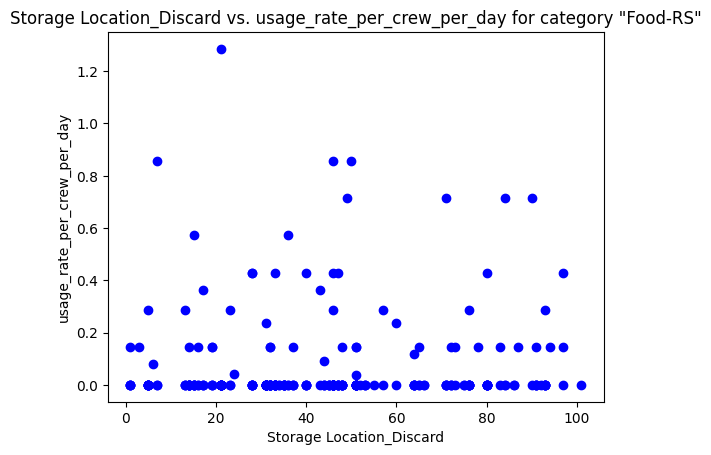

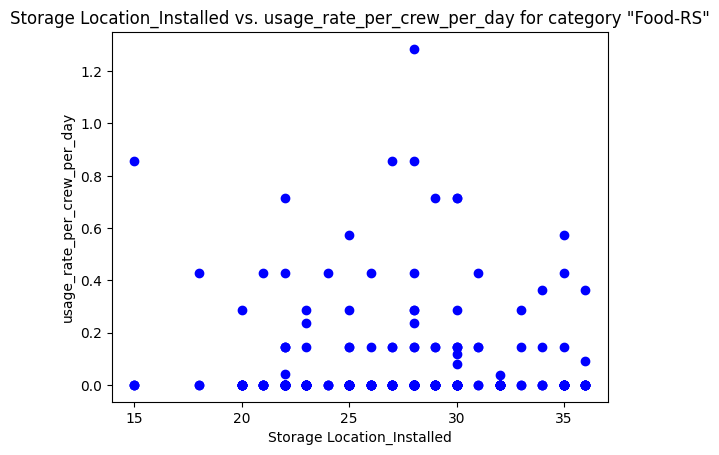

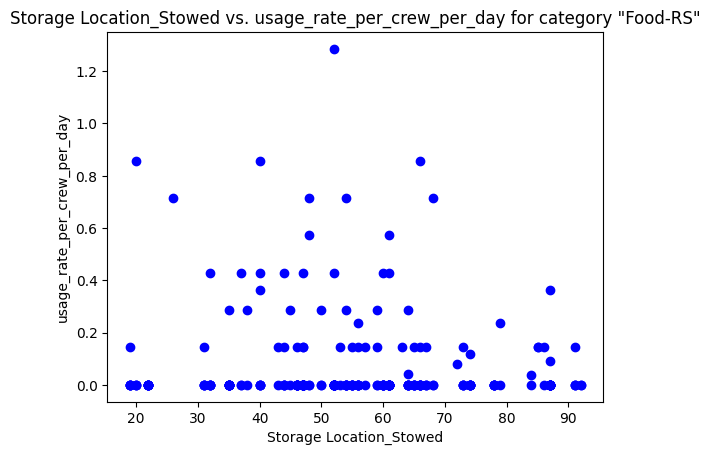

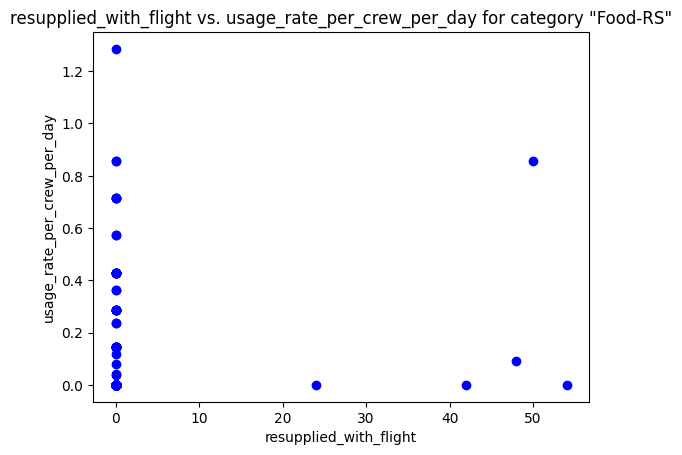

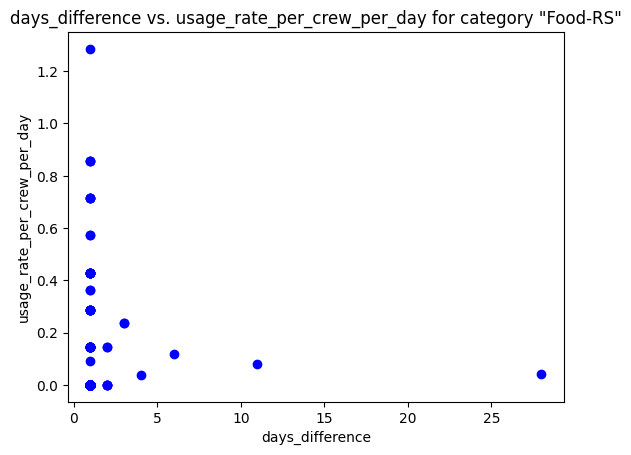

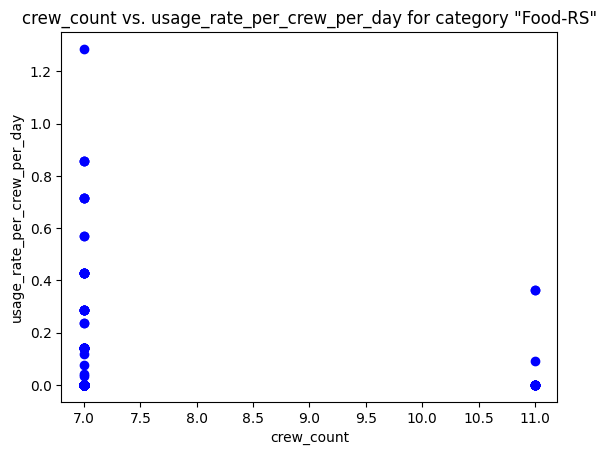

In [150]:
plot_features_with_target(df_master_PT_FOOD_RS, features, 'usage_rate_per_crew_per_day','Food-RS')

Looking at plots of each feature it looks like there is not any features that have direct linear relationship with target usage_rate_per_crew.Hence,linear Regression might not be the best algrothim to predict usage rate per crew.

Mean Squared Error for category 'FOOD-RS': 0.027806844565145282
R Squared Error for category 'FOOD-RS': -0.10586262165945981


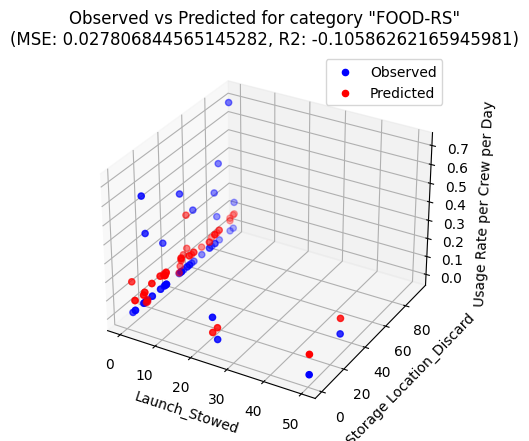

In [151]:
perform_linear_regression(df_master_PT_FOOD_RS, features,'FOOD-RS')

The mean squared error (MSE) of 0.028 for the 'FOOD-RS' category indicates that the model's predictions for this category deviated from the actual values by an average squared error of approximately 0.028. A negative R-squared value of -0.118 suggests that the model's predictions for 'FOOD-RS' are performing worse than a model that simply predicts the mean of the target variable. This indicates that the model's predictions are not explaining much of the variance in the data and might even be performing worse than baseline predictions for this category.

### Multiple Linear Regression for Food-US

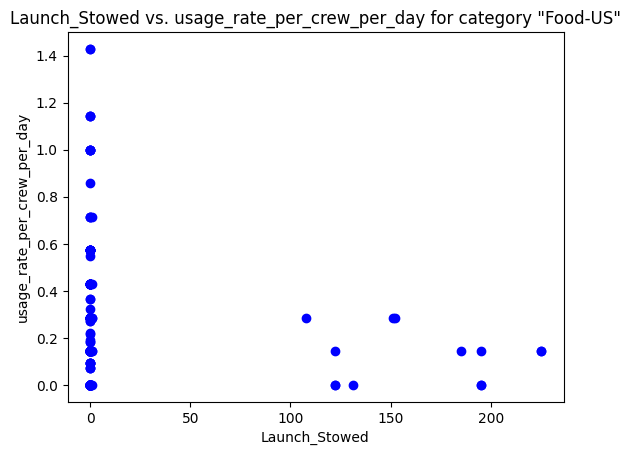

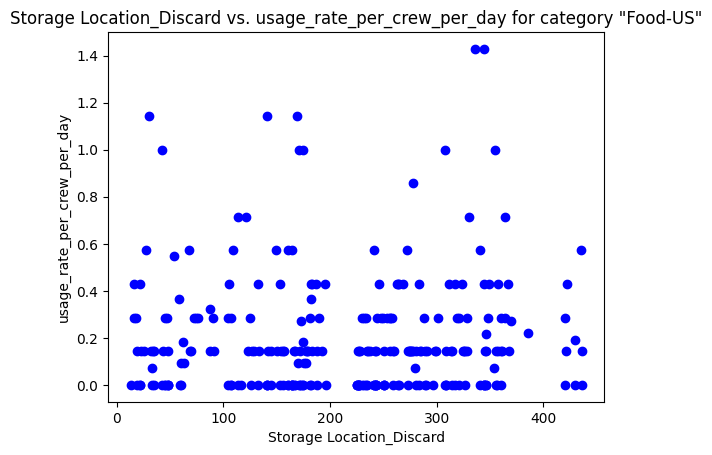

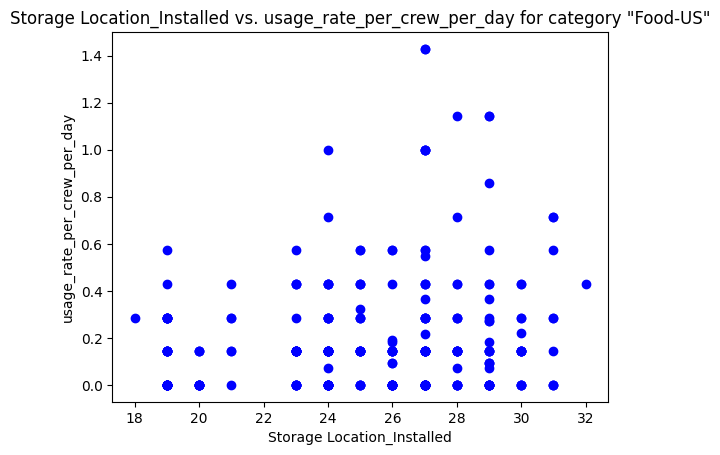

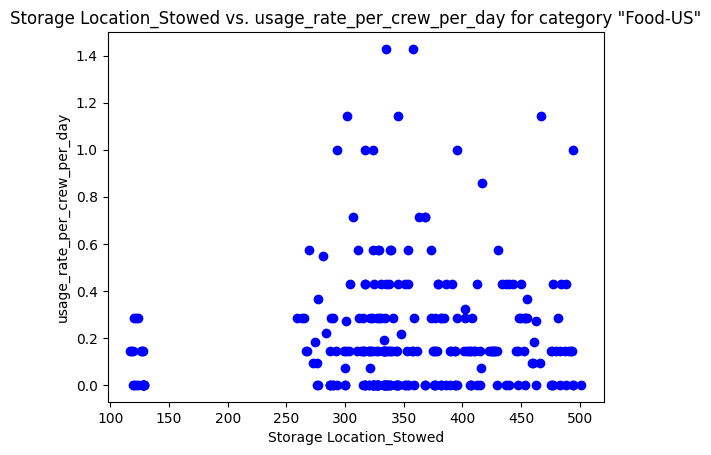

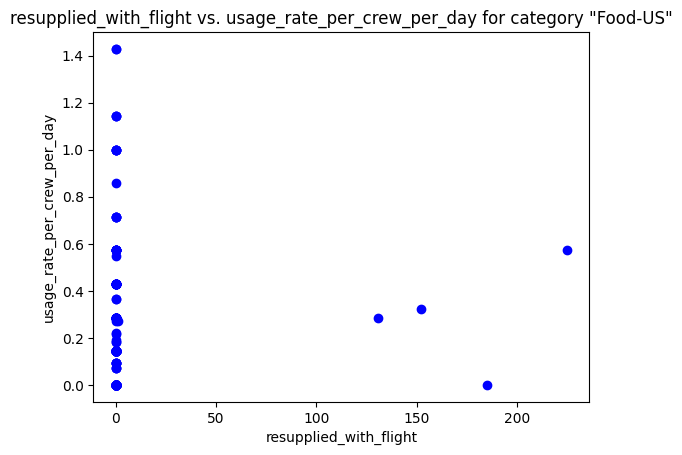

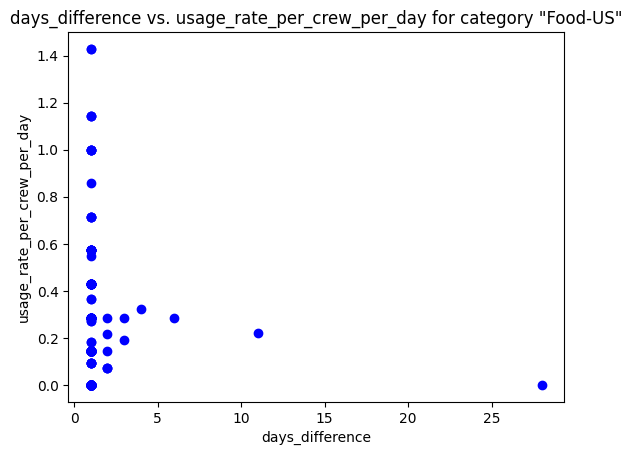

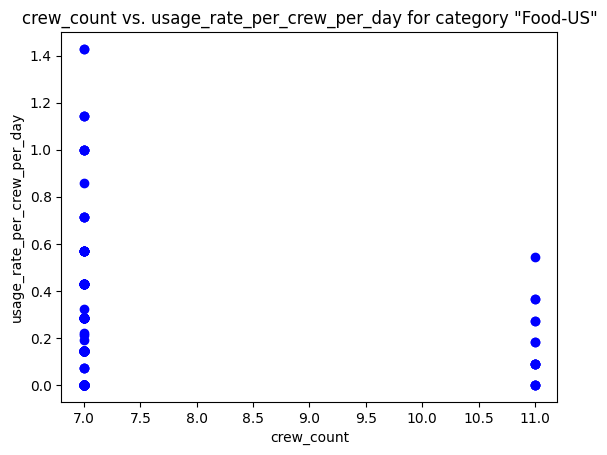

In [152]:
plot_features_with_target(df_master_PT_Food_US, features, 'usage_rate_per_crew_per_day','Food-US')

Looking at plots of each feature it looks like there is not any features that have direct linear relationship with target usage_rate_per_crew.Hence,linear Regression might not be the best algrothim to predict usage rate per crew.

Mean Squared Error for category 'Food-US': 0.03846653219997991
R Squared Error for category 'Food-US': -0.20354110199009123


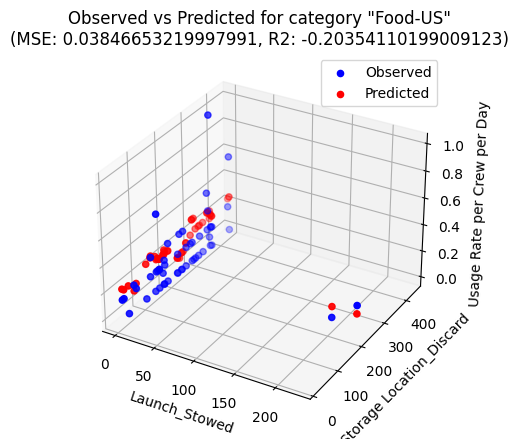

In [153]:
perform_linear_regression(df_master_PT_Food_US,features,'Food-US')


The mean squared error (MSE) of 0.038 for the 'Food-US' category suggests that the model's predictions deviated from the actual values by an average squared error of approximately 0.038. A negative R-squared value of -0.193 indicates that the model's predictions are performing worse than a model that simply predicts the mean of the target variable. This suggests that the model's predictions for the 'Food-US' category are not explaining much of the variance in the data and are possibly worse than baseline predictions.

### Logistic Regression

In [154]:
df_master_PT_ACY

,datedim_date,Launch_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,resupplied_with_flight,usage_rate_stowed,days_difference,crew_count,usage_rate_per_crew_per_day,hist_usage,vehicle_name,event,burn_rate,calculated_burn_rate,Item Used
0,2022-01-01,0,11,0,82,0.0,0.0,1.0,7,0.000000,9.1,,,9.1,0.000000,0
1,2022-01-02,0,11,0,82,0.0,0.0,1.0,7,0.000000,9.1,,,18.2,0.000000,0
2,2022-01-03,0,11,0,82,0.0,0.0,1.0,7,0.000000,9.1,,,27.3,0.000000,0
3,2022-01-05,0,11,0,82,0.0,0.0,2.0,7,0.000000,18.2,,,45.5,0.000000,0
4,2022-01-06,0,11,0,82,0.0,0.0,1.0,7,0.000000,9.1,,,54.6,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
539,2023-09-01,0,18,0,76,0.0,3.0,1.0,11,13.636364,14.3,,,5859.1,6083.333333,1
540,2023-09-02,0,18,0,76,0.0,0.0,1.0,11,0.000000,14.3,,,5873.4,6083.333333,0
541,2023-09-03,0,18,0,76,0.0,0.0,1.0,7,0.000000,9.1,,,5882.5,6083.333333,0
542,2023-09-04,0,18,0,76,0.0,0.0,1.0,7,0.000000,9.1,,,5891.6,6083.333333,0


### Function for Logistic Regression

In [155]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt

def logistic_regression_and_plot(df, features, target, category_name):
    # Selecting features and target variable
    X = df[features]  # Features
    y = df[target]    # Target

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Initialize and fit the logistic regression model
    model = LogisticRegression()
    model.fit(X_train, y_train)

    # Predict target variable for the test set
    y_pred = model.predict(X_test)

    # Evaluate the model
    accuracy = accuracy_score(y_test, y_pred)
    print(f"Accuracy for {category_name}:", accuracy)

    # Classification report and confusion matrix
    print(classification_report(y_test, y_pred))
    print(f"Confusion Matrix for {category_name}:")
    print(confusion_matrix(y_test, y_pred))

    # Plot observed vs. predicted values
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred, color='blue')
    plt.xlabel('Observed Values')
    plt.ylabel('Predicted Values')
    plt.title(f'Observed vs. Predicted {target} for {category_name}')
    plt.show()


### Logistic Regression for ACY Inserts

In [156]:
df_imsc_stg_loc['expired'] = (df_imsc_stg_loc['expire_date'] < df_imsc_stg_loc['datedim_date']).astype(int)
df_imsc_stg_loc[df_imsc_stg_loc['expired']==1]

,datedim_date,id,id_parent,id_path,tree_depth,tree,part_number,serial_number,location_name,original_ip_owner,...,is_container,is_moveable,system,subsystem,action_date,move_date,fill_status,categoryID,category_name,expired
95,2022-01-01,244129,295,/0/101/276/277/295/244129/,5,Storage Location,11Ф615.8720А55-20,980,ФГБ1ПГО_1_109,Russian Space Agency,...,1,1,SM Hygiene Sanitary Equipment,АсСУ,2016-07-20 15:01:35.307,2016-07-20 15:01:35.307,NaN,3,KTO,1
96,2022-01-01,244131,295,/0/101/276/277/295/244131/,5,Storage Location,11Ф615.8720А55-20,981,ФГБ1ПГО_1_109,Russian Space Agency,...,1,1,SM Hygiene Sanitary Equipment,АсСУ,2016-07-20 15:01:35.450,2016-07-20 15:01:35.450,NaN,3,KTO,1
97,2022-01-01,244132,295,/0/101/276/277/295/244132/,5,Storage Location,11Ф615.8720А55-20,983,ФГБ1ПГО_1_109,Russian Space Agency,...,1,1,SM Hygiene Sanitary Equipment,АсСУ,2016-07-20 15:01:35.507,2016-07-20 15:01:35.507,NaN,3,KTO,1
98,2022-01-01,244133,295,/0/101/276/277/295/244133/,5,Storage Location,11Ф615.8720А55-20,982,ФГБ1ПГО_1_109,Russian Space Agency,...,1,1,SM Hygiene Sanitary Equipment,АсСУ,2016-07-20 15:01:35.480,2016-07-20 15:01:35.480,NaN,3,KTO,1
106,2022-01-01,244141,91225,/0/101/276/277/295/91225/244141/,6,Storage Location,11Ф615.8720А55-10,990,ФГБ1ПГО_1_109,Russian Space Agency,...,1,1,SM Hygiene Sanitary Equipment,АсСУ,2021-02-03 16:38:56.920,2021-02-03 16:38:56.920,NaN,3,KTO,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5777545,2023-09-05,479882,413897,/0/413652/413664/413840/413897/479882/,5,Storage Location,17КС.260Ю 3200-0,B689,МЛМ1ПГО_4_428,Russian Space Agency,...,1,1,SM Food Supply System,NaN,2023-02-21 13:48:01.873,2023-02-14 10:00:45.057,NaN,7,Food-RS,1
5777626,2023-09-05,260923,490243,/0/487510/490243/260923/,3,Storage Location,А8-9060-400,1060885,ТГК453_на удаление,Russian Space Agency,...,1,1,SM Hygiene Sanitary Equipment,АсСУ,2023-08-25 07:12:45.627,2023-08-18 14:53:58.127,NaN,4,ACY Inserts,1
5777633,2023-09-05,467622,490243,/0/487510/490243/467622/,3,Storage Location,17КС.260Ю 3200-0,6825,ТГК453_на удаление,Russian Space Agency,...,1,1,SM Food Supply System,NaN,2023-08-02 06:30:31.100,2023-08-01 00:08:14.490,NaN,7,Food-RS,1
5777680,2023-09-05,422926,500723,/0/493860/493861/389918/500723/422926/,5,Storage Location,17КС.240Ю8711А-180,1355,CYG19_DPLY,NASA,...,1,1,ECLSS,WHC,2023-08-23 20:06:18.240,2023-08-23 20:04:51.893,FULL,1,EDV,1


Accuracy for ACY Inserts: 0.926605504587156
              precision    recall  f1-score   support

           0       0.93      1.00      0.96       101
           1       0.00      0.00      0.00         8

    accuracy                           0.93       109
   macro avg       0.46      0.50      0.48       109
weighted avg       0.86      0.93      0.89       109

Confusion Matrix for ACY Inserts:
[[101   0]
 [  8   0]]


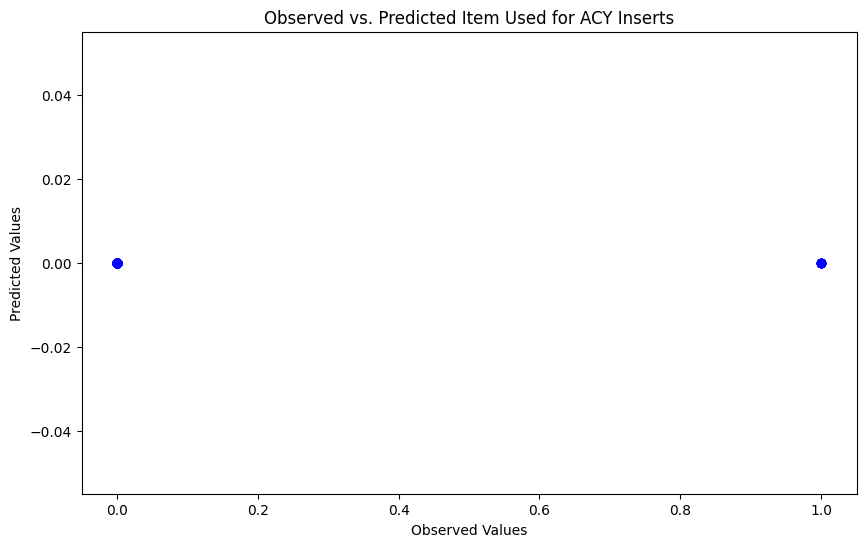

In [157]:
logistic_regression_and_plot(df_master_PT_ACY, ['days_difference', 'crew_count'], 'Item Used','ACY Inserts')

The accuracy score of 0.927 for ACY Inserts indicates that the model achieved an overall accuracy of approximately 92.7% in its predictions. However, the precision and recall for class 1 are both 0, implying the model's inability to correctly identify instances of class 1, possibly due to factors like class imbalance or insufficient data. The confusion matrix confirms this observation, with all instances being classified as class 0 and no true positives for class 1. Despite the high overall accuracy, the model's failure to detect instances of class 1 suggests a need for further investigation or improvement.

### Logistic Regression for KTO

Accuracy for KTO: 0.7431192660550459
              precision    recall  f1-score   support

           0       0.74      1.00      0.85        81
           1       0.00      0.00      0.00        28

    accuracy                           0.74       109
   macro avg       0.37      0.50      0.43       109
weighted avg       0.55      0.74      0.63       109

Confusion Matrix for KTO:
[[81  0]
 [28  0]]


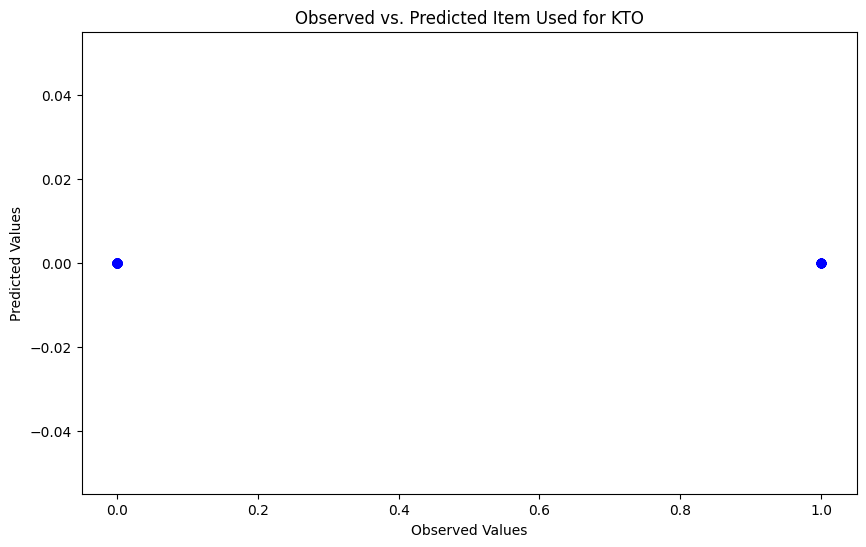

In [158]:
logistic_regression_and_plot(df_master_PT_KTO, ['days_difference', 'crew_count'], 'Item Used','KTO')

The accuracy score of 0.743 for KTO indicates that the model correctly classified about 74.3% of the total instances. However, it's important to note that this accuracy may be misleading due to class imbalance, as the precision and recall for class 1 are both 0. This suggests that the model struggled to correctly identify instances belonging to class 1, possibly due to insufficient data or a biased training set. The confusion matrix further illustrates this issue, showing that all instances were classified as class 0, leading to a lack of true positives for class 1.

### Logistic Regression for EDV

Accuracy for EDV: 0.9908256880733946
              precision    recall  f1-score   support

           0       0.99      1.00      1.00       108
           1       0.00      0.00      0.00         1

    accuracy                           0.99       109
   macro avg       0.50      0.50      0.50       109
weighted avg       0.98      0.99      0.99       109

Confusion Matrix for EDV:
[[108   0]
 [  1   0]]


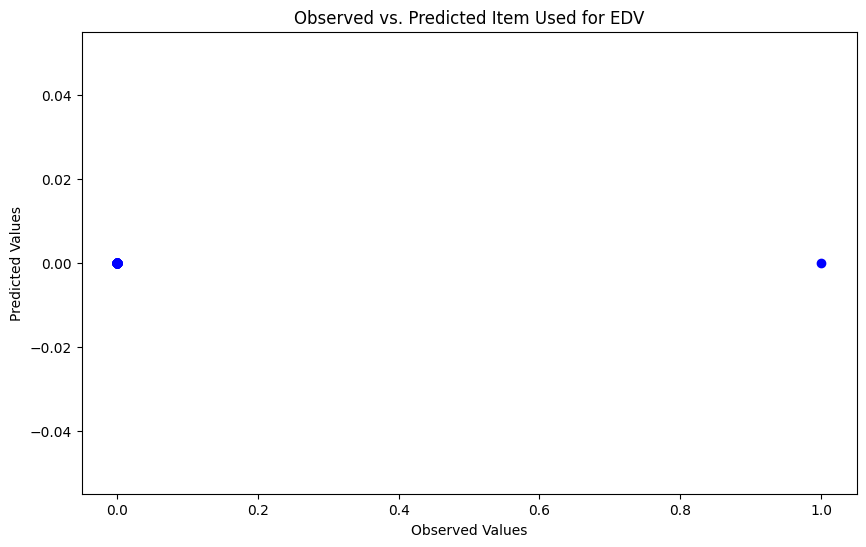

In [159]:
logistic_regression_and_plot(df_master_PT_EDV, ['days_difference', 'crew_count'], 'Item Used','EDV')

The accuracy score of 0.991 for EDV suggests that the model achieved a high level of overall correctness in its predictions, correctly classifying approximately 99.1% of the instances. However, similar to the previous case, the precision and recall for class 1 are both 0, indicating that the model struggled to identify instances belonging to class 1, possibly due to class imbalance or insufficient data. The confusion matrix reinforces this observation, with all instances being classified as class 0, resulting in no true positives for class 1. Despite the high accuracy, the model's inability to detect instances of class 1 suggests a need for further investigation or improvement.

## Conclusion

Based on the analyses conducted for various categories including ACY Inserts, KTO, EDV, and others using both linear regression and logistic regression models, several conclusions can be drawn:

##Linear Regression Analysis:
For categories like ACY Inserts, KTO, EDV, and others, simple linear regression models were employed to predict usage rates per crew per day based on various features such as crew count, launch/stowed status, resupply information, and others.
In many cases, the linear regression models failed to capture the relationships between the predictors and the target variable effectively, as indicated by high mean squared errors (MSE) and low or negative R-squared values.
The scatter plots of observed versus predicted values often showed discrepancies, suggesting that the models were unable to capture the complexity of the data and were potentially underfitting.


##Logistic Regression Analysis:
Logistic regression models were utilized to classify instances into categories like 'Item Used' or 'Usage Rate' based on features such as crew count, days difference, and others.

The accuracy scores of these logistic regression models were generally high, indicating that they performed well in terms of overall correctness in classifying instances.

However, precision and recall scores for certain classes were often low, suggesting that the models struggled to correctly identify instances belonging to those classes, possibly due to factors like class imbalance or insufficient data.


##Recommendations:
Further investigation into feature engineering, model selection, and hyperparameter tuning may improve model performance.

Alternative modeling approaches beyond linear and logistic regression, such as decision trees, random forests, or neural networks, may also be explored to capture non-linear relationships and improve predictive accuracy.


# Progress Rpt#4

## Optimization Analysis


In [160]:
crew_count_agg

,datedim_date,crew_count
0,2022-01-01,7
1,2022-01-02,7
2,2022-01-03,7
3,2022-01-04,7
4,2022-01-05,7
...,...,...
1456,2025-12-27,7
1457,2025-12-28,7
1458,2025-12-29,7
1459,2025-12-30,7


In [161]:
df_fltpln_dock

,datedim,vehicle_name,port_name,vehicle_type,eva_name,eva_type,eva_accuracy,event
47,2/17/2022,80Progress,MRM2 / SM Zenith,Progress,NaN,NaN,NaN,Dock
51,2/21/2022,NG-17,N1 Nadir,CRS2 Cygnus,NaN,NaN,NaN,Dock
76,3/18/2022,67Soyuz,NM,Soyuz,NaN,NaN,NaN,Dock
98,4/9/2022,Ax-1,N2 Zenith,PAM - SpaceX,NaN,NaN,NaN,Dock
116,4/27/2022,Crew-4,N2 Zenith,Crew Dragon,NaN,NaN,NaN,Dock
...,...,...,...,...,...,...,...,...
1356,9/10/2025,74Soyuz,MRM1 / FGB Nadir,Soyuz,NaN,NaN,NaN,Dock
1381,10/5/2025,CRS 2-24,N2 Nadir,CRS2,NaN,NaN,NaN,Dock
1409,11/2/2025,NG-24,N1 Nadir,CRS2 Cygnus,NaN,NaN,NaN,Dock
1434,11/27/2025,PAM-7,N2 Zenith,PAM,NaN,NaN,NaN,Dock


Merging flight plan and crew count

In [162]:
df_fltpln_dock['datedim'] = pd.to_datetime(df_fltpln_dock['datedim'])
crew_count_agg['datedim_date'] = pd.to_datetime(crew_count_agg['datedim_date'])

merged_df = pd.merge(crew_count_agg,df_fltpln_dock, left_on='datedim_date', right_on='datedim', how='left')


Filtering data for future prediction based on crew_count, docking event and date.

In [163]:
merged_df=merged_df[['datedim_date','crew_count','event','vehicle_name']]

In [164]:
merged_df_Food_US_COPY=merged_df.copy()

In [165]:
merged_df_Food_US_COPY

,datedim_date,crew_count,event,vehicle_name
0,2022-01-01,7,NaN,NaN
1,2022-01-02,7,NaN,NaN
2,2022-01-03,7,NaN,NaN
3,2022-01-04,7,NaN,NaN
4,2022-01-05,7,NaN,NaN
...,...,...,...,...
1456,2025-12-27,7,NaN,NaN
1457,2025-12-28,7,NaN,NaN
1458,2025-12-29,7,NaN,NaN
1459,2025-12-30,7,NaN,NaN


In [166]:
merged_df=merged_df[merged_df['datedim_date']>'2023-09-05'].reset_index()

In [167]:
df_master_PT_KTO['event_encoded'] = df_master_PT_KTO['event'].apply(lambda x: 1 if x == 'Dock' else 0)


In [168]:
merged_df['event'].fillna('',inplace=True)

In [169]:
merged_df['event_encoded'] = merged_df['event'].apply(lambda x: 1 if x == 'Dock' else 0)
merged_df_Food_US_COPY['event_encoded'] = merged_df_Food_US_COPY['event'].apply(lambda x: 1 if x == 'Dock' else 0)

In [170]:
merged_df['days_difference'] = (merged_df['datedim_date'] - merged_df['datedim_date'].shift(1)).dt.days
merged_df_Food_US_COPY['days_difference'] = (merged_df_Food_US_COPY['datedim_date'] - merged_df_Food_US_COPY['datedim_date'].shift(1)).dt.days

In [171]:
df_master_PT_Food_US

,datedim_date,Launch_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,resupplied_with_flight,usage_rate_stowed,days_difference,crew_count,usage_rate_per_crew_per_day,hist_usage,vehicle_name,event,burn_rate,calculated_burn_rate,Item Used
278,2022-10-20,0,227,20,128,0.0,0.0,1.0,7,0.000000,0.189,,,0.189,0.000000,0
279,2022-10-21,0,227,20,129,0.0,0.0,1.0,7,0.000000,0.189,,,0.378,0.000000,0
280,2022-10-22,0,227,20,129,0.0,0.0,1.0,7,0.000000,0.189,,,0.567,0.000000,0
281,2022-10-23,0,227,20,129,0.0,0.0,1.0,7,0.000000,0.189,,,0.756,0.000000,0
282,2022-10-24,0,228,20,128,0.0,1.0,1.0,7,0.142857,0.189,,,0.945,1.000000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
539,2023-09-01,0,177,29,459,0.0,1.0,1.0,11,0.090909,0.297,,,61.533,379.128788,1
540,2023-09-02,0,182,29,455,0.0,4.0,1.0,11,0.363636,0.297,,,61.830,383.128788,1
541,2023-09-03,0,181,31,453,0.0,2.0,1.0,7,0.285714,0.189,,,62.019,385.128788,1
542,2023-09-04,0,181,31,453,0.0,0.0,1.0,7,0.000000,0.189,,,62.208,385.128788,0


In [172]:
merged_df['days_difference'].fillna(1,inplace=True)

In [173]:
merged_df

,index,datedim_date,crew_count,event,vehicle_name,event_encoded,days_difference
0,613,2023-09-06,7,,NaN,0,1.0
1,614,2023-09-07,7,,NaN,0,1.0
2,615,2023-09-08,7,,NaN,0,1.0
3,616,2023-09-09,7,,NaN,0,1.0
4,617,2023-09-10,7,,NaN,0,1.0
...,...,...,...,...,...,...,...
843,1456,2025-12-27,7,,NaN,0,1.0
844,1457,2025-12-28,7,,NaN,0,1.0
845,1458,2025-12-29,7,,NaN,0,1.0
846,1459,2025-12-30,7,,NaN,0,1.0


Making a copy of each cosumable for future use

In [174]:
merged_df_KTO=merged_df.copy()
merged_df_EDV=merged_df.copy()
merged_df_ACY=merged_df.copy()
merged_df_Food_US=merged_df.copy()
merged_df_Food_RS=merged_df.copy()
merged_df_FI=merged_df.copy()

Calculating days_difference.

In [175]:
merged_df_KTO['time']=613+merged_df_KTO['days_difference'].cumsum()-1
merged_df_EDV['time']=613+merged_df_EDV['days_difference'].cumsum()-1
merged_df_ACY['time']=613+merged_df_ACY['days_difference'].cumsum()-1
merged_df_Food_US['time']=321+merged_df_Food_US['days_difference'].cumsum()-1
merged_df_Food_RS['time']=321+merged_df_Food_RS['days_difference'].cumsum()-1
merged_df_FI['time']=613+merged_df_FI['days_difference'].cumsum()-1
merged_df_Food_US_COPY['time']=merged_df_Food_US_COPY['days_difference'].cumsum()

In [176]:
merged_df_Food_US_COPY['days_difference'].fillna(1, inplace=True)
merged_df_Food_US_COPY['time'].fillna(0, inplace=True)

Assinging historical usage

In [177]:
merged_df_KTO['hist_usage']=merged_df_KTO['crew_count']*0.007576
merged_df_EDV['hist_usage']=merged_df_EDV['crew_count']*0.007576
merged_df_ACY['hist_usage']=merged_df_ACY['crew_count']*1.3/50
merged_df_Food_US['hist_usage']=merged_df_Food_US['crew_count']*0.027
merged_df_Food_RS['hist_usage']=merged_df_Food_RS['crew_count']*0.2
merged_df_FI['hist_usage']=merged_df_FI['crew_count']*0.007576
merged_df_Food_US_COPY['hist_usage']=merged_df_Food_US_COPY['crew_count']*0.027


In [178]:
df_master_PT_Food_US

,datedim_date,Launch_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,resupplied_with_flight,usage_rate_stowed,days_difference,crew_count,usage_rate_per_crew_per_day,hist_usage,vehicle_name,event,burn_rate,calculated_burn_rate,Item Used
278,2022-10-20,0,227,20,128,0.0,0.0,1.0,7,0.000000,0.189,,,0.189,0.000000,0
279,2022-10-21,0,227,20,129,0.0,0.0,1.0,7,0.000000,0.189,,,0.378,0.000000,0
280,2022-10-22,0,227,20,129,0.0,0.0,1.0,7,0.000000,0.189,,,0.567,0.000000,0
281,2022-10-23,0,227,20,129,0.0,0.0,1.0,7,0.000000,0.189,,,0.756,0.000000,0
282,2022-10-24,0,228,20,128,0.0,1.0,1.0,7,0.142857,0.189,,,0.945,1.000000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
539,2023-09-01,0,177,29,459,0.0,1.0,1.0,11,0.090909,0.297,,,61.533,379.128788,1
540,2023-09-02,0,182,29,455,0.0,4.0,1.0,11,0.363636,0.297,,,61.830,383.128788,1
541,2023-09-03,0,181,31,453,0.0,2.0,1.0,7,0.285714,0.189,,,62.019,385.128788,1
542,2023-09-04,0,181,31,453,0.0,0.0,1.0,7,0.000000,0.189,,,62.208,385.128788,0


Function to calculate stowed historical

In [179]:
def update_hist_storage_stowed_burn(df,storage_ct):

    df.loc[0, 'stowed_historical'] = storage_ct - df.loc[0, 'hist_usage']

    for i in range(1, len(df)):
        df.loc[i, 'stowed_historical'] = df.loc[i-1, 'stowed_historical'] - df.loc[i, 'hist_usage']

    return df



In [180]:
update_hist_storage_stowed_burn(merged_df_KTO,314)
update_hist_storage_stowed_burn(merged_df_EDV,15)
update_hist_storage_stowed_burn(merged_df_ACY,51)
update_hist_storage_stowed_burn(merged_df_FI,28)
update_hist_storage_stowed_burn(merged_df_Food_US,760)
update_hist_storage_stowed_burn(merged_df_Food_RS,-228)


,index,datedim_date,crew_count,event,vehicle_name,event_encoded,days_difference,time,hist_usage,stowed_historical
0,613,2023-09-06,7,,NaN,0,1.0,321.0,1.4,-229.4
1,614,2023-09-07,7,,NaN,0,1.0,322.0,1.4,-230.8
2,615,2023-09-08,7,,NaN,0,1.0,323.0,1.4,-232.2
3,616,2023-09-09,7,,NaN,0,1.0,324.0,1.4,-233.6
4,617,2023-09-10,7,,NaN,0,1.0,325.0,1.4,-235.0
...,...,...,...,...,...,...,...,...,...,...
843,1456,2025-12-27,7,,NaN,0,1.0,1164.0,1.4,-1520.4
844,1457,2025-12-28,7,,NaN,0,1.0,1165.0,1.4,-1521.8
845,1458,2025-12-29,7,,NaN,0,1.0,1166.0,1.4,-1523.2
846,1459,2025-12-30,7,,NaN,0,1.0,1167.0,1.4,-1524.6


In [181]:
import matplotlib.pyplot as plt

def plot_consumables_analysis(merged_df_EDV, threshold, category):
    merged_df_EDV['resupply_quantity'] = threshold - merged_df_EDV['stowed_historical']
    merged_df_EDV.loc[merged_df_EDV['resupply_quantity'] < 0, 'resupply_quantity'] = 0  # Ensure resupply quantity is non-negative

    plt.figure(figsize=(10, 6))

    # Plot historical burn rate
    plt.plot(merged_df_EDV['datedim_date'], merged_df_EDV['stowed_historical'], label='Historical Burn Rate')
    plt.plot(merged_df_EDV['datedim_date'], merged_df_EDV['resupply_quantity'], label='Required Resupply Quantity')

    # Add threshold line
    plt.axhline(y=threshold, color='r', linestyle='--', label='Threshold')

    # Add docking events
    docking_dates = merged_df_EDV.loc[merged_df_EDV['event'] == 'Dock', 'datedim_date']
    plt.scatter(docking_dates, [threshold] * len(docking_dates), color='blue', marker='*', label='Docking Events')

    # Add labels and title
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.title(f'Resupply Analysis for {category}')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.tight_layout()

    # Show plot
    plt.show()



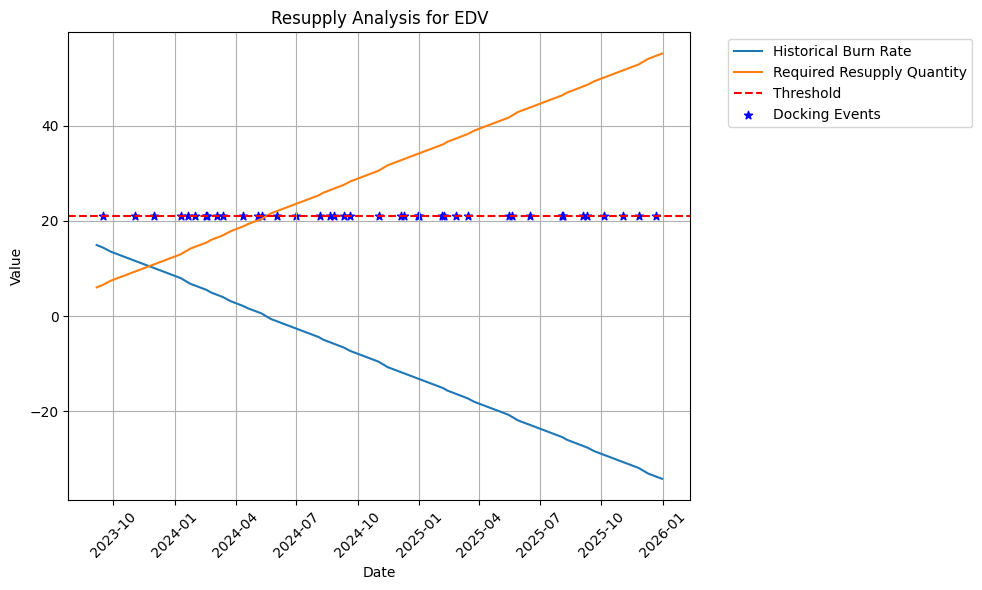

In [182]:
plot_consumables_analysis(merged_df_EDV,21,'EDV')


From above plot, we can note that based on historical rate EDV will be below threshold in 2024-04, and will need resupply in the docking date earlier than 2024-04.

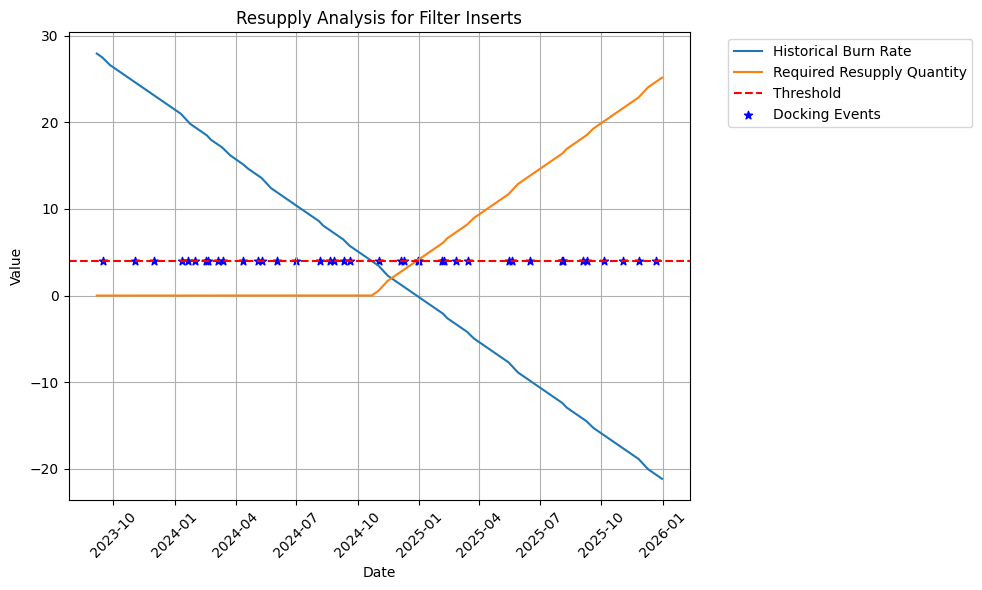

In [183]:
plot_consumables_analysis(merged_df_FI,4,'Filter Inserts')


From above plot, we can note that based on historical rate Filter Inserts will be below threshold in 2024-07, and will need resupply in the docking date earlier than 2024-07.

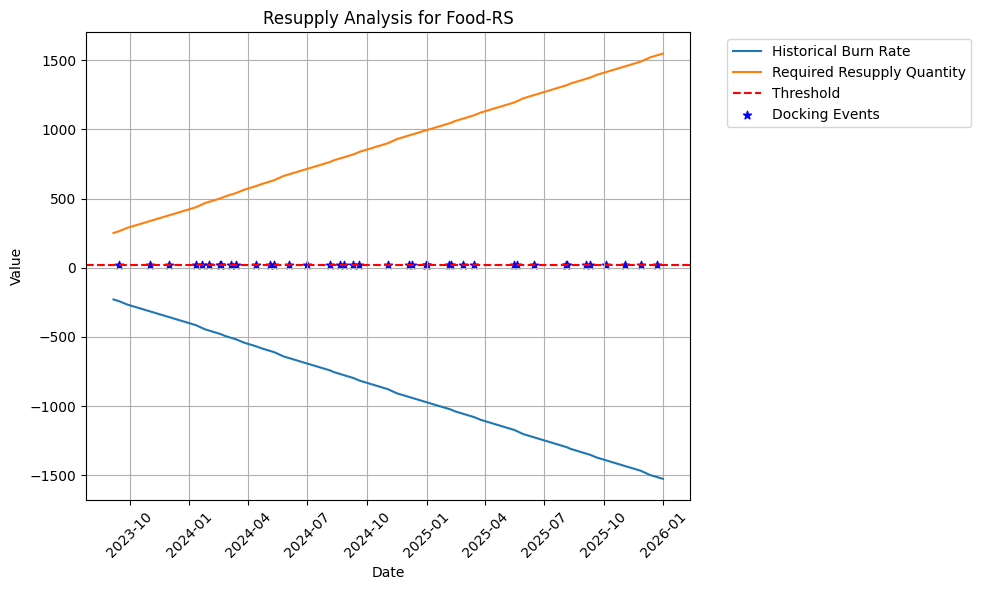

In [184]:
plot_consumables_analysis(merged_df_Food_RS,21.6,'Food-RS')


From above plot, we can note that based on historical rate Food-RS will be below threshold in 2023-10, and will need resupply in the docking date earlier than 2023-10.

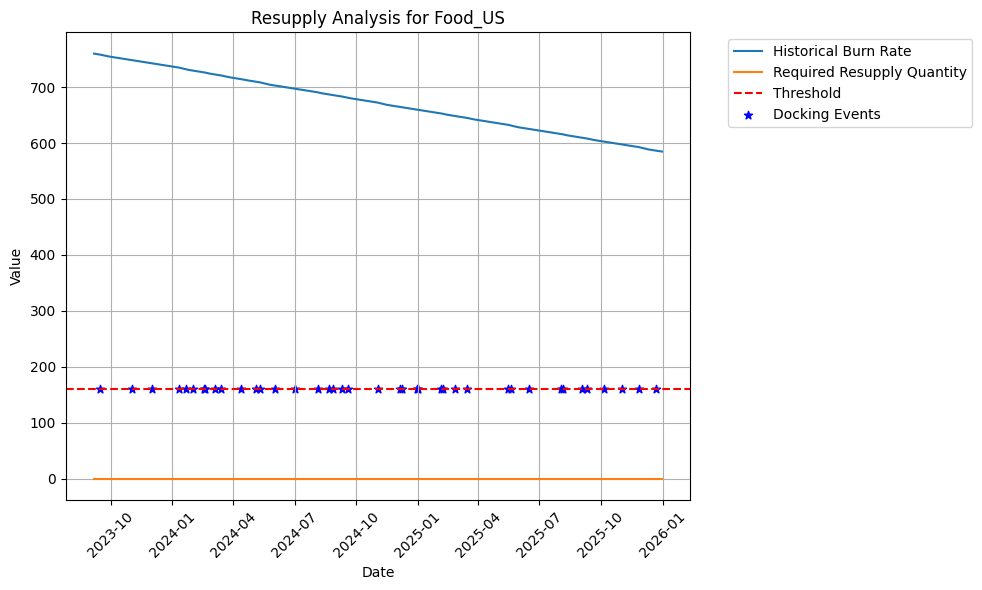

In [185]:
plot_consumables_analysis(merged_df_Food_US,160,'Food_US')


From above plot, we can note that based on historical rate for Food-US will not below threshold for next 3 years and well supplied.

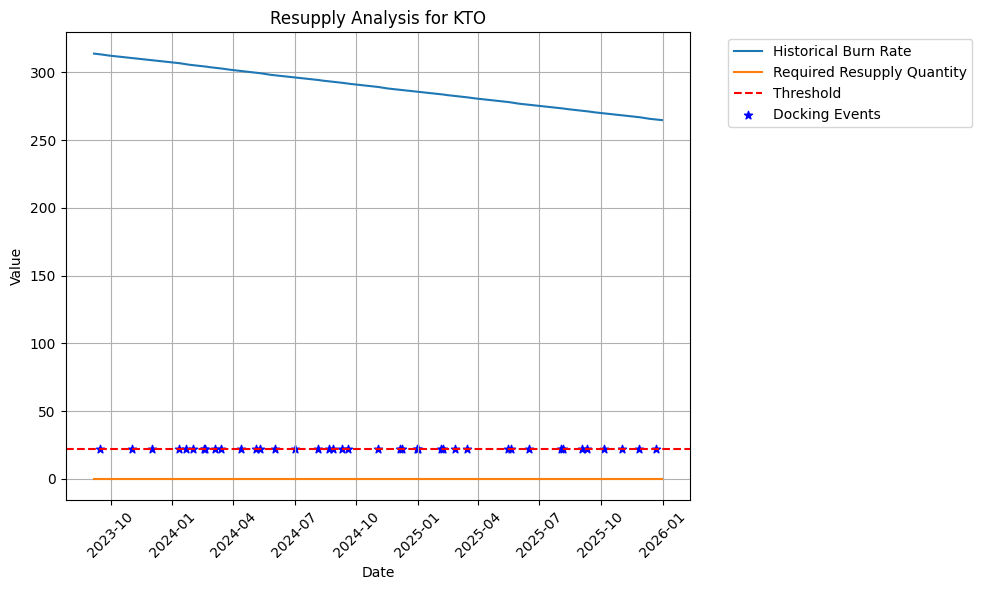

In [186]:
plot_consumables_analysis(merged_df_KTO,22,'KTO')


From above plot, we can note that based on historical rate for KTO will not below threshold for next 3 years and well supplied.

In [187]:
merged_df=merged_df.drop('index',axis=1)

In [188]:
df_master_PT_KTO['time']=df_master_PT_KTO['days_difference'].cumsum()-1

In [189]:
merged_df_ACY_mod=merged_df_ACY.copy()

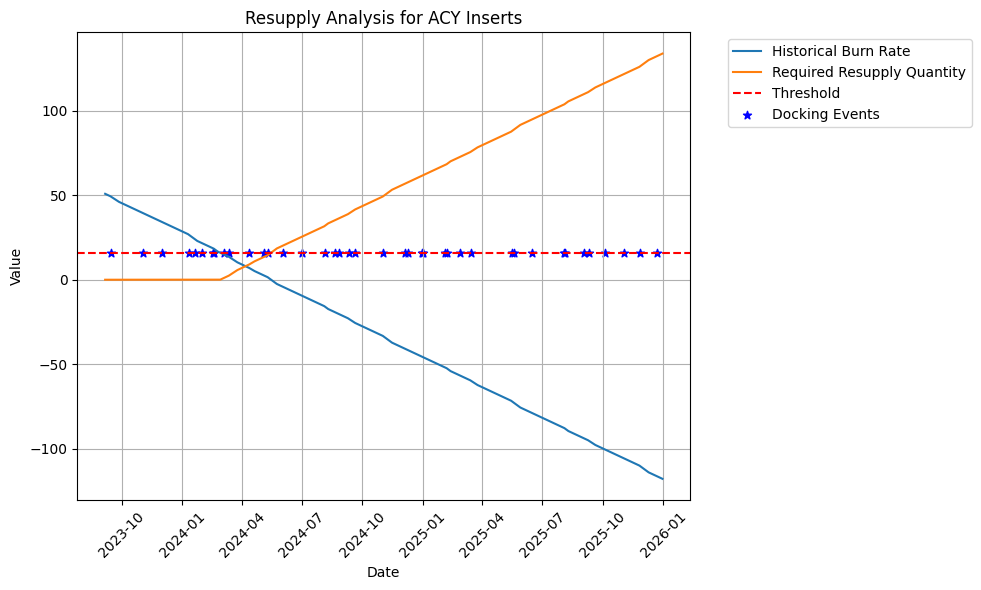

In [190]:
plot_consumables_analysis(merged_df_ACY,16,'ACY Inserts')


From above plot, we can note that based on historical rate ACY Inserts will be below threshold in 2024-07, and will need resupply in the docking date earlier than 2024-07.

In [191]:
df_master_PT_EDV['stowed_historical']=df_master_PT_EDV['Storage Location_Stowed']-df_master_PT_EDV['burn_rate']+df_master_PT_EDV['resupplied_with_flight']

In [192]:
df_master_PT_EDV.loc[0, 'stowed_historical'] = 33 - df_master_PT_EDV.loc[0, 'hist_usage']

    # Update the second row and onwards
for i in range(1, len(df_master_PT_EDV)):
        df_master_PT_EDV.loc[i, 'stowed_historical'] = df_master_PT_EDV.loc[i-1, 'stowed_historical'] - df_master_PT_EDV.loc[i, 'hist_usage']+df_master_PT_EDV.loc[i, 'resupplied_with_flight']


In [193]:
df_master_PT_EDV['time']=df_master_PT_EDV['days_difference'].cumsum()-1

In [194]:
df_master_PT_EDV

,datedim_date,Launch_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,resupplied_with_flight,usage_rate_stowed,days_difference,crew_count,usage_rate_per_crew_per_day,hist_usage,vehicle_name,event,burn_rate,calculated_burn_rate,Item Used,stowed_historical,time
0,2022-01-01,0,0,2,33,0.0,0.0,1.0,7,0.000000,0.053032,,,0.053032,0.000000,0,32.946968,0.0
1,2022-01-02,0,0,2,33,0.0,0.0,1.0,7,0.000000,0.053032,,,0.106064,0.000000,0,32.893936,1.0
2,2022-01-03,0,0,2,33,0.0,0.0,1.0,7,0.000000,0.053032,,,0.159096,0.000000,0,32.840904,2.0
3,2022-01-05,0,1,3,31,0.0,2.0,2.0,7,0.142857,0.106064,,,0.265160,1.000000,1,32.734840,4.0
4,2022-01-06,0,1,3,31,0.0,0.0,1.0,7,0.000000,0.053032,,,0.318192,1.000000,0,32.681808,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
539,2023-09-01,0,1,4,33,0.0,0.0,1.0,11,0.000000,0.083336,,,34.145032,26.590909,0,14.854968,608.0
540,2023-09-02,0,1,4,33,0.0,0.0,1.0,11,0.000000,0.083336,,,34.228368,26.590909,0,14.771632,609.0
541,2023-09-03,0,1,4,33,0.0,0.0,1.0,7,0.000000,0.053032,,,34.281400,26.590909,0,14.718600,610.0
542,2023-09-04,0,1,4,33,0.0,0.0,1.0,7,0.000000,0.053032,,,34.334432,26.590909,0,14.665568,611.0


In [195]:
def calculate_stowed_historical(df):
    # Get the initial stowed value from the first row
    initial_stowed_value = df.loc[0, 'Storage Location_Stowed']
    #df_master_PT_Food_US['stowed_historical'].astype('float')
    # Set initial stowed value for index 0
    df.loc[0, 'stowed_historical'] = initial_stowed_value - df.loc[0, 'hist_usage']

    # Update stowed values for subsequent rows
    for i in range(1, len(df)):
       df.loc[i, 'stowed_historical'] = df.loc[i-1, 'stowed_historical'] - df.loc[i, 'hist_usage'] + df.loc[i, 'resupplied_with_flight']
       #df.loc[i, 'stowed_historical'] = df.loc[i-1, 'stowed_historical'] - df.loc[i, 'hist_usage']
    # Calculate the 'time' column
    df['time'] = df['days_difference'].cumsum() - 1

    df['event_encoded'] = df['event'].apply(lambda x: 1 if x == 'Dock' else 0)


In [196]:
print(df_master_PT_FOOD_RS.columns)

Index(['datedim_date', 'Launch_Stowed', 'Storage Location_Discard',
       'Storage Location_Installed', 'Storage Location_Stowed',
       'resupplied_with_flight', 'usage_rate_stowed', 'days_difference',
       'crew_count', 'usage_rate_per_crew_per_day', 'hist_usage',
       'vehicle_name', 'event', 'burn_rate', 'calculated_burn_rate',
       'Item Used'],
      dtype='object')


In [197]:
df_master_PT_Food_US=df_master_PT_Food_US.reset_index()
df_master_PT_FOOD_RS=df_master_PT_FOOD_RS.reset_index()


In [198]:
df_master_PT_Food_US = df_master_PT_Food_US.drop(columns=['index'])
df_master_PT_FOOD_RS=df_master_PT_FOOD_RS.drop(columns=['index'])

In [199]:
df_master_PT_ACY_MOD=df_master_PT_ACY.copy()

In [200]:
df_master_PT_ACY_MOD['burn_rate']=df_master_PT_ACY_MOD['burn_rate']/50
df_master_PT_ACY_MOD['hist_usage']=df_master_PT_ACY_MOD['hist_usage']/50

In [201]:
calculate_stowed_historical(df_master_PT_EDV)
calculate_stowed_historical(df_master_PT_Food_US)
calculate_stowed_historical(df_master_PT_FOOD_RS)
calculate_stowed_historical(df_master_PT_ACY_MOD)
calculate_stowed_historical(df_master_PT_FI)
calculate_stowed_historical(df_master_PT_KTO)



In [202]:
df_master_PT_Food_US['stowed_historical'].astype('float')

0      127.811
1      127.622
2      127.433
3      127.244
4      127.055
        ...   
261    760.467
262    760.170
263    759.981
264    759.792
265    759.603
Name: stowed_historical, Length: 266, dtype: float64

In [203]:
df_rtdefn

,rate_category,affected_consumable,rate,units,type,efficiency
0,US Food BOBs,US Food BOBs,0.027000,BOBS/Crew/Day,usage,NaN
1,RS Food,RS Food Rations,0.200000,Rations/Crew/Day,usage,NaN
2,ACY Inserts,ACY Inserts,1.300000,Insert/Crew/Day,usage,NaN
3,KTO,KTO,0.035714,KTO/Crew/day,usage,NaN
4,Pretreat Tank,Pretreat Tanks,0.005556,Pretreat/Crew/Day,usage,NaN
5,Filter Inserts,Filter Inserts,0.007576,Insert Filter/Crew/Day,usage,NaN
6,Urine Receptacle,Urine Receptacle,0.007576,Urine Receptacle/Crew/Day,usage,NaN
7,Crew Metabolic O2 Usage,Oxygen,1.830000,lbs/Crew/Day,usage,NaN
8,Oxygen Generation Assembly (OGA),Oxygen,20.400000,lbs/Day*Efficiency,generation,1.0
9,PrK Leakage Air,Air,0.750000,lbs/Day,usage,NaN


In [204]:
df_master_PT_Food_US[['Storage Location_Stowed','resupplied_with_flight','days_difference','crew_count','hist_usage','stowed_historical']]

,Storage Location_Stowed,resupplied_with_flight,days_difference,crew_count,hist_usage,stowed_historical
0,128,0.0,1.0,7,0.189,127.811
1,129,0.0,1.0,7,0.189,127.622
2,129,0.0,1.0,7,0.189,127.433
3,129,0.0,1.0,7,0.189,127.244
4,128,0.0,1.0,7,0.189,127.055
...,...,...,...,...,...,...
261,459,0.0,1.0,11,0.297,760.467
262,455,0.0,1.0,11,0.297,760.170
263,453,0.0,1.0,7,0.189,759.981
264,453,0.0,1.0,7,0.189,759.792


In [205]:
df_master_PT_ACY_MOD

,datedim_date,Launch_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,resupplied_with_flight,usage_rate_stowed,days_difference,crew_count,usage_rate_per_crew_per_day,hist_usage,vehicle_name,event,burn_rate,calculated_burn_rate,Item Used,stowed_historical,time,event_encoded
0,2022-01-01,0,11,0,82,0.0,0.0,1.0,7,0.000000,0.182,,,0.182,0.000000,0,81.818,0.0,0
1,2022-01-02,0,11,0,82,0.0,0.0,1.0,7,0.000000,0.182,,,0.364,0.000000,0,81.636,1.0,0
2,2022-01-03,0,11,0,82,0.0,0.0,1.0,7,0.000000,0.182,,,0.546,0.000000,0,81.454,2.0,0
3,2022-01-05,0,11,0,82,0.0,0.0,2.0,7,0.000000,0.364,,,0.910,0.000000,0,81.090,4.0,0
4,2022-01-06,0,11,0,82,0.0,0.0,1.0,7,0.000000,0.182,,,1.092,0.000000,0,80.908,5.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
539,2023-09-01,0,18,0,76,0.0,3.0,1.0,11,13.636364,0.286,,,117.182,6083.333333,1,51.818,608.0,0
540,2023-09-02,0,18,0,76,0.0,0.0,1.0,11,0.000000,0.286,,,117.468,6083.333333,0,51.532,609.0,0
541,2023-09-03,0,18,0,76,0.0,0.0,1.0,7,0.000000,0.182,,,117.650,6083.333333,0,51.350,610.0,0
542,2023-09-04,0,18,0,76,0.0,0.0,1.0,7,0.000000,0.182,,,117.832,6083.333333,0,51.168,611.0,0


## Supervised Learning




Function to perform multiple supervised learning algorthims. This function will be called for all the categories. Target in this function is Storage Location_Stowed.

In [206]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.ensemble import AdaBoostRegressor, BaggingRegressor, RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor

# Define algorithms and their parameters, including line color
algorithms = [
    (LinearRegression(), 'Linear Regression', '-', 'blue'),
    (SVR(kernel='linear'), 'SVR', '--', 'orange'),
    (AdaBoostRegressor(n_estimators=50, random_state=42), 'AdaBoost', '-.', 'green'),
    (BaggingRegressor(n_estimators=50, random_state=42), 'Bagging', ':', 'red'),
    (KNeighborsRegressor(n_neighbors=5), 'KNN', '-', 'purple'),
    (RandomForestRegressor(n_estimators=50, random_state=42), 'Random Forest', '-.', 'brown')
]

def train_and_plot_algorithms(df, category_name, algorithms):
    # Convert datedim_date to datetime object and then to string without timestamp
    df['datedim_date'] = pd.to_datetime(df['datedim_date']).dt.strftime('%Y-%m-%d')

    # Convert stowed_historical to integer
    df['stowed_historical'] = df['stowed_historical'].round().astype(int)

    # Define features (X) and target variable (y)
    X = df[['time', 'crew_count', 'event_encoded']]
    y = df['Storage Location_Stowed']

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Create subplots
    fig, axs = plt.subplots(2, 3, figsize=(15, 10))

    for ax, (model, name, style, color) in zip(axs.flatten(), algorithms):
        # Train the model
        model.fit(X_train, y_train)

        # Predict target variable for test set
        y_pred = model.predict(X_test)

        # Calculate Mean Squared Error
        mse = mean_squared_error(y_test, y_pred)

        # Predict target variable using the trained model
        predicted_values = model.predict(X)

        # Calculate Mean Squared Error for stowed_historical based on predicted values
        mse_historical = mean_squared_error(df['stowed_historical'], predicted_values)

        # Combine all stowed quantities to find the min and max
        stowed_values = pd.concat([df['Storage Location_Stowed'], df['stowed_historical'], pd.Series(predicted_values)], axis=0)

        # Plot the predicted values with MSE in legend
        ax.plot(df.index, predicted_values, label=f'{name} (MSE: {mse:.2f})', linestyle=style, color=color)

        # Plot the actual values
        ax.plot(df.index, df['Storage Location_Stowed'], label='Actual Stowed', color='black', linestyle='-')

        # Plot the historical values
        ax.plot(df.index, df['stowed_historical'], label='Stowed based on Historical Rate', color='gray', linestyle='--')

        # Plot formatting
        ax.grid(True)
        ax.legend(loc='lower right')
        ax.set_title(name)
        ax.set_xlabel('Date')
        ax.set_ylabel('Stowed Quantity')  # Update y-axis label

        # Set x-axis tick labels as dates
        ax.set_xticks(df.index[::len(df.index)//5])
        ax.set_xticklabels(df['datedim_date'][::len(df.index)//5], rotation=45)

        # Set y-axis tick labels based on the range of stowed quantities
        stowed_min = stowed_values.min()
        stowed_max = stowed_values.max()
        yticks = range(int(stowed_min), int(stowed_max)+1)
        if len(yticks) > 6:
            step = len(yticks) // 5
            yticks = yticks[::step]
        ax.set_yticks(yticks)
        print(f'MSE for Stowed Historical for {category_name} using {name} : {mse_historical}')
    # Add labels and category name in the main title
    fig.suptitle(f'Actual vs Predicted Stowed Storage ({category_name})', fontsize=16)

    plt.tight_layout()
    plt.show()



### Supervised Learning for Food -US ( Linear Regression, SVR, AdaBoost, Bagging ,KNN and Ranfom Forest)

In [207]:
df_master_PT_Food_US

,datedim_date,Launch_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,resupplied_with_flight,usage_rate_stowed,days_difference,crew_count,usage_rate_per_crew_per_day,hist_usage,vehicle_name,event,burn_rate,calculated_burn_rate,Item Used,stowed_historical,time,event_encoded
0,2022-10-20,0,227,20,128,0.0,0.0,1.0,7,0.000000,0.189,,,0.189,0.000000,0,127.811,0.0,0
1,2022-10-21,0,227,20,129,0.0,0.0,1.0,7,0.000000,0.189,,,0.378,0.000000,0,127.622,1.0,0
2,2022-10-22,0,227,20,129,0.0,0.0,1.0,7,0.000000,0.189,,,0.567,0.000000,0,127.433,2.0,0
3,2022-10-23,0,227,20,129,0.0,0.0,1.0,7,0.000000,0.189,,,0.756,0.000000,0,127.244,3.0,0
4,2022-10-24,0,228,20,128,0.0,1.0,1.0,7,0.142857,0.189,,,0.945,1.000000,1,127.055,4.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,2023-09-01,0,177,29,459,0.0,1.0,1.0,11,0.090909,0.297,,,61.533,379.128788,1,760.467,316.0,0
262,2023-09-02,0,182,29,455,0.0,4.0,1.0,11,0.363636,0.297,,,61.830,383.128788,1,760.170,317.0,0
263,2023-09-03,0,181,31,453,0.0,2.0,1.0,7,0.285714,0.189,,,62.019,385.128788,1,759.981,318.0,0
264,2023-09-04,0,181,31,453,0.0,0.0,1.0,7,0.000000,0.189,,,62.208,385.128788,0,759.792,319.0,0


In [208]:
merged_df_Food_US_Pred_Usage_Qty=merged_df_Food_US.copy()
merged_df_Food_US_Pred_Stowed_Qty=merged_df_Food_US.copy()

MSE for Stowed Historical for Food-US using Linear Regression : 35386.091134842995
MSE for Stowed Historical for Food-US using SVR : 41924.886690234525
MSE for Stowed Historical for Food-US using AdaBoost : 29111.851482606082
MSE for Stowed Historical for Food-US using Bagging : 27626.2197037594
MSE for Stowed Historical for Food-US using KNN : 27951.378045112782
MSE for Stowed Historical for Food-US using Random Forest : 27619.97822406015


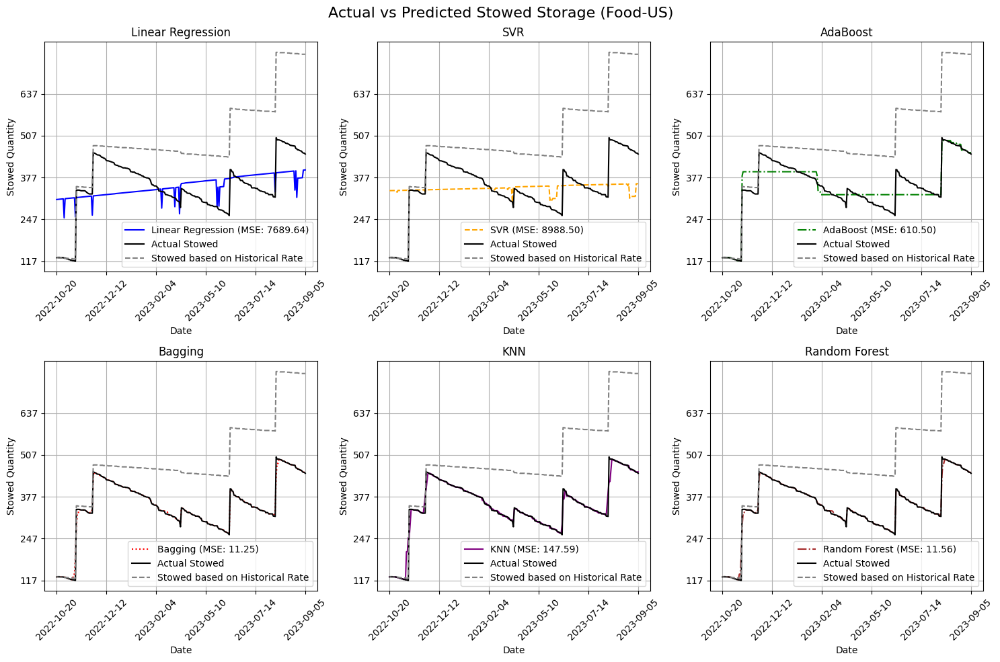

In [209]:
train_and_plot_algorithms(df_master_PT_Food_US,'Food-US',algorithms)

From above, we can note that historical usage quantity way higher than actual stowed usage quantity. It is because historical rate is way lower for Food-US, than calculated usage rate and with resupply added each time, the graph is going up. Linear regression, SVR and AdaBoost has really high MSE. Bagging, KNN and Random forest has low MSE incomparison. But looking at the graph, those algorithm seems to be overfitting.

In [210]:
#df_master_PT_Food_US.to_csv('/content/drive/My Drive/CS 6330 SpaceX Spring 2024/dt_master_PT_Food_US.csv')

In [211]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

def train_linear_regression_stowed(df_train, df_predict):
    # Convert stowed_historical to integer
    df_train['stowed_historical'] = df_train['stowed_historical'].round().astype(int)

    # Define features (X) and target variable (y) for training data
    X = df_train[['time', 'crew_count', 'event_encoded']]
    y = df_train['Storage Location_Stowed']

    # Split the training data into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Create linear regression model
    model = LinearRegression()

    # Train the model using the training set
    model.fit(X_train, y_train)

    # Evaluate model performance on the test set (optional)
    test_score = model.score(X_test, y_test)
    print(f"Model R² score on test set: {test_score}")

    # Define features (X) for prediction data
    X_predict = df_predict[['time', 'crew_count', 'event_encoded']]

    # Predict target variable for the prediction data
    predicted_values = model.predict(X_predict)
    df_predict['Predicted_Stowed_Qty'] = predicted_values

    return predicted_values
def plot_predicted_stowed_quantities(df_predict, predicted_values, category_name, algorithm_name):
    # Convert datedim_date to datetime object and then to string without timestamp
    df_predict['datedim_date'] = pd.to_datetime(df_predict['datedim_date']).dt.strftime('%Y-%m-%d')

    # Plot the predicted values
    plt.figure(figsize=(10, 6))
    plt.plot(df_predict['datedim_date'], predicted_values, label='Predicted Stowed Quantities', color='blue')
    plt.xlabel('Date')
    plt.ylabel('Stowed Quantity')
    plt.title(f'Predicted Stowed Quantities Over Time\nCategory: {category_name}, Algorithm: {algorithm_name}')

    # Set the frequency of x-axis ticks
    plt.xticks(df_predict['datedim_date'][::len(df_predict)//10], rotation=45)

    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()



In [212]:
df_master_PT_Food_US

,datedim_date,Launch_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,resupplied_with_flight,usage_rate_stowed,days_difference,crew_count,usage_rate_per_crew_per_day,hist_usage,vehicle_name,event,burn_rate,calculated_burn_rate,Item Used,stowed_historical,time,event_encoded
0,2022-10-20,0,227,20,128,0.0,0.0,1.0,7,0.000000,0.189,,,0.189,0.000000,0,128,0.0,0
1,2022-10-21,0,227,20,129,0.0,0.0,1.0,7,0.000000,0.189,,,0.378,0.000000,0,128,1.0,0
2,2022-10-22,0,227,20,129,0.0,0.0,1.0,7,0.000000,0.189,,,0.567,0.000000,0,127,2.0,0
3,2022-10-23,0,227,20,129,0.0,0.0,1.0,7,0.000000,0.189,,,0.756,0.000000,0,127,3.0,0
4,2022-10-24,0,228,20,128,0.0,1.0,1.0,7,0.142857,0.189,,,0.945,1.000000,1,127,4.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,2023-09-01,0,177,29,459,0.0,1.0,1.0,11,0.090909,0.297,,,61.533,379.128788,1,760,316.0,0
262,2023-09-02,0,182,29,455,0.0,4.0,1.0,11,0.363636,0.297,,,61.830,383.128788,1,760,317.0,0
263,2023-09-03,0,181,31,453,0.0,2.0,1.0,7,0.285714,0.189,,,62.019,385.128788,1,760,318.0,0
264,2023-09-04,0,181,31,453,0.0,0.0,1.0,7,0.000000,0.189,,,62.208,385.128788,0,760,319.0,0


Model R² score on test set: 0.15168065485565008


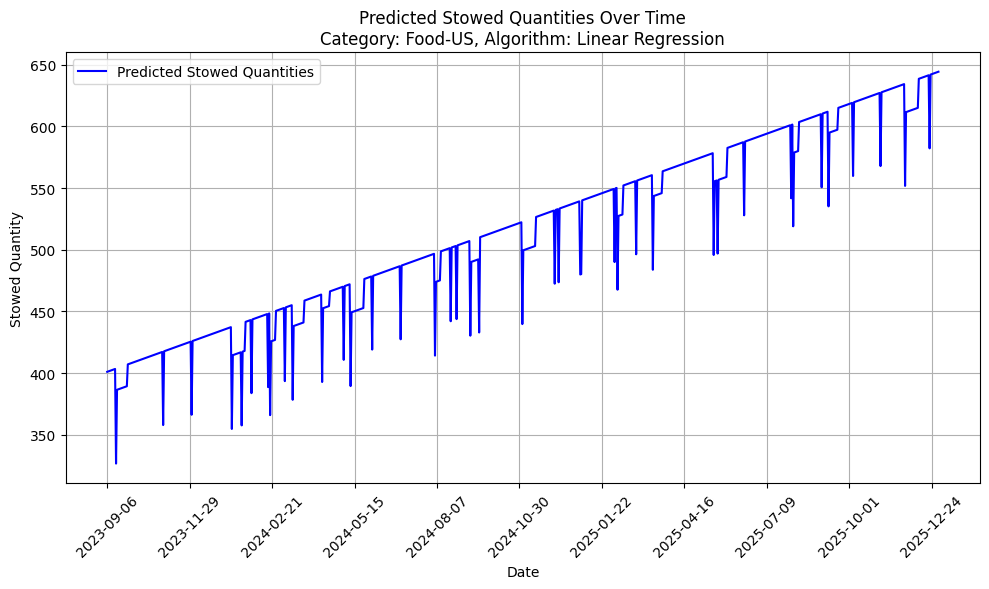

In [213]:
predicted_stowed_quantities = train_linear_regression_stowed(df_master_PT_Food_US, merged_df_Food_US_Pred_Stowed_Qty)
plot_predicted_stowed_quantities(merged_df_Food_US_Pred_Stowed_Qty, predicted_stowed_quantities,'Food-US','Linear Regression')

In above plot, Stowed Quantity is always going up. This is because Linear Regression is not performing well in the test data, with really high MSE.

In [214]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

def train_and_plot_stowed_quantities(df_train, df_predict, category_name, algorithm_name):
    # Convert stowed_historical to integer
    df_train['stowed_historical'] = df_train['stowed_historical'].round().astype(int)

    # Define features (X) and target variable (y) for training data
    X = df_train[['time', 'crew_count', 'event_encoded']]
    y = df_train['Storage Location_Stowed']

    # Split the training data into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Create linear regression model
    model = LinearRegression()

    # Train the model using the training set
    model.fit(X_train, y_train)

    # Predict values for training and test sets
    train_predictions = model.predict(X_train)
    test_predictions = model.predict(X_test)

    # Predict values for the external prediction data
    X_predict = df_predict[['time', 'crew_count', 'event_encoded']]
    predicted_values = model.predict(X_predict)
    df_predict['Predicted_Stowed_Qty'] = predicted_values

    # Combine data for plotting purposes
    df_train_results = pd.DataFrame({'Date': df_train.index, 'Actual': y, 'Predicted': list(train_predictions) + [None] * len(X_test)})
    df_test_results = pd.DataFrame({'Date': X_test.index, 'Actual': y_test, 'Predicted': test_predictions})

    # Plot the data
    plt.figure(figsize=(10, 6))
    plt.plot(df_train_results['Date'], df_train_results['Actual'], label='Actual - Training', color='green')
    plt.plot(df_train_results['Date'], df_train_results['Predicted'], label='Predicted - Training', linestyle='--', color='blue')
    plt.plot(df_test_results['Date'], df_test_results['Actual'], label='Actual - Testing', color='red')
    plt.plot(df_test_results['Date'], df_test_results['Predicted'], label='Predicted - Testing', linestyle='--', color='orange')
    plt.plot(df_predict.index, df_predict['Predicted_Stowed_Qty'], label='Prediction (New Data)', linestyle='-', color='purple')

    # Add vertical lines to distinguish between training, testing, and prediction segments
    plt.axvline(x=min(X_test.index), color='blue', linestyle=':', label='Start of Test Period')
    plt.axvline(x=max(X_test.index), color='blue', linestyle=':', label='End of Test Period')

    # Add chart labels
    plt.xlabel('Date')
    plt.ylabel('Stowed Quantity')
    plt.title(f'Predicted Stowed Quantities Over Time\nCategory: {category_name}, Algorithm: {algorithm_name}')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Example usage:
# train_and_plot_stowed_quantities(df_train, df_predict, "Food US", "Linear Regression")


In [215]:
#df_master_PT_Food_US.to_csv('/content/drive/My Drive/CS 6330 SpaceX Spring 2024/dt_master_PT_Food_US.csv')
#merged_df_Food_US_Pred_Stowed_Qty.to_csv('/content/drive/My Drive/CS 6330 SpaceX Spring 2024/merged_df_Food_US_Pred_Stowed_Qty.csv')

Function to perform multiple supervised learning algorthims. This function will be called for all the categories. Target in this function is Usage Rate_Stowed.

In [216]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.ensemble import AdaBoostRegressor, BaggingRegressor, RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor

# Define algorithms and their parameters, including line color
algorithms = [
    (LinearRegression(), 'Linear Regression', '-', 'blue'),
    (SVR(kernel='linear'), 'SVR', '--', 'orange'),
    (AdaBoostRegressor(n_estimators=50, random_state=42), 'AdaBoost', '-.', 'green'),
    (BaggingRegressor(n_estimators=50, random_state=42), 'Bagging', ':', 'red'),
    (KNeighborsRegressor(n_neighbors=5), 'KNN', '-', 'purple'),
    (RandomForestRegressor(n_estimators=50, random_state=42), 'Random Forest', '-.', 'brown')
]

def train_and_plot_algorithms_usage_stowed(df, category_name, algorithms):
    # Convert datedim_date to datetime object and then to string without timestamp
    df['datedim_date'] = pd.to_datetime(df['datedim_date']).dt.strftime('%Y-%m-%d')

    # Convert stowed_historical to integer
    df['stowed_historical'] = df['stowed_historical'].round().astype(int)

    # Define features (X) and target variable (y)
    X = df[['time', 'crew_count', 'event_encoded']]
    y = df['usage_rate_stowed']

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Create subplots
    fig, axs = plt.subplots(2, 3, figsize=(15, 10))

    for ax, (model, name, style, color) in zip(axs.flatten(), algorithms):
        # Train the model
        model.fit(X_train, y_train)

        # Predict target variable for test set
        y_pred = model.predict(X_test)

        # Calculate Mean Squared Error
        mse = mean_squared_error(y_test, y_pred)

        # Predict target variable using the trained model
        predicted_values = model.predict(X)

        # Combine all stowed quantities to find the min and max
        stowed_values = pd.concat([df['usage_rate_stowed'], df['hist_usage'], pd.Series(predicted_values)], axis=0)

        # Plot the predicted values with MSE in legend
        ax.plot(df.index, predicted_values, label=f'{name} (MSE: {mse:.2f})', linestyle=style, color=color)

        # Plot the actual values
        ax.plot(df.index, df['usage_rate_stowed'], label='Actual Usage Rate Stowed', color='black', linestyle='-')

        # Plot the historical values
        ax.plot(df.index, df['hist_usage'], label='Historical Usage Rate', color='gray', linestyle='--')

        # Plot formatting
        ax.grid(True)
        ax.legend(loc='lower right')
        ax.set_title(name)
        ax.set_xlabel('Date')
        ax.set_ylabel('Usage Quantity')  # Update y-axis label

        # Set x-axis tick labels as dates
        ax.set_xticks(df.index[::len(df.index)//5])
        ax.set_xticklabels(df['datedim_date'][::len(df.index)//5], rotation=45)

        # Set y-axis tick labels based on the range of stowed quantities
        stowed_min = stowed_values.min()
        stowed_max = stowed_values.max()
        yticks = range(int(stowed_min), int(stowed_max)+1)
        if len(yticks) > 6:
            step = len(yticks) // 5
            yticks = yticks[::step]
        ax.set_yticks(yticks)

    # Add labels and category name in the main title
    fig.suptitle(f'Actual vs Predicted Stowed Storage ({category_name})', fontsize=16)

    plt.tight_layout()
    plt.show()


In [217]:
df_master_PT_Food_US

,datedim_date,Launch_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,resupplied_with_flight,usage_rate_stowed,days_difference,crew_count,usage_rate_per_crew_per_day,hist_usage,vehicle_name,event,burn_rate,calculated_burn_rate,Item Used,stowed_historical,time,event_encoded
0,2022-10-20,0,227,20,128,0.0,0.0,1.0,7,0.000000,0.189,,,0.189,0.000000,0,128,0.0,0
1,2022-10-21,0,227,20,129,0.0,0.0,1.0,7,0.000000,0.189,,,0.378,0.000000,0,128,1.0,0
2,2022-10-22,0,227,20,129,0.0,0.0,1.0,7,0.000000,0.189,,,0.567,0.000000,0,127,2.0,0
3,2022-10-23,0,227,20,129,0.0,0.0,1.0,7,0.000000,0.189,,,0.756,0.000000,0,127,3.0,0
4,2022-10-24,0,228,20,128,0.0,1.0,1.0,7,0.142857,0.189,,,0.945,1.000000,1,127,4.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,2023-09-01,0,177,29,459,0.0,1.0,1.0,11,0.090909,0.297,,,61.533,379.128788,1,760,316.0,0
262,2023-09-02,0,182,29,455,0.0,4.0,1.0,11,0.363636,0.297,,,61.830,383.128788,1,760,317.0,0
263,2023-09-03,0,181,31,453,0.0,2.0,1.0,7,0.285714,0.189,,,62.019,385.128788,1,760,318.0,0
264,2023-09-04,0,181,31,453,0.0,0.0,1.0,7,0.000000,0.189,,,62.208,385.128788,0,760,319.0,0


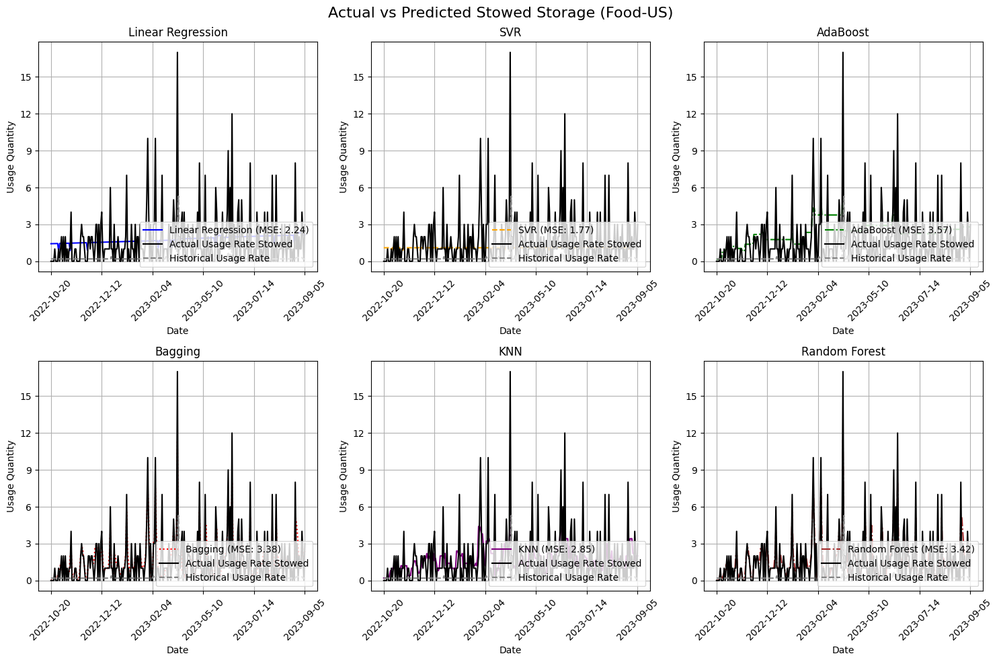

In [218]:
train_and_plot_algorithms_usage_stowed(df_master_PT_Food_US,'Food-US',algorithms)

From above we can see that SVR is best performing model for Food-US. It is based on calculated usage_qty.

### Prediction 60 days out using the model.

In [219]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

def train_svr_usage(df_train, df_predict):
    # Convert stowed_historical to integer
    df_train['stowed_historical'] = df_train['stowed_historical'].round().astype(int)

    # Define features (X) and target variable (y) for training data
    X = df_train[['time', 'crew_count', 'event_encoded']]
    y = df_train['usage_rate_stowed']

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Create SVR model
    model = SVR(kernel='linear')  # Use radial basis function kernel

    # Train the model
    model.fit(X_train, y_train)

    # Define features (X) for prediction data
    X_predict = df_predict[['time', 'crew_count', 'event_encoded']]

    # Predict target variable for the prediction data
    predicted_values = model.predict(X_predict)
    df_predict['Predicted_Usage_Qty'] = predicted_values
    return predicted_values

def plot_predicted_stowed_quantities_by_usage(df_predict, category_name, algorithm_name):
    # Convert datedim_date to datetime object and then to string without timestamp
    df_predict['datedim_date'] = pd.to_datetime(df_predict['datedim_date']).dt.strftime('%Y-%m-%d')

    # Plot the predicted values
    plt.figure(figsize=(10, 6))
    plt.plot(df_predict['datedim_date'], df_predict['Predicted_Stowed_Qty_by_Usage_Qty'], label='Predicted Stowed Quantities', color='blue')
    plt.plot(df_predict['datedim_date'], df_predict['stowed_historical'], label='Assumed Stowed Quantities', color='red')

    plt.xlabel('Date')
    plt.ylabel('Stowed Quantity')
    plt.title(f'Predicted Usage Quantities Over Time\nCategory: {category_name}, Algorithm: {algorithm_name}')

    # Set the frequency of x-axis ticks
    plt.xticks(df_predict['datedim_date'][::len(df_predict)//10], rotation=45)

    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

Below code predicts values based on the future dates and plots the Predicted Storage Quantity.

In [220]:
merged_df_Food_US

,index,datedim_date,crew_count,event,vehicle_name,event_encoded,days_difference,time,hist_usage,stowed_historical,resupply_quantity
0,613,2023-09-06,7,,NaN,0,1.0,321.0,0.189,759.811,0.0
1,614,2023-09-07,7,,NaN,0,1.0,322.0,0.189,759.622,0.0
2,615,2023-09-08,7,,NaN,0,1.0,323.0,0.189,759.433,0.0
3,616,2023-09-09,7,,NaN,0,1.0,324.0,0.189,759.244,0.0
4,617,2023-09-10,7,,NaN,0,1.0,325.0,0.189,759.055,0.0
...,...,...,...,...,...,...,...,...,...,...,...
843,1456,2025-12-27,7,,NaN,0,1.0,1164.0,0.189,585.526,0.0
844,1457,2025-12-28,7,,NaN,0,1.0,1165.0,0.189,585.337,0.0
845,1458,2025-12-29,7,,NaN,0,1.0,1166.0,0.189,585.148,0.0
846,1459,2025-12-30,7,,NaN,0,1.0,1167.0,0.189,584.959,0.0


In [221]:
df_master_PT_Food_US

,datedim_date,Launch_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,resupplied_with_flight,usage_rate_stowed,days_difference,crew_count,usage_rate_per_crew_per_day,hist_usage,vehicle_name,event,burn_rate,calculated_burn_rate,Item Used,stowed_historical,time,event_encoded
0,2022-10-20,0,227,20,128,0.0,0.0,1.0,7,0.000000,0.189,,,0.189,0.000000,0,128,0.0,0
1,2022-10-21,0,227,20,129,0.0,0.0,1.0,7,0.000000,0.189,,,0.378,0.000000,0,128,1.0,0
2,2022-10-22,0,227,20,129,0.0,0.0,1.0,7,0.000000,0.189,,,0.567,0.000000,0,127,2.0,0
3,2022-10-23,0,227,20,129,0.0,0.0,1.0,7,0.000000,0.189,,,0.756,0.000000,0,127,3.0,0
4,2022-10-24,0,228,20,128,0.0,1.0,1.0,7,0.142857,0.189,,,0.945,1.000000,1,127,4.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,2023-09-01,0,177,29,459,0.0,1.0,1.0,11,0.090909,0.297,,,61.533,379.128788,1,760,316.0,0
262,2023-09-02,0,182,29,455,0.0,4.0,1.0,11,0.363636,0.297,,,61.830,383.128788,1,760,317.0,0
263,2023-09-03,0,181,31,453,0.0,2.0,1.0,7,0.285714,0.189,,,62.019,385.128788,1,760,318.0,0
264,2023-09-04,0,181,31,453,0.0,0.0,1.0,7,0.000000,0.189,,,62.208,385.128788,0,760,319.0,0


In [222]:
merged_df_Food_US_COPY

,datedim_date,crew_count,event,vehicle_name,event_encoded,days_difference,time,hist_usage
0,2022-01-01,7,NaN,NaN,0,1.0,0.0,0.189
1,2022-01-02,7,NaN,NaN,0,1.0,1.0,0.189
2,2022-01-03,7,NaN,NaN,0,1.0,2.0,0.189
3,2022-01-04,7,NaN,NaN,0,1.0,3.0,0.189
4,2022-01-05,7,NaN,NaN,0,1.0,4.0,0.189
...,...,...,...,...,...,...,...,...
1456,2025-12-27,7,NaN,NaN,0,1.0,1456.0,0.189
1457,2025-12-28,7,NaN,NaN,0,1.0,1457.0,0.189
1458,2025-12-29,7,NaN,NaN,0,1.0,1458.0,0.189
1459,2025-12-30,7,NaN,NaN,0,1.0,1459.0,0.189


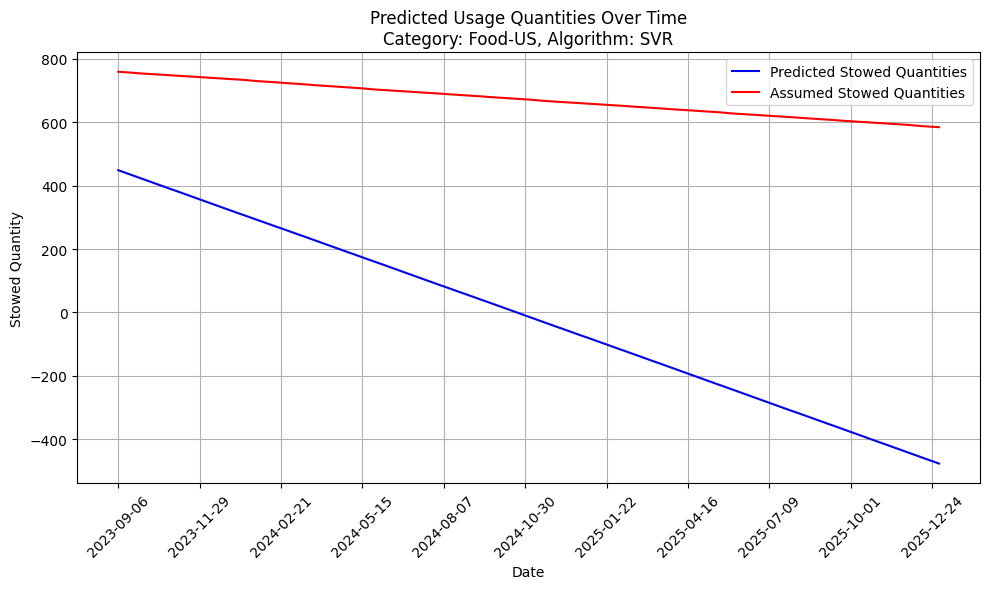

In [223]:
predicted_usage_quantities = train_svr_usage(df_master_PT_Food_US, merged_df_Food_US_Pred_Usage_Qty)
last_row = df_master_PT_Food_US.iloc[-1]
storage_location_stowed = last_row['Storage Location_Stowed']

merged_df_Food_US_Pred_Usage_Qty['Predicted_Stowed_Qty_by_Usage_Qty']=storage_location_stowed-merged_df_Food_US_Pred_Usage_Qty['Predicted_Usage_Qty'].cumsum()
plot_predicted_stowed_quantities_by_usage(merged_df_Food_US_Pred_Usage_Qty,'Food-US','SVR')

From graph above, we can not that Food-US will go below threshhold on around 2024-08-07 , using SVR algorithm.

### Supervised Learning for Food -RS( Linear Regression, SVR, AdaBoost, Bagging ,KNN and Ranfom Forest)

In [224]:
df_master_PT_FOOD_RS

,datedim_date,Launch_Stowed,Storage Location_Discard,Storage Location_Installed,Storage Location_Stowed,resupplied_with_flight,usage_rate_stowed,days_difference,crew_count,usage_rate_per_crew_per_day,hist_usage,vehicle_name,event,burn_rate,calculated_burn_rate,Item Used,stowed_historical,time,event_encoded
0,2022-10-20,50,93,36,22,0.0,0.0,1.0,7,0.000000,1.4,,,1.4,0.000000,0,20.6,0.0,0
1,2022-10-21,50,93,36,22,0.0,0.0,1.0,7,0.000000,1.4,,,2.8,0.000000,0,19.2,1.0,0
2,2022-10-22,50,93,36,22,0.0,0.0,1.0,7,0.000000,1.4,,,4.2,0.000000,0,17.8,2.0,0
3,2022-10-23,50,93,36,22,0.0,0.0,1.0,7,0.000000,1.4,,,5.6,0.000000,0,16.4,3.0,0
4,2022-10-24,50,101,28,22,0.0,0.0,1.0,7,0.000000,1.4,,,7.0,0.000000,0,15.0,4.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,2023-09-01,0,17,34,87,0.0,0.0,1.0,11,0.000000,2.2,,,455.8,126.247835,0,-215.8,316.0,0
262,2023-09-02,11,23,32,87,0.0,0.0,1.0,11,0.000000,2.2,,,458.0,126.247835,0,-218.0,317.0,0
263,2023-09-03,11,19,33,86,0.0,1.0,1.0,7,0.142857,1.4,,,459.4,127.247835,1,-219.4,318.0,0
264,2023-09-04,11,19,33,86,0.0,0.0,1.0,7,0.000000,1.4,,,460.8,127.247835,0,-220.8,319.0,0


MSE for Stowed Historical for Food-RS using Linear Regression : 32994.01691122422
MSE for Stowed Historical for Food-RS using SVR : 32873.828847854784
MSE for Stowed Historical for Food-RS using AdaBoost : 33238.12020171352
MSE for Stowed Historical for Food-RS using Bagging : 32845.19335639098
MSE for Stowed Historical for Food-RS using KNN : 32767.92466165414
MSE for Stowed Historical for Food-RS using Random Forest : 32845.687138345864


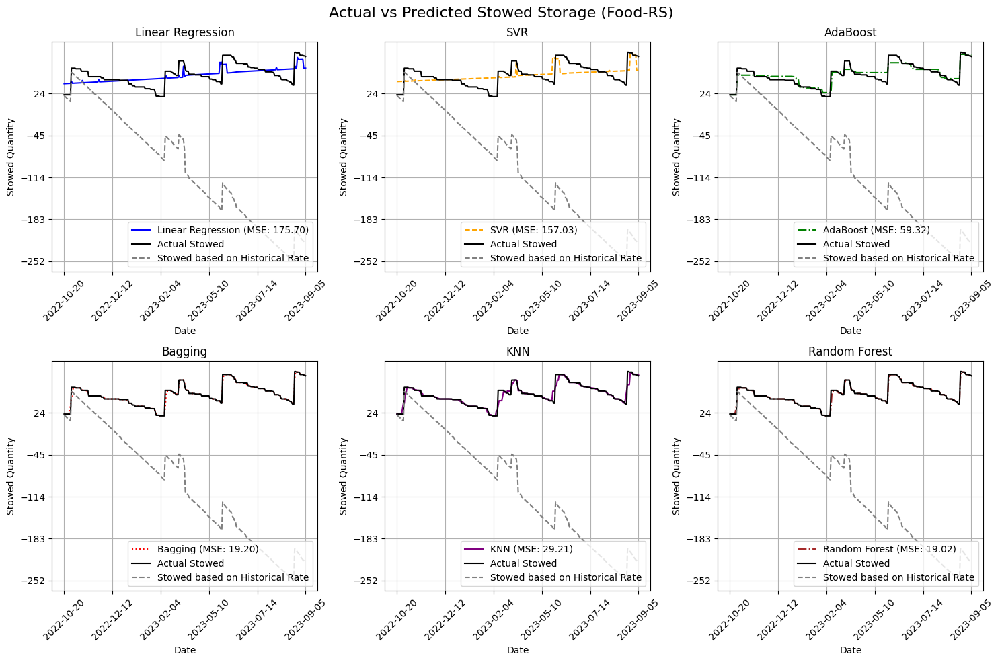

In [225]:
train_and_plot_algorithms(df_master_PT_FOOD_RS,'Food-RS',algorithms)

From above, we can note that historical usage quantity is way lower than actual stowed usage quantity. It is because historical rate is way higher for Food-RS, then calculated usage rate and with resupply added each time, the graph is going up, and down again. Linear regression, SVR and AdaBoost has really high MSE. Bagging, KNN and Random forest has low MSE incomparison. But looking at the graph, those algorithm seems to be overfitting.

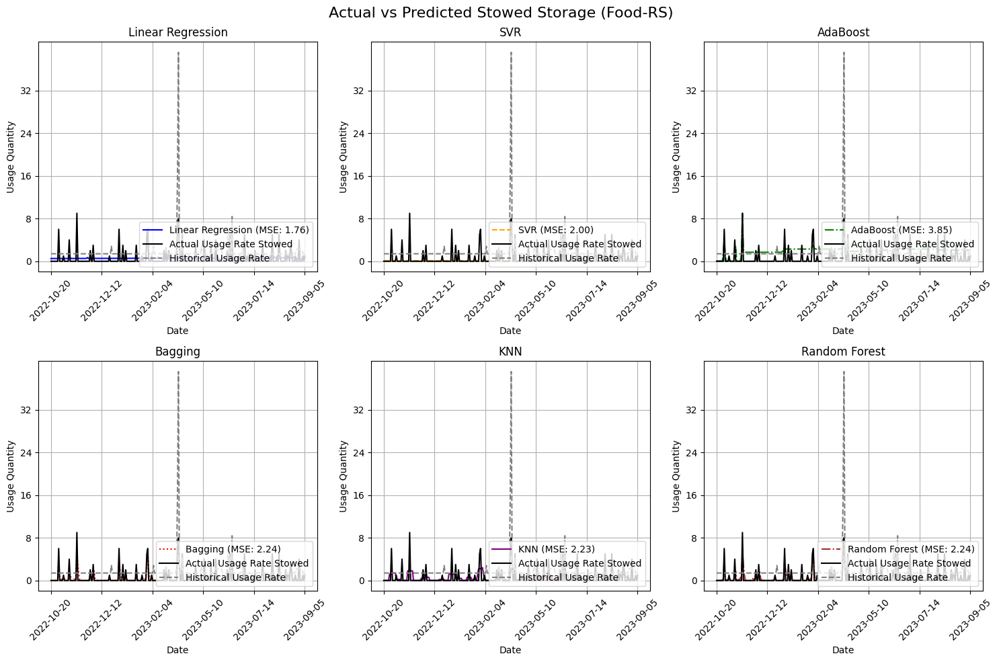

In [226]:
train_and_plot_algorithms_usage_stowed(df_master_PT_FOOD_RS,'Food-RS',algorithms)

From above we can see that Linear Regression is best performing model for Food-RS. It is based on calculated usage_qty.

In [227]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

def train_linear_regression_usage(df_train, df_predict):
    # Convert stowed_historical to integer
    df_train['stowed_historical'] = df_train['stowed_historical'].round().astype(int)

    # Define features (X) and target variable (y) for training data
    X = df_train[['time', 'crew_count', 'event_encoded']]
    y = df_train['usage_rate_stowed']

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Create Linear Regression model
    model = LinearRegression()

    # Train the model
    model.fit(X_train, y_train)

    # Define features (X) for prediction data
    X_predict = df_predict[['time', 'crew_count', 'event_encoded']]

    # Predict target variable for the prediction data
    predicted_values = model.predict(X_predict)
    df_predict['Predicted_Usage_Qty'] = predicted_values
    return predicted_values


In [228]:
merged_df_Food_RS_Pred_Usage_Qty=merged_df_Food_RS.copy()
merged_df_Food_RS_Pred_Stowed_Qty=merged_df_Food_RS.copy()

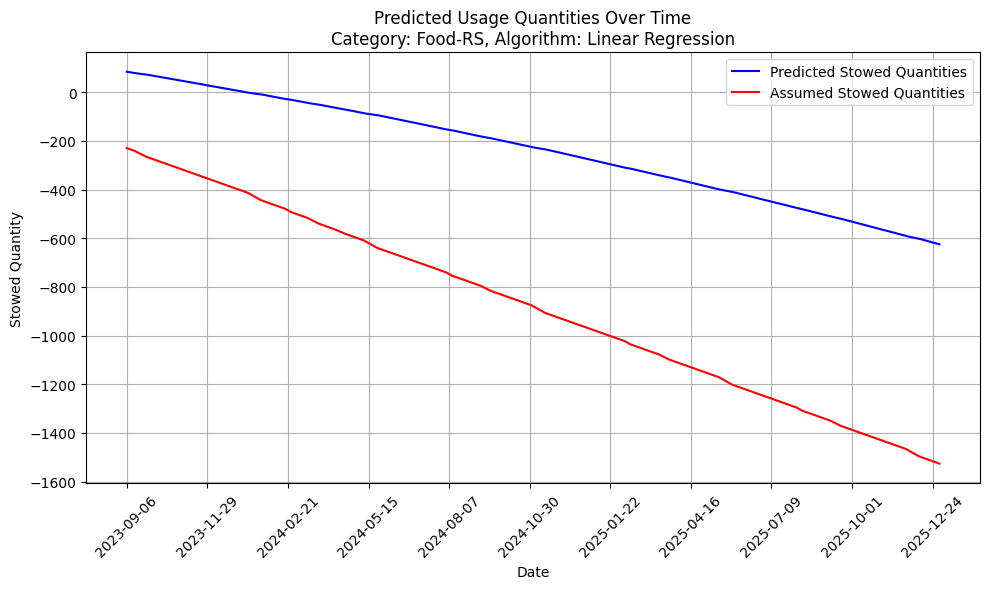

In [229]:
predicted_usage_quantities = train_linear_regression_usage(df_master_PT_FOOD_RS, merged_df_Food_RS_Pred_Usage_Qty)
last_row = df_master_PT_FOOD_RS.iloc[-1]
storage_location_stowed = last_row['Storage Location_Stowed']

merged_df_Food_RS_Pred_Usage_Qty['Predicted_Stowed_Qty_by_Usage_Qty']=storage_location_stowed-merged_df_Food_RS_Pred_Usage_Qty['Predicted_Usage_Qty'].cumsum()
plot_predicted_stowed_quantities_by_usage(merged_df_Food_RS_Pred_Usage_Qty,'Food-RS','Linear Regression')

From above graph, based on Prediction, Food-RS will be below threshhold within 60 days

### Supervised Learning for ACY Inserts( Linear Regression, SVR, AdaBoost, Bagging ,KNN and Ranfom Forest)

MSE for Stowed Historical for ACY Inserts using Linear Regression : 288.42829232485167
MSE for Stowed Historical for ACY Inserts using SVR : 273.7700608470343
MSE for Stowed Historical for ACY Inserts using AdaBoost : 302.60519565445384
MSE for Stowed Historical for ACY Inserts using Bagging : 298.0820786764706
MSE for Stowed Historical for ACY Inserts using KNN : 297.62750000000005
MSE for Stowed Historical for ACY Inserts using Random Forest : 298.1346382352942


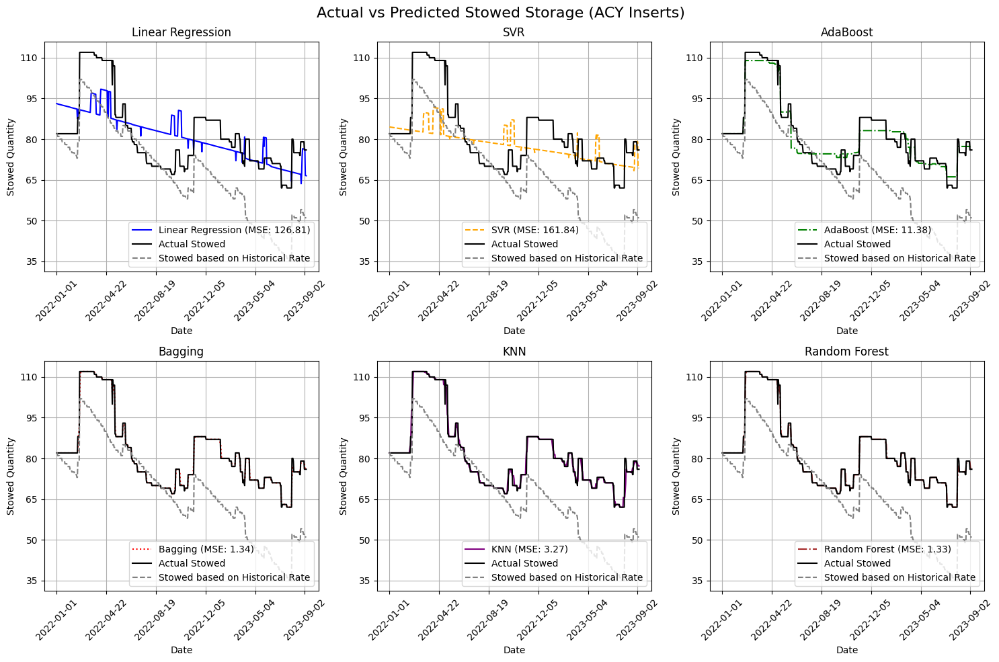

In [230]:
train_and_plot_algorithms(df_master_PT_ACY_MOD,'ACY Inserts',algorithms)

From above, we can note that historical usage quantity is somewhat inline actual stowed usage quantity. . Linear regression, SVR and AdaBoost has really high MSE. Bagging, KNN and Random forest has low MSE incomparison. But looking at the graph, those algorithm seems to be overfitting

In [231]:
merged_df_ACY_Pred_Usage_Qty=merged_df_ACY.copy()
merged_df_ACY_Pred_Stowed_Qty=merged_df_ACY.copy()


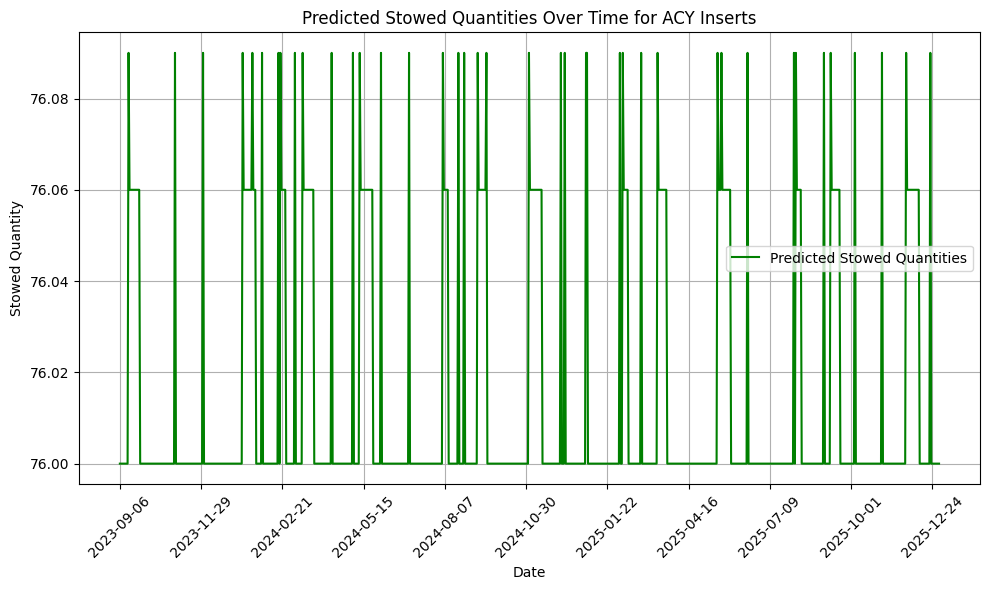

In [232]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor

def train_random_forest_stowed(df_train, df_predict):
    # Convert stowed_historical to integer
    df_train['stowed_historical'] = df_train['stowed_historical'].round().astype(int)

    # Define features (X) and target variable (y) for training data
    X_train = df_train[['time', 'crew_count', 'event_encoded']]
    y_train = df_train['Storage Location_Stowed']

    # Create Random Forest regressor model
    model = RandomForestRegressor(n_estimators=100, random_state=42)
    # Train the model
    model.fit(X_train, y_train)

    # Define features (X) for prediction data
    X_predict = df_predict[['time', 'crew_count', 'event_encoded']]

    # Predict target variable for the prediction data
    predicted_values = model.predict(X_predict)

    return predicted_values

def plot_predicted_stowed_quantities(df_predict, predicted_values):
    # Convert datedim_date to datetime object and then to string without timestamp
    df_predict['datedim_date'] = pd.to_datetime(df_predict['datedim_date']).dt.strftime('%Y-%m-%d')

    # Plot the predicted values
    plt.figure(figsize=(10, 6))
    plt.plot(df_predict['datedim_date'], predicted_values, label='Predicted Stowed Quantities', color='green')
    plt.xlabel('Date')
    plt.ylabel('Stowed Quantity')
    plt.title('Predicted Stowed Quantities Over Time for ACY Inserts')

    # Set the frequency of x-axis ticks
    plt.xticks(df_predict['datedim_date'][::len(df_predict)//10], rotation=45)

    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

predicted_stowed_quantities_rf = train_random_forest_stowed(df_master_PT_ACY_MOD, merged_df_ACY_Pred_Stowed_Qty)
plot_predicted_stowed_quantities(merged_df_ACY_Pred_Stowed_Qty, predicted_stowed_quantities_rf)


We can see from the above graph that Random Forest is overfitted, as it is not performing well in prediction data.

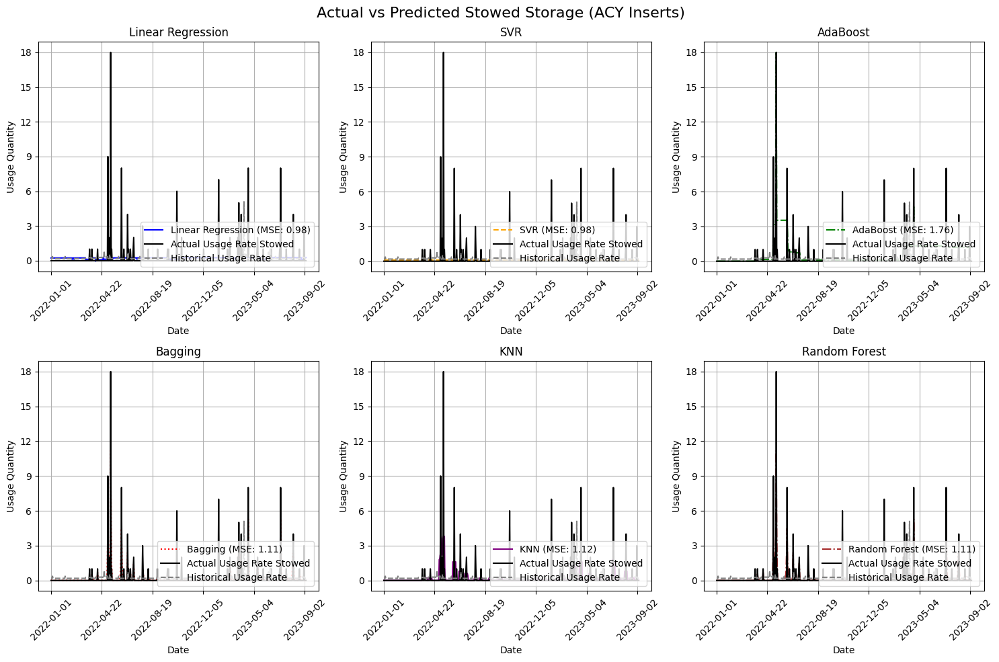

In [233]:
train_and_plot_algorithms_usage_stowed(df_master_PT_ACY_MOD,'ACY Inserts',algorithms)

From above we can see that Linear Regression is best performing model for ACY Inserts. It is based on calculated usage_qty.

In [234]:
merged_df_ACY_Pred_Usage_Qty

,index,datedim_date,crew_count,event,vehicle_name,event_encoded,days_difference,time,hist_usage,stowed_historical,resupply_quantity
0,613,2023-09-06,7,,NaN,0,1.0,613.0,0.182,50.818,0.000
1,614,2023-09-07,7,,NaN,0,1.0,614.0,0.182,50.636,0.000
2,615,2023-09-08,7,,NaN,0,1.0,615.0,0.182,50.454,0.000
3,616,2023-09-09,7,,NaN,0,1.0,616.0,0.182,50.272,0.000
4,617,2023-09-10,7,,NaN,0,1.0,617.0,0.182,50.090,0.000
...,...,...,...,...,...,...,...,...,...,...,...
843,1456,2025-12-27,7,,NaN,0,1.0,1456.0,0.182,-117.012,133.012
844,1457,2025-12-28,7,,NaN,0,1.0,1457.0,0.182,-117.194,133.194
845,1458,2025-12-29,7,,NaN,0,1.0,1458.0,0.182,-117.376,133.376
846,1459,2025-12-30,7,,NaN,0,1.0,1459.0,0.182,-117.558,133.558


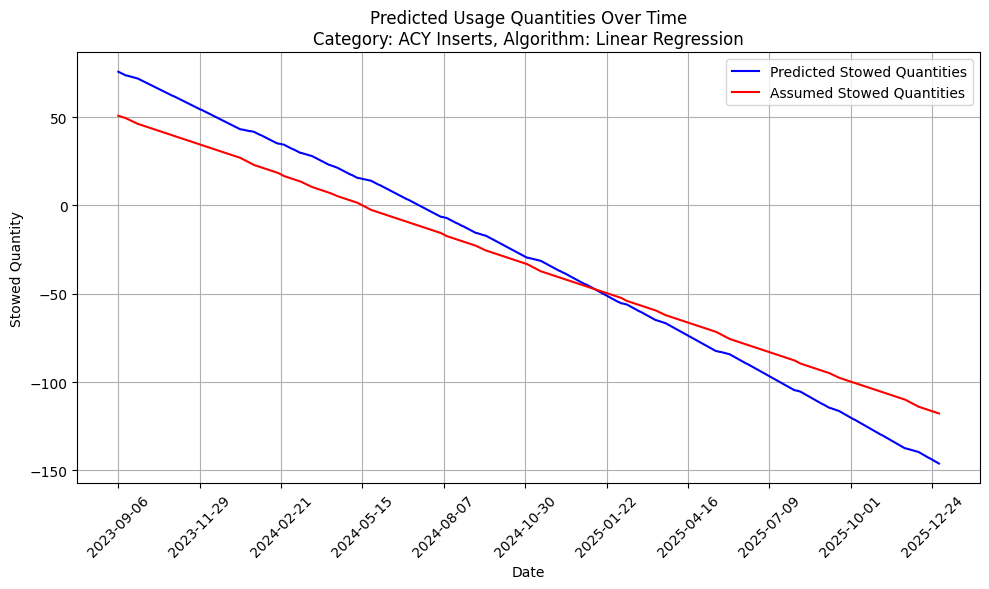

In [235]:
predicted_usage_quantities = train_linear_regression_usage(df_master_PT_ACY_MOD, merged_df_ACY_Pred_Usage_Qty)
last_row = df_master_PT_ACY_MOD.iloc[-1]
storage_location_stowed = last_row['Storage Location_Stowed']
merged_df_ACY_Pred_Usage_Qty['Predicted_Stowed_Qty_by_Usage_Qty']=storage_location_stowed-merged_df_ACY_Pred_Usage_Qty['Predicted_Usage_Qty'].cumsum()
plot_predicted_stowed_quantities_by_usage(merged_df_ACY_Pred_Usage_Qty,'ACY Inserts','Linear Regression')

From above , ACY inserts will be above threshhold within next 60 days.

### Supervised Learning for Filter Inserts( Linear Regression, SVR, AdaBoost, Bagging ,KNN and Ranfom Forest)

MSE for Stowed Historical for Filter Inserts using Linear Regression : 26.108248205666232
MSE for Stowed Historical for Filter Inserts using SVR : 28.07682435963495
MSE for Stowed Historical for Filter Inserts using AdaBoost : 22.262948447965076
MSE for Stowed Historical for Filter Inserts using Bagging : 21.250835294117646
MSE for Stowed Historical for Filter Inserts using KNN : 21.55433823529412
MSE for Stowed Historical for Filter Inserts using Random Forest : 21.253225


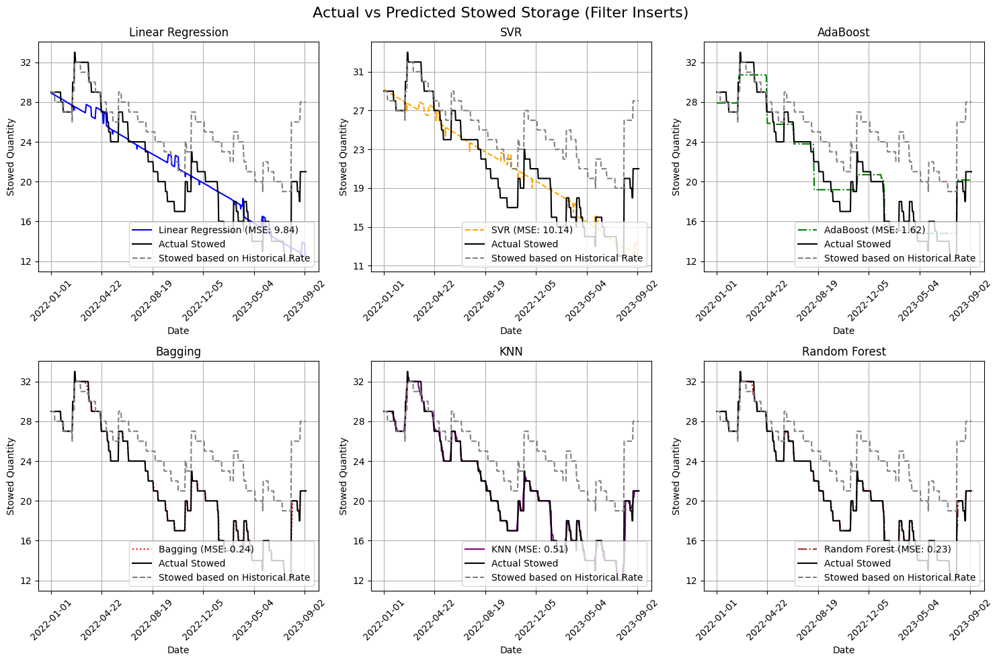

In [236]:
train_and_plot_algorithms(df_master_PT_FI,'Filter Inserts',algorithms)

From above, we can note that historical usage quantity is somewhat inline actual stowed usage quantity. . Linear regression, SVR and AdaBoost has really high MSE. Bagging, KNN and Random forest has low MSE incomparison. But looking at the graph, those algorithm seems to be overfitting

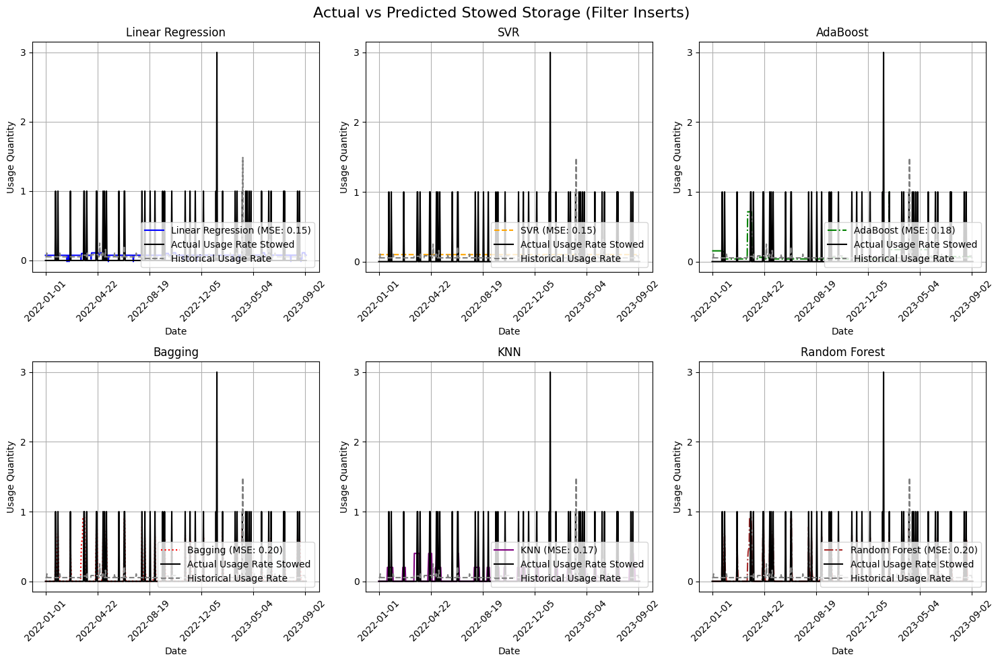

In [237]:
train_and_plot_algorithms_usage_stowed(df_master_PT_FI,'Filter Inserts',algorithms)


Training and plotting based on calculated usage qty.

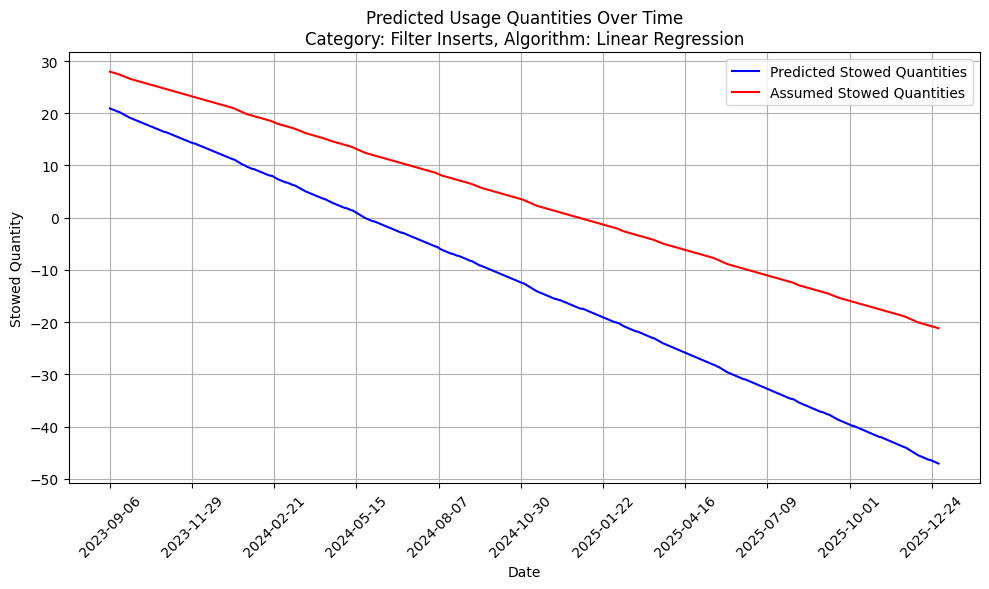

In [238]:
merged_df_FI_Pred_Usage_Qty=merged_df_FI.copy()
merged_df_FI_Pred_Stowed_Qty=merged_df_FI.copy()

predicted_usage_quantities = train_linear_regression_usage(df_master_PT_FI, merged_df_FI_Pred_Usage_Qty)
last_row = df_master_PT_FI.iloc[-1]
storage_location_stowed = last_row['Storage Location_Stowed']
merged_df_FI_Pred_Usage_Qty['Predicted_Stowed_Qty_by_Usage_Qty']=storage_location_stowed-merged_df_FI_Pred_Usage_Qty['Predicted_Usage_Qty'].cumsum()
plot_predicted_stowed_quantities_by_usage(merged_df_FI_Pred_Usage_Qty,'Filter Inserts','Linear Regression')

Based on above prediction, Filter Inserts will be above threshhold in next 60 days.

### Supervised Learning for EDV( Linear Regression, SVR, AdaBoost, Bagging ,KNN and Ranfom Forest)

MSE for Stowed Historical for EDV using Linear Regression : 148.86880029416037
MSE for Stowed Historical for EDV using SVR : 148.37909142335897
MSE for Stowed Historical for EDV using AdaBoost : 146.2963341874413
MSE for Stowed Historical for EDV using Bagging : 147.83935955882353
MSE for Stowed Historical for EDV using KNN : 147.81470588235294
MSE for Stowed Historical for EDV using Random Forest : 147.8272117647059


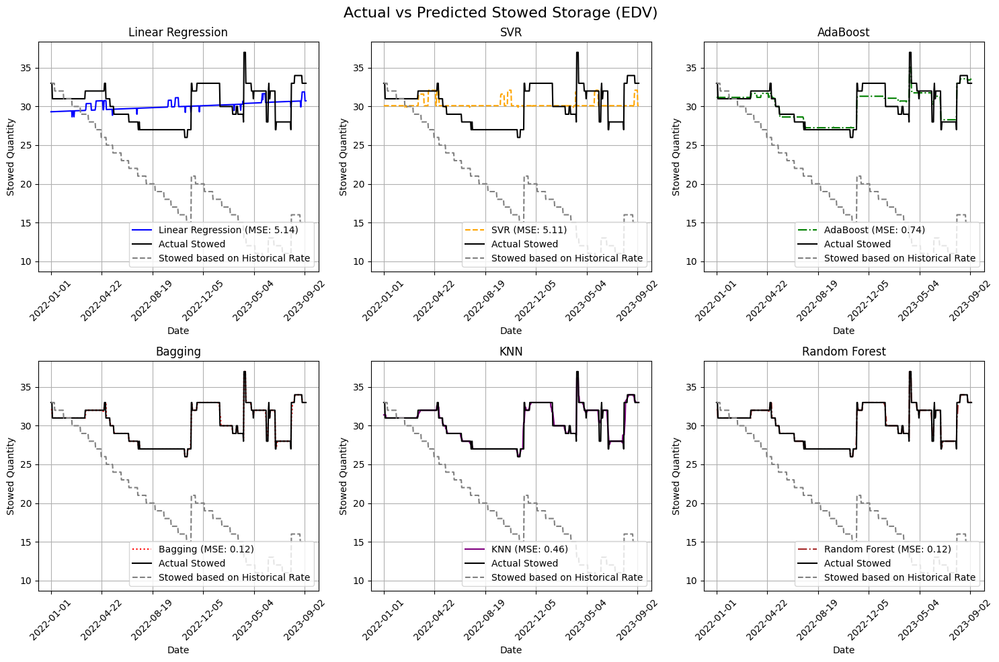

In [239]:
train_and_plot_algorithms(df_master_PT_EDV,'EDV',algorithms)

From above, we can note that historical usage quantity is somewhat inline actual stowed usage quantity. . Linear regression, SVR and AdaBoost has really high MSE. Bagging, KNN and Random forest has low MSE incomparison. But looking at the graph, those algorithm seems to be overfitting

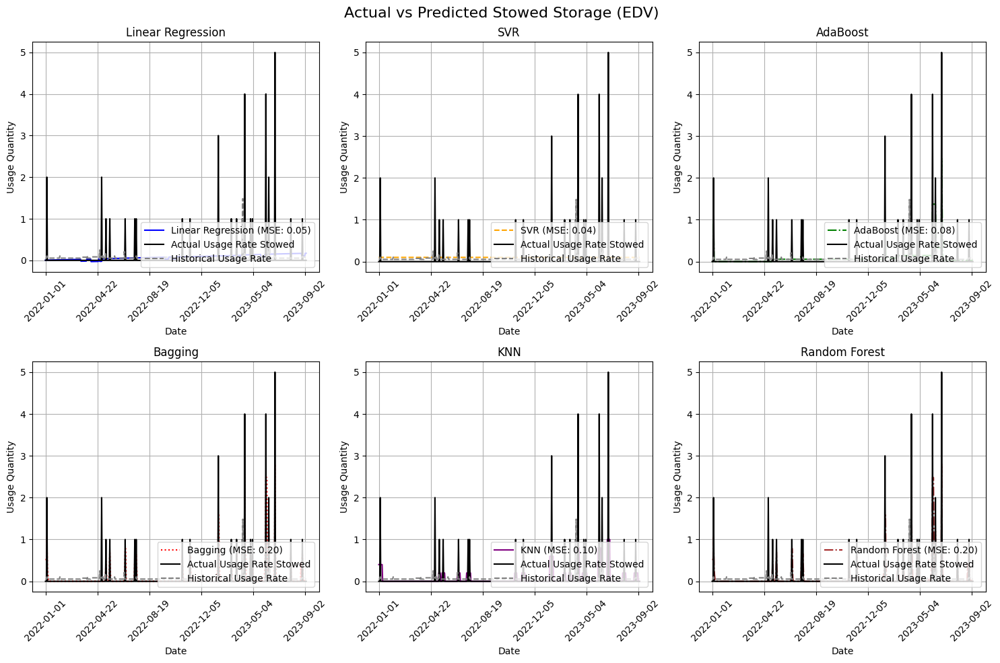

In [240]:
train_and_plot_algorithms_usage_stowed(df_master_PT_EDV,'EDV',algorithms)


From above we can see that Linear Regression is best performing model for EDV. It is based on calculated usage_qty.

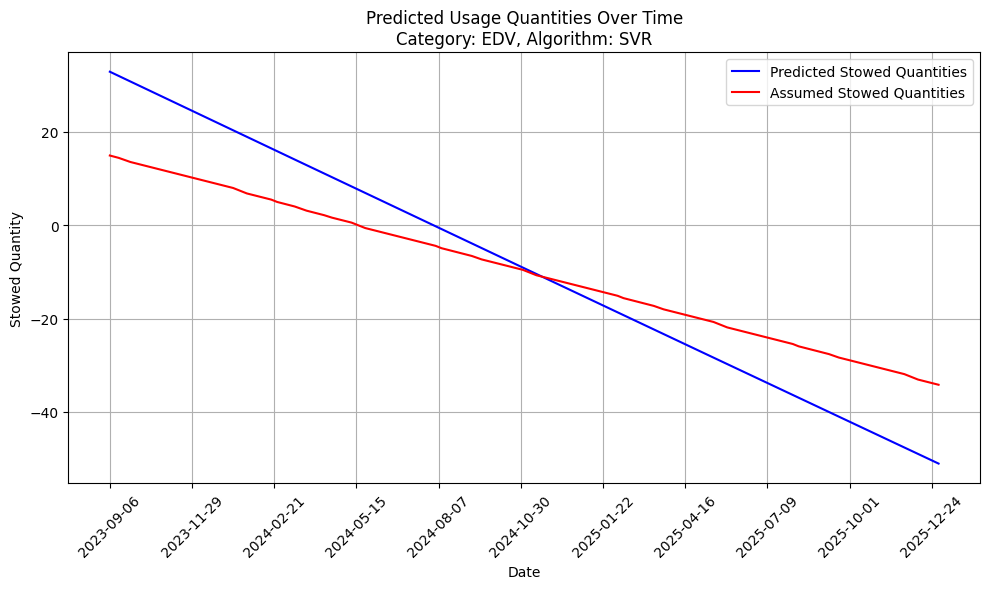

In [241]:
merged_df_EDV_Pred_Usage_Qty=merged_df_EDV.copy()
merged_df_EDV_Pred_Stowed_Qty=merged_df_EDV.copy()

predicted_usage_quantities = train_svr_usage(df_master_PT_EDV, merged_df_EDV_Pred_Usage_Qty)
last_row = df_master_PT_EDV.iloc[-1]
storage_location_stowed = last_row['Storage Location_Stowed']
merged_df_EDV_Pred_Usage_Qty['Predicted_Stowed_Qty_by_Usage_Qty']=storage_location_stowed-merged_df_EDV_Pred_Usage_Qty['Predicted_Usage_Qty'].cumsum()
plot_predicted_stowed_quantities_by_usage(merged_df_EDV_Pred_Usage_Qty,'EDV','SVR')

Based on above prediction, EDV will be below threshhold in next 60 days.

### Supervised Learning for KTO( Linear Regression, SVR, AdaBoost, Bagging ,KNN and Ranfom Forest)

MSE for Stowed Historical for KTO using Linear Regression : 3533.1223189189527
MSE for Stowed Historical for KTO using SVR : 3539.1521183474256
MSE for Stowed Historical for KTO using AdaBoost : 2677.373083727798
MSE for Stowed Historical for KTO using Bagging : 2756.5393330882353
MSE for Stowed Historical for KTO using KNN : 2779.889558823529
MSE for Stowed Historical for KTO using Random Forest : 2756.047681617647


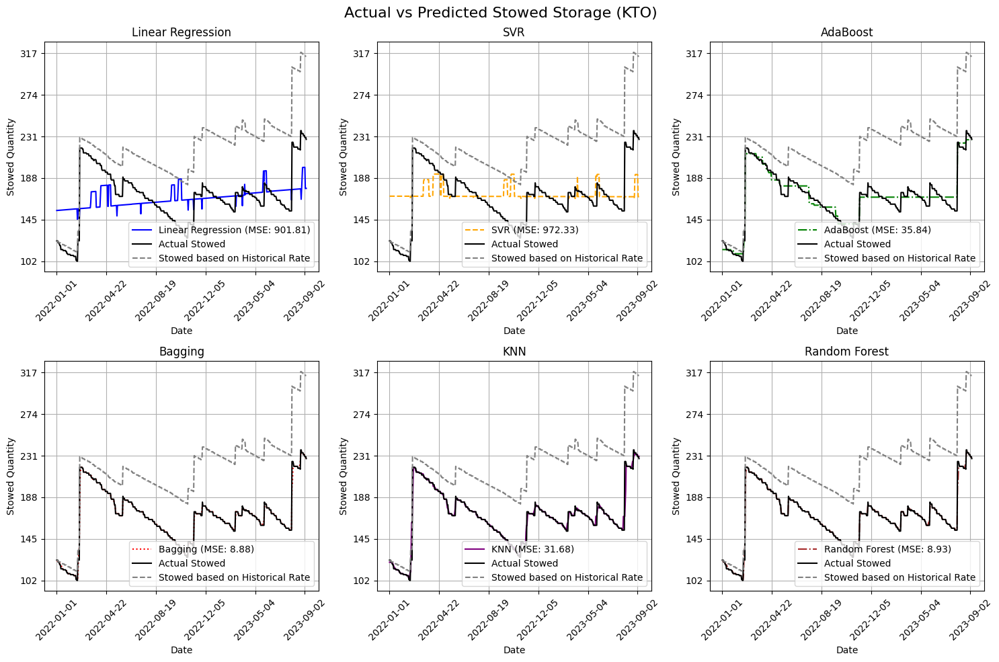

In [242]:
train_and_plot_algorithms(df_master_PT_KTO,'KTO',algorithms)

From above, we can note that historical usage quantity is somewhat inline actual stowed usage quantity. . Linear regression, SVR and AdaBoost has really high MSE. Bagging, KNN and Random forest has low MSE incomparison. But looking at the graph, those algorithm seems to be overfitting

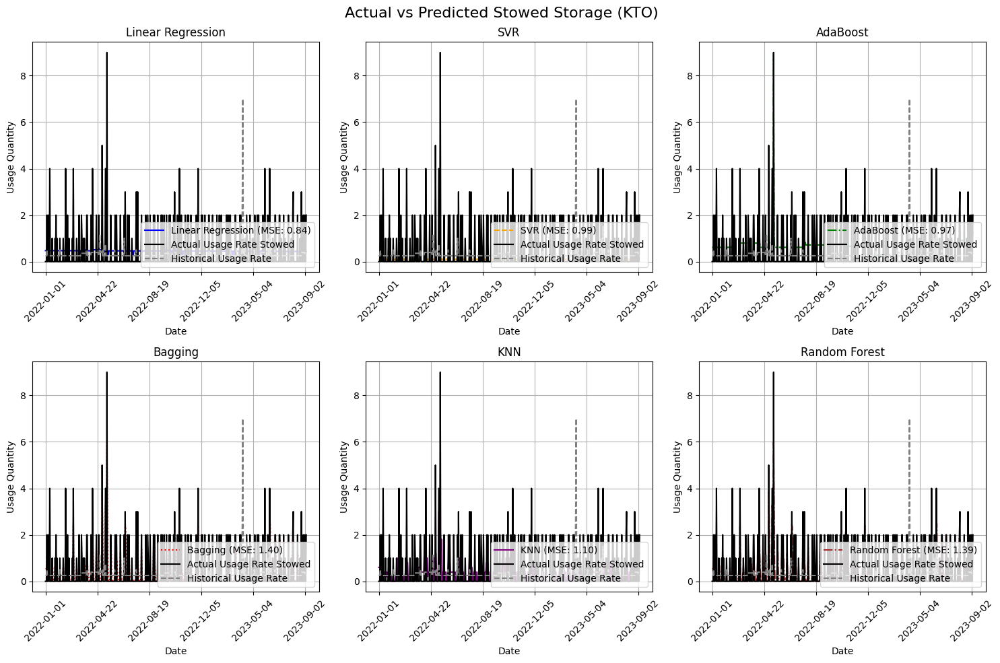

In [243]:
train_and_plot_algorithms_usage_stowed(df_master_PT_KTO,'KTO',algorithms)


From above we can see that Linear Regression is best performing model for KTO. It is based on calculated usage_qty.

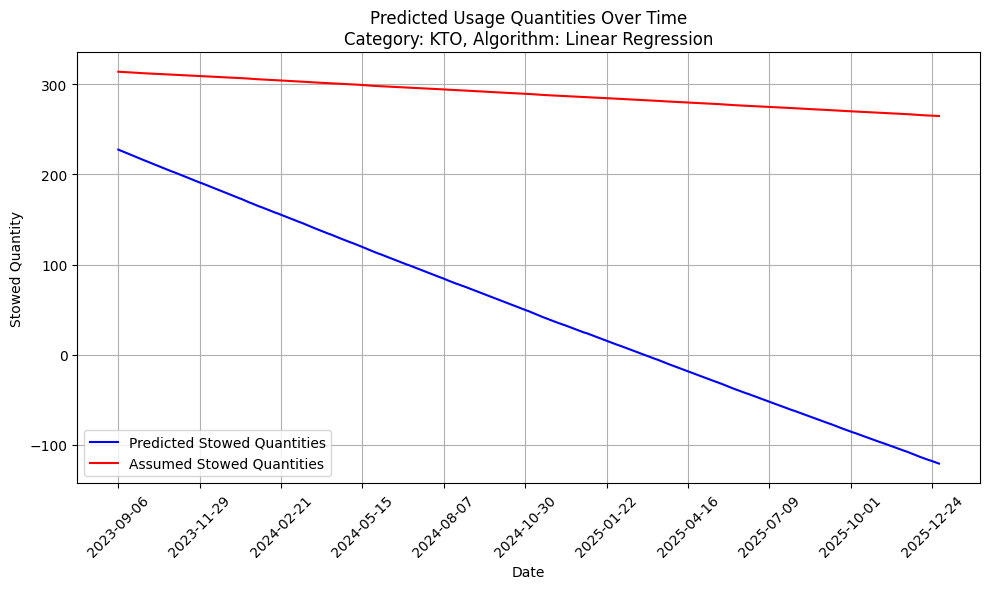

In [244]:
merged_df_KTO_Pred_Usage_Qty=merged_df_KTO.copy()
merged_df_KTO_Pred_Stowed_Qty=merged_df_KTO.copy()

predicted_usage_quantities = train_linear_regression_usage(df_master_PT_KTO, merged_df_KTO_Pred_Usage_Qty)
last_row = df_master_PT_KTO.iloc[-1]
storage_location_stowed = last_row['Storage Location_Stowed']
merged_df_KTO_Pred_Usage_Qty['Predicted_Stowed_Qty_by_Usage_Qty']=storage_location_stowed-merged_df_KTO_Pred_Usage_Qty['Predicted_Usage_Qty'].cumsum()
plot_predicted_stowed_quantities_by_usage(merged_df_KTO_Pred_Usage_Qty,'KTO','Linear Regression')

From above we can predict that KTO will be way above threshold for next 60 days.

## Unsupervised Learning

### K-means for ACY Inserts

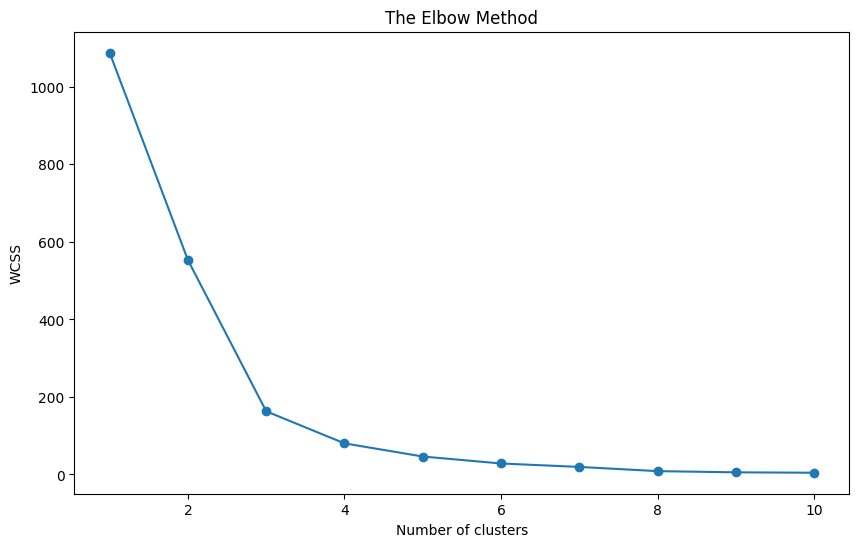

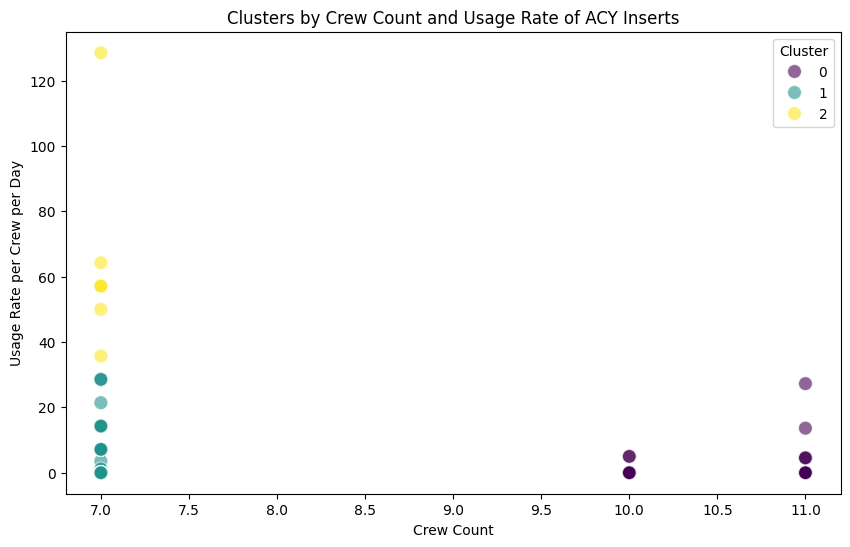

In [245]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns


# Focusing on 'crew_count' and 'usage_rate_per_crew_per_day'
df = df_master_PT_ACY[['crew_count', 'usage_rate_per_crew_per_day']].dropna()

# Scaling the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df)

# Determine the optimal number of clusters using the Elbow method
wcss = []
for i in range(1, 11):  # Test 1 to 10 clusters
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(df_scaled)
    wcss.append(kmeans.inertia_)

# Plotting the results onto a line graph to observe 'The Elbow'
plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), wcss, marker='o')
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')  # Within cluster sum of squares
plt.show()

# Applying K-means clustering with the optimal number of clusters
# Assuming the elbow point is found at 3 clusters from the plot
kmeans = KMeans(n_clusters=3, init='k-means++', random_state=42)
cluster_labels = kmeans.fit_predict(df_scaled)

# Adding cluster labels back to the original data
df['Cluster'] = cluster_labels

# Visualizing the clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x='crew_count', y='usage_rate_per_crew_per_day', hue='Cluster', data=df, palette='viridis', s=100, alpha=0.6)
plt.title('Clusters by Crew Count and Usage Rate of ACY Inserts')
plt.xlabel('Crew Count')
plt.ylabel('Usage Rate per Crew per Day')
plt.legend(title='Cluster')
plt.show()

The provided graphs depict a clustering analysis of ACY Inserts, illustrating the relationship between crew count and usage rate. The first graph, employing the Elbow Method, suggests that three clusters optimally represent the data, as indicated by the point where the decrease in within-cluster sum of squares levels off, supporting the cluster choices observed in the first graph. The second scatter plot identifies three clusters, showing variations in usage rates across different crew counts, with one cluster exhibiting higher crew counts and lower usage rates, another with lower crew counts and variable usage rates, and the third with the highest usage rates and crew counts.

### K-means for KTO

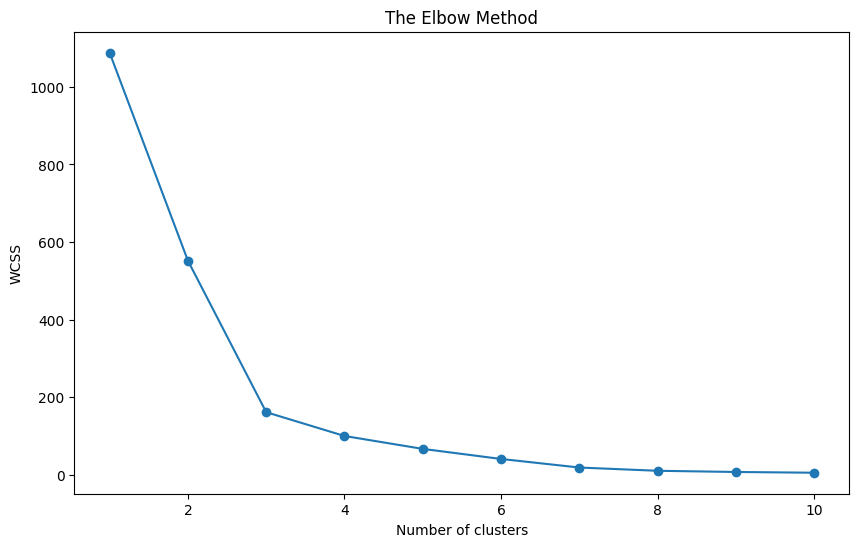

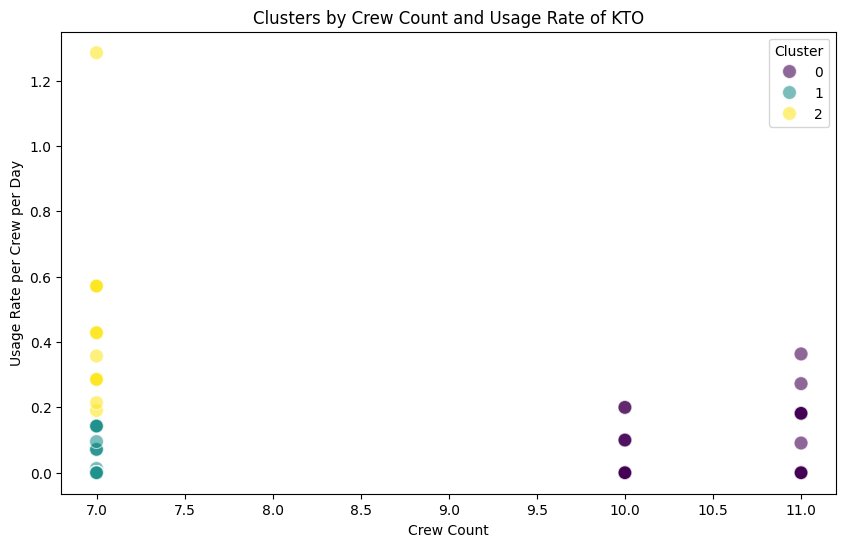

In [246]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns


# Focusing on 'crew_count' and 'usage_rate_per_crew_per_day'
df = df_master_PT_KTO[['crew_count', 'usage_rate_per_crew_per_day']].dropna()

# Scaling the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df)

# Determine the optimal number of clusters using the Elbow method
wcss = []
for i in range(1, 11):  # Test 1 to 10 clusters
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(df_scaled)
    wcss.append(kmeans.inertia_)

# Plotting the results onto a line graph to observe 'The Elbow'
plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), wcss, marker='o')
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')  # Within cluster sum of squares
plt.show()

# Applying K-means clustering with the optimal number of clusters
# Assuming the elbow point is found at 3 clusters from the plot
kmeans = KMeans(n_clusters=3, init='k-means++', random_state=42)
cluster_labels = kmeans.fit_predict(df_scaled)

# Adding cluster labels back to the original data
df['Cluster'] = cluster_labels

# Visualizing the clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x='crew_count', y='usage_rate_per_crew_per_day', hue='Cluster', data=df, palette='viridis', s=100, alpha=0.6)
plt.title('Clusters by Crew Count and Usage Rate of KTO')
plt.xlabel('Crew Count')
plt.ylabel('Usage Rate per Crew per Day')
plt.legend(title='Cluster')
plt.show()


The images illustrate two different analytical methods used in data clustering. The first image shows the Elbow Method graph, used to determine the optimal number of clusters for a dataset. It plots the Within-Cluster Sum of Squares (WCSS) against the number of clusters, indicating that the best choice seems to be around 3 clusters, as the drop in WCSS becomes less steep after this point. The second image displays a scatter plot of three distinct clusters based on crew count and usage rate of a specific variable (KTO), categorized by different colors representing each cluster. The plot shows that larger crew counts correlate with lower usage rates per crew member per day, suggesting varying consumption patterns or operational scales among the groups.

### K means for EDV

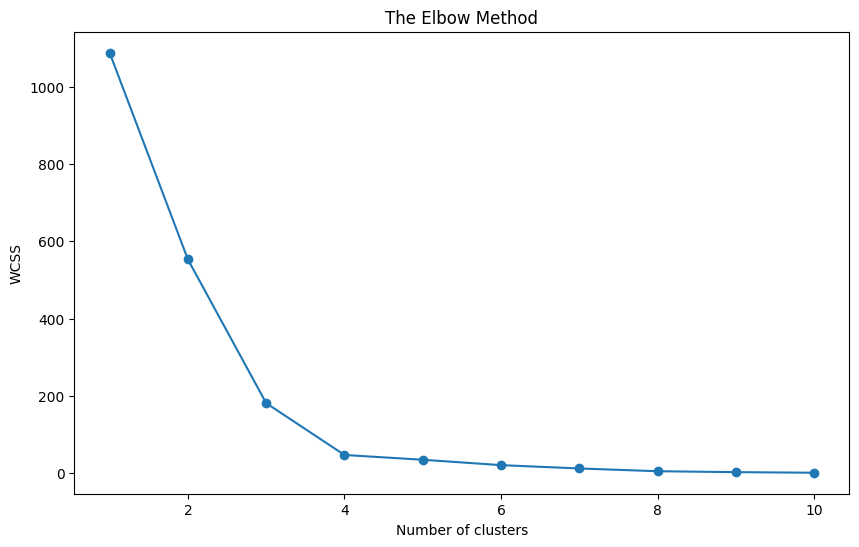

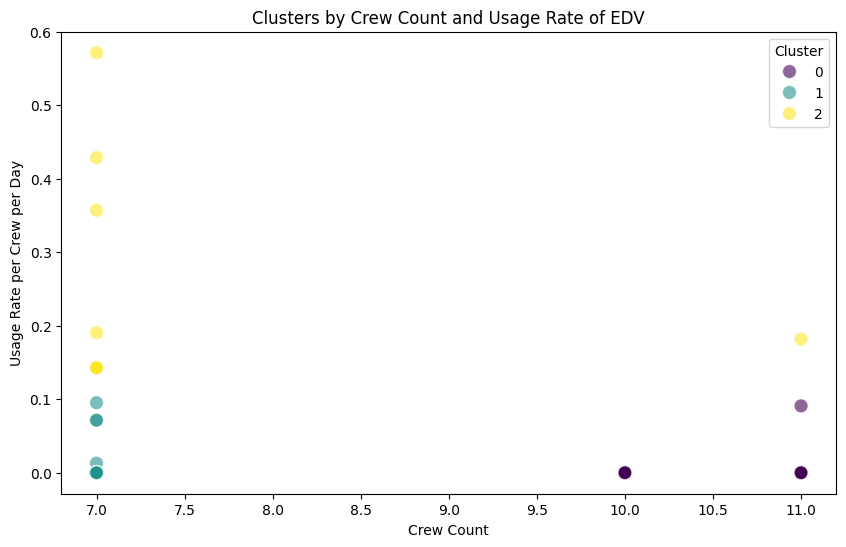

In [247]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns


# Focusing on 'crew_count' and 'usage_rate_per_crew_per_day'
df = df_master_PT_EDV[['crew_count', 'usage_rate_per_crew_per_day']].dropna()

# Scaling the data
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df)

# Determine the optimal number of clusters using the Elbow method
wcss = []
for i in range(1, 11):  # Test 1 to 10 clusters
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(df_scaled)
    wcss.append(kmeans.inertia_)

# Plotting the results onto a line graph to observe 'The Elbow'
plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), wcss, marker='o')
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')  # Within cluster sum of squares
plt.show()

# Applying K-means clustering with the optimal number of clusters
# Assuming the elbow point is found at 3 clusters from the plot
kmeans = KMeans(n_clusters=3, init='k-means++', random_state=42)
cluster_labels = kmeans.fit_predict(df_scaled)

# Adding cluster labels back to the original data
df['Cluster'] = cluster_labels

# Visualizing the clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x='crew_count', y='usage_rate_per_crew_per_day', hue='Cluster', data=df, palette='viridis', s=100, alpha=0.6)
plt.title('Clusters by Crew Count and Usage Rate of EDV')
plt.xlabel('Crew Count')
plt.ylabel('Usage Rate per Crew per Day')
plt.legend(title='Cluster')
plt.show()


The graphs presented continue to explore the clustering of operational data, focusing on crew count and specific consumable usage rates using the Elbow Method and scatter plots. The Elbow Method graph identifies three optimal clusters, characterized by the elbow point where further increase in clusters does not significantly reduce within-cluster variance. The second graph maps crew counts against the usage rate of the consumable "EDV," distinguishing three clusters with varying crew sizes and consumption rates: one with the lowest crew and consumption rates, another with moderate values, and a third indicating higher crew counts with significantly increased usage rates. These analyses assist in understanding resource allocation efficiency across different crew configurations.

# Updates after Progress Rpt 4

In [248]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_consumables_analysis_weekly(df, threshold, category):
    selected_columns = ['datedim_date', 'Storage Location_Stowed', 'resupplied_with_flight',
                        'days_difference', 'crew_count', 'usage_rate_stowed', 'usage_rate_per_crew_per_day'
                        , 'burn_rate', 'calculated_burn_rate', 'hist_usage', 'Item Used']
    selected_data = df[selected_columns]

    # Convert 'datedim_date' to datetime
    selected_data['datedim_date'] = pd.to_datetime(selected_data['datedim_date'])

    # Resample the data to weekly frequency
    selected_data = selected_data.set_index('datedim_date').resample('W').mean()

    # Reset index to make 'datedim_date' a column again
    selected_data.reset_index(inplace=True)

    dates = selected_data['datedim_date']
    calculated_usage_rate_per_day_per_crew = selected_data['usage_rate_per_crew_per_day']
    hist_usage_rate_per_day_per_crew = selected_data['hist_usage']

    # Create a plot
    fig, ax = plt.subplots(figsize=(12, 6))

    # Plot calculated and historical usage rates
    ax.plot(dates, calculated_usage_rate_per_day_per_crew, label='Actual Usage Rate per Week per Crew')
    ax.plot(dates, hist_usage_rate_per_day_per_crew, label='Assumed Usage Rate per Week per Crew')
    ax.set_xlabel('Date')
    ax.set_ylabel('Usage Rate/crew/day')
    ax.set_title(f'Assumed Usage Rate vs Actual Usage Rate (Weekly): {category}')
    ax.legend()
    ax.grid(True)
    ax.tick_params(axis='x', rotation=45)
    ax.set_yscale('log')
    plt.tight_layout()
    plt.show()


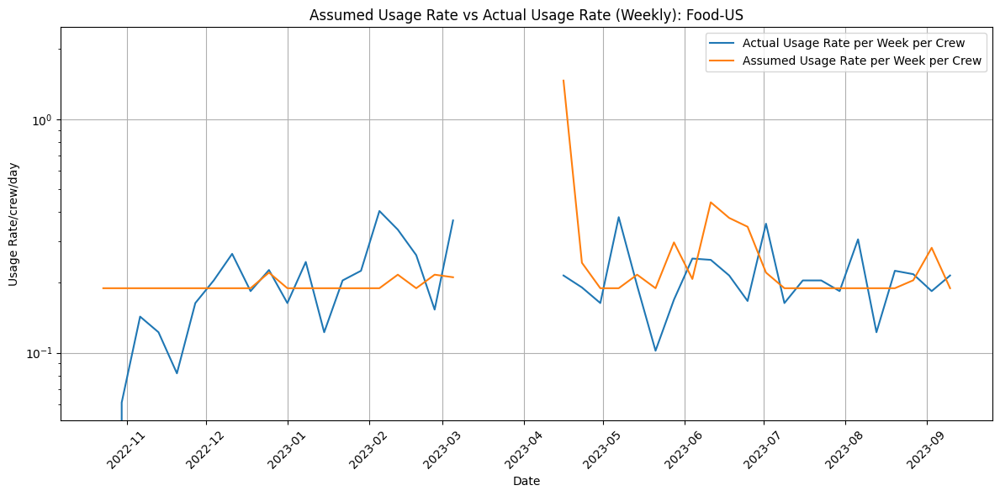

In [249]:
plot_consumables_analysis_weekly(df_master_PT_Food_US, 160, 'Food-US')

Trying out weekly plot insted of daily

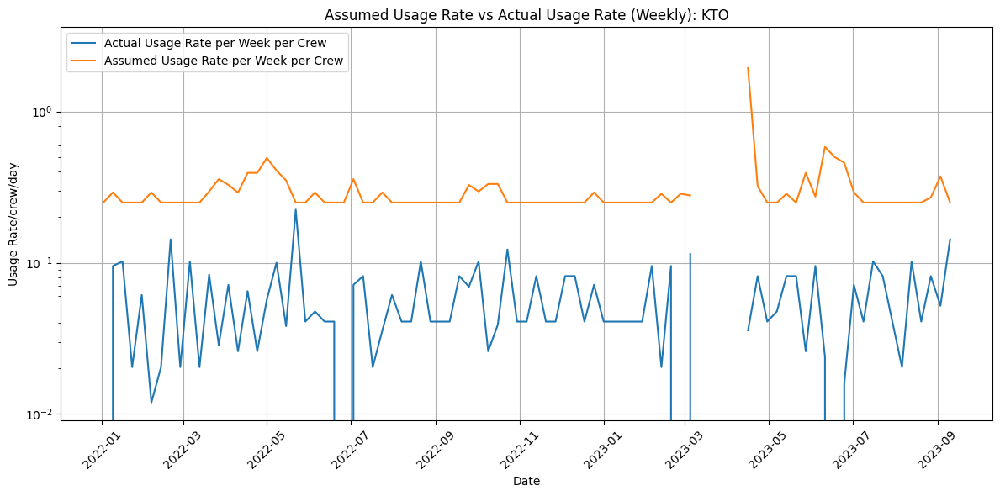

In [250]:
plot_consumables_analysis_weekly(df_master_PT_KTO, 22, 'KTO')

In [251]:
'''
import numpy as np
import pandas as pd
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C, WhiteKernel
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV

# Assuming df_master_PT_Food_US and relevant imports are defined
X = df_master_PT_Food_US[['time','crew_count']]
y = df_master_PT_Food_US['Storage Location_Stowed']

# Calculate the index to split the data
split_index = int(0.8 * len(df_master_PT_Food_US))

# Split the data into training and testing sets
X_train, X_test = X.iloc[:split_index], X.iloc[split_index:]
y_train, y_test = y.iloc[:split_index], y.iloc[split_index:]

# Kernel with parameters to be optimized
kernel = C(1.0, (1e-3, 1e3)) * RBF(1.0, (1e-3, 1e3)) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e1))

# Create Gaussian Process model
gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10, normalize_y=True)

# Set up GridSearchCV
param_grid = {
    "kernel__k1__k1__constant_value": [0.1, 1.0, 10.0],
    "kernel__k1__k2__length_scale": [0.1, 1.0, 10.0],
    "kernel__k2__noise_level": [0.01, 0.1, 1.0]
}

grid_search = GridSearchCV(gp, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit model using grid search
grid_search.fit(X_train, y_train)

# Best model
best_gp = grid_search.best_estimator_

# Predict using the best model
y_pred, sigma = best_gp.predict(X_test, return_std=True)

# Evaluate the best model
mse = mean_squared_error(y_test, y_pred)
print(f"MSE for Best GP: {mse}")
print("Best parameters:", grid_search.best_params_)
'''

'\nimport numpy as np\nimport pandas as pd\nfrom sklearn.gaussian_process import GaussianProcessRegressor\nfrom sklearn.gaussian_process.kernels import RBF, ConstantKernel as C, WhiteKernel\nfrom sklearn.metrics import mean_squared_error\nfrom sklearn.model_selection import GridSearchCV\n\n# Assuming df_master_PT_Food_US and relevant imports are defined\nX = df_master_PT_Food_US[[\'time\',\'crew_count\']]\ny = df_master_PT_Food_US[\'Storage Location_Stowed\']\n\n# Calculate the index to split the data\nsplit_index = int(0.8 * len(df_master_PT_Food_US))\n\n# Split the data into training and testing sets\nX_train, X_test = X.iloc[:split_index], X.iloc[split_index:]\ny_train, y_test = y.iloc[:split_index], y.iloc[split_index:]\n\n# Kernel with parameters to be optimized\nkernel = C(1.0, (1e-3, 1e3)) * RBF(1.0, (1e-3, 1e3)) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e1))\n\n# Create Gaussian Process model\ngp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10, 

Tried Gaussian Process for time series but MSE was too high. Commenting code since it takes a lot of time to perform above operations.

### Actual, Assumed vs Predicted Plot for Food-US using linear regression

Prediction seems totally incorrect as Stowed Quantity is increasing with Time, which is not possible.

In [252]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import matplotlib.dates as mdates

def train_and_plot(data, future_data, features, date_column, segment_by, category, cut_date='2024-08-01'):
    """
    Train a linear regression model and plot historical and future data predictions.
    Also, print MSE for each segment.

    Parameters:
    - data: DataFrame containing the historical data.
    - future_data: DataFrame containing the future data.
    - features: List of feature column names used for the model.
    - date_column: Name of the date column in the DataFrame.
    - segment_by: Name of the column used to determine resupply events.
    - category: Category for which the plot is being made.
    - cut_date: Date to filter the future data predictions.
    """

    if date_column not in data.columns:
        if date_column not in data.index.name:
            raise ValueError(f"{date_column} is neither a column nor the index of the DataFrame.")
        else:
            data.index = pd.to_datetime(data.index)
    else:
        data[date_column] = pd.to_datetime(data[date_column])
        data.set_index(date_column, inplace=True, drop=False)

    if date_column not in future_data.columns:
        if date_column not in future_data.index.name:
            raise ValueError(f"{date_column} is neither a column nor the index of the DataFrame.")
        else:
            future_data.index = pd.to_datetime(future_data.index)
    else:
        future_data[date_column] = pd.to_datetime(future_data[date_column])
        future_data.set_index(date_column, inplace=True, drop=False)

    data['segment_id'] = 0
    future_data['segment_id'] = 0

    # Define resupply and segment
    data['is_resupply'] = data[segment_by] > 0
    resupply_indices = data[data['is_resupply']].index
    cut_points = [data.index.get_loc(idx) for idx in resupply_indices]
    cut_points = [0] + cut_points + [len(data)]

    # Train and test data split by segments
    for i, (start, end) in enumerate(zip(cut_points[:-1], cut_points[1:]), start=1):
        split_index = start + int((end - start) * 0.8)
        data.iloc[start:split_index, data.columns.get_loc('segment_id')] = i
        segment_train = data.iloc[start:split_index]
        segment_test = data.iloc[split_index:end]
        data.iloc[split_index:end, data.columns.get_loc('segment_id')] = i

        # Train model
        model = LinearRegression()
        model.fit(segment_train[features], segment_train['Storage Location_Stowed'])

        # Predict on test segment
        segment_predictions = model.predict(segment_test[features])

        # Calculate and print MSE for the segment
        mse = mean_squared_error(segment_test['Storage Location_Stowed'], segment_predictions)
        print(f"MSE for segment {i}: {mse}")

    # Train model on full data
    model.fit(data[features], data['Storage Location_Stowed'])

    # Predict on combined historical data
    all_predictions = model.predict(data[features])

    # Filter and prepare future data
    future_data = future_data[future_data.index < pd.Timestamp(cut_date)]
    future_data['segment_id'] = max(data['segment_id'])

    # Predict future data
    future_predictions = model.predict(future_data[features])
    future_data['Predicted_Stowed_Qty'] = future_predictions

    # Plotting historical and future data
    fig, ax = plt.subplots(figsize=(12, 8))
    ax.plot(data.index, data['Storage Location_Stowed'], label='Actual Stowed', color='green')
    ax.plot(data.index, all_predictions, label='Predicted Stowed', color='purple', linestyle='--')
    if 'stowed_historical' in data.columns:
        ax.plot(data.index, data['stowed_historical'], label='Assumed Stowed', color='grey', linestyle=':')
    if 'stowed_historical' in future_data.columns:
        ax.plot(future_data.index, future_data['Predicted_Stowed_Qty'], color='purple', linestyle='--')
        ax.plot(future_data.index, future_data['stowed_historical'], color='grey', linestyle=':')
    ax.xaxis.set_major_locator(mdates.YearLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.set_xlabel('Date')
    ax.set_ylabel('Stowed Quantity')
    ax.set_title(f'Actual, Assumed vs Predicted Plot for {category}')
    ax.axvline(x=future_data.index.min(), color='red', linestyle='--')

    ax.legend()
    plt.show()


In this analysis, we used a linear regression model on a time series dataset that was broken down by specific events like resupply moments. First, we formatted the date information correctly and used it as an organizing index for easier handling of the data. We then divided the data around these significant events, creating distinct blocks or segments. Each segment represents a different period in the dataset and could reflect changes due to factors like different supply levels. For each segment, we split the data into two parts: 80% was used for training the model, and 20% was used for testing it. This split allowed us to tailor the model specifically to the characteristics of each period, enhancing its accuracy in predictions.

After evaluating the model on each segment separately, we used the entire historical dataset to train the model comprehensively. This approach helped maximize the model's learning from all available data. We then used the model to make predictions about future data up until a specific cut-off date, aiming to predict upcoming trends based on past patterns. We visualized these results to clearly show the actual data, what the model predicted, and what we assumed, with a clear marker showing where future predictions started. This detailed method provided a clear understanding of how well the model worked across different times and helped project future trends based on the data it learned from.








    Train a linear regression model and plot historical and future data predictions.
    Also, print MSE for each segment.
    
    Parameters:
    - data: DataFrame containing the historical data.
    - future_data: DataFrame containing the future data.
    - features: List of feature column names used for the model.
    - date_column: Name of the date column in the DataFrame.
    - segment_by: Name of the column used to determine resupply events.
    - category: Category for which the plot is being made.
    - cut_date: Date to filter the future data predictions.

### Actual, Assumed vs Predicted Plot for Food-US using linear regression

MSE for segment 1: 4.307578187959196
MSE for segment 2: 6.04571428571441
MSE for segment 3: 129.5680185363624
MSE for segment 4: 371.13042980313287
MSE for segment 5: 27.5659594609551
MSE for segment 6: 19.889649640526848


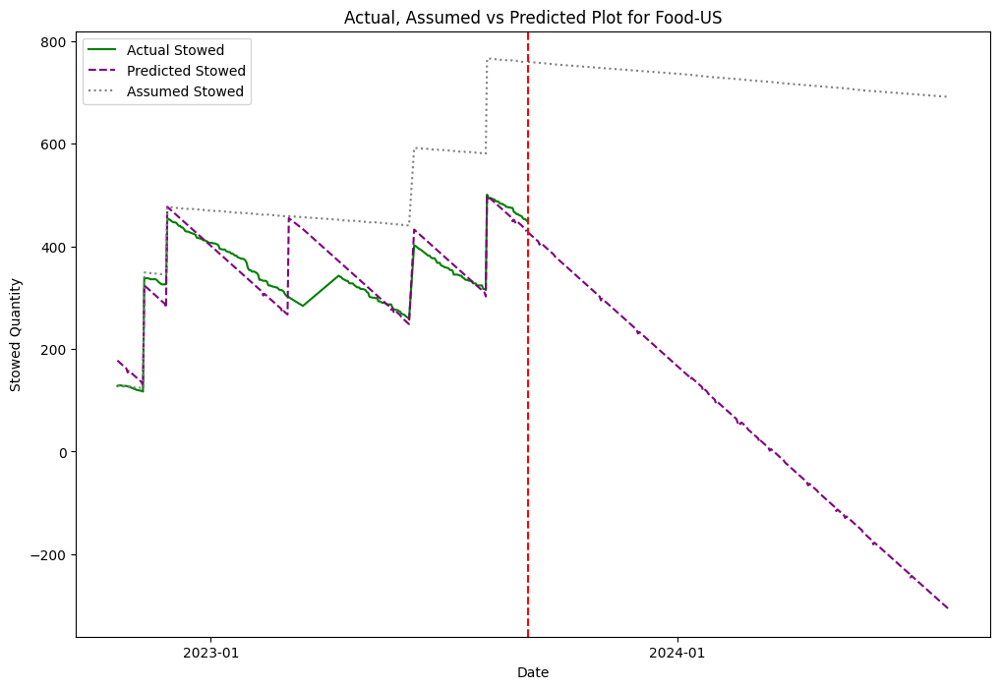

In [253]:
train_and_plot(df_master_PT_Food_US, merged_df_Food_US_Pred_Stowed_Qty, ['crew_count', 'time', 'event_encoded', 'segment_id'], 'datedim_date', 'resupplied_with_flight','Food-US')


Actual, Assumed vs Predicted Plot for Food-RS using linear regression

MSE for segment 1: 0.0
MSE for segment 2: 26.778654757046173
MSE for segment 3: 3.4047730269277814
MSE for segment 4: 8.381954421426897
MSE for segment 5: 27.393543913620384
MSE for segment 6: 5.271382133242178


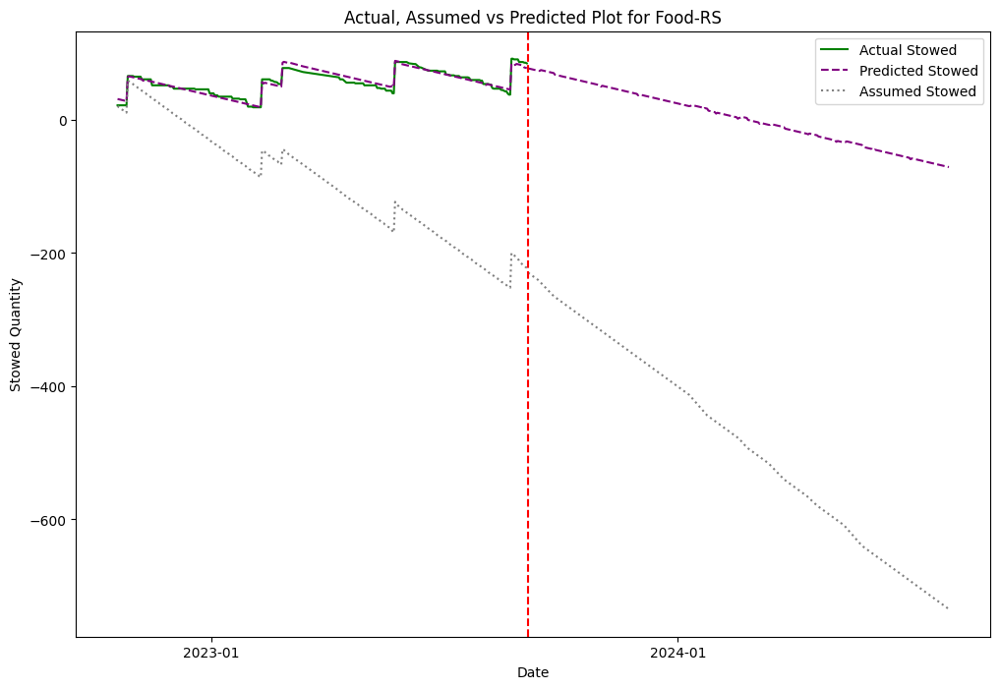

In [254]:
train_and_plot(df_master_PT_FOOD_RS, merged_df_Food_RS_Pred_Stowed_Qty, ['crew_count', 'time', 'event_encoded', 'segment_id'], 'datedim_date', 'resupplied_with_flight','Food-RS')


### Actual, Assumed vs Predicted Plot for KTO using linear regression

MSE for segment 1: 6.418397025470479
MSE for segment 2: 1.0
MSE for segment 3: 82.55068538358783
MSE for segment 4: 23.37809050159448
MSE for segment 5: 2.09465020576132
MSE for segment 6: 0.7640381596425455
MSE for segment 7: 1.9217156023821633
MSE for segment 8: 2.7045831412231904
MSE for segment 9: 35.93107440737788
MSE for segment 10: 0.7321673675578584
MSE for segment 11: 1.450362811791338
MSE for segment 12: 0.31726445517724255


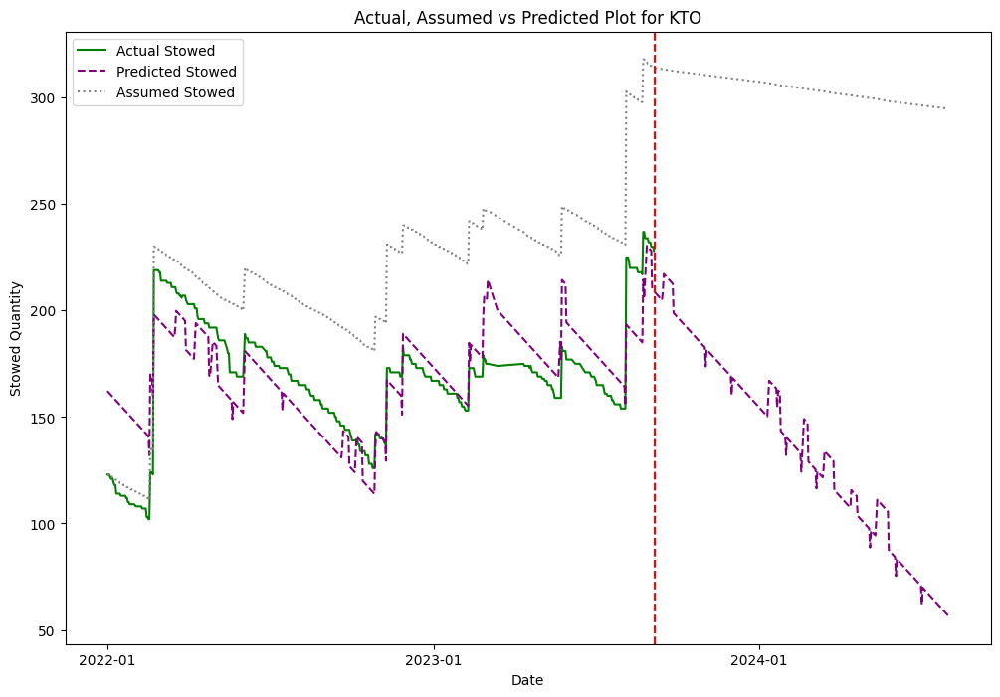

In [255]:
train_and_plot(df_master_PT_KTO, merged_df_KTO_Pred_Stowed_Qty, ['crew_count', 'time', 'event_encoded', 'segment_id'], 'datedim_date', 'resupplied_with_flight','KTO')


### Actual, Assumed vs Predicted Plot for Filter Inserts using linear regression

MSE for segment 1: 0.20121471950973505
MSE for segment 2: 0.0
MSE for segment 3: 0.2747788454839309
MSE for segment 4: 0.18570923399181422
MSE for segment 5: 0.4866255144032938
MSE for segment 6: 0.7582367272747839
MSE for segment 7: 0.7032927098763431
MSE for segment 8: 0.5072874371627337
MSE for segment 9: 1.062992488662128
MSE for segment 10: 0.0


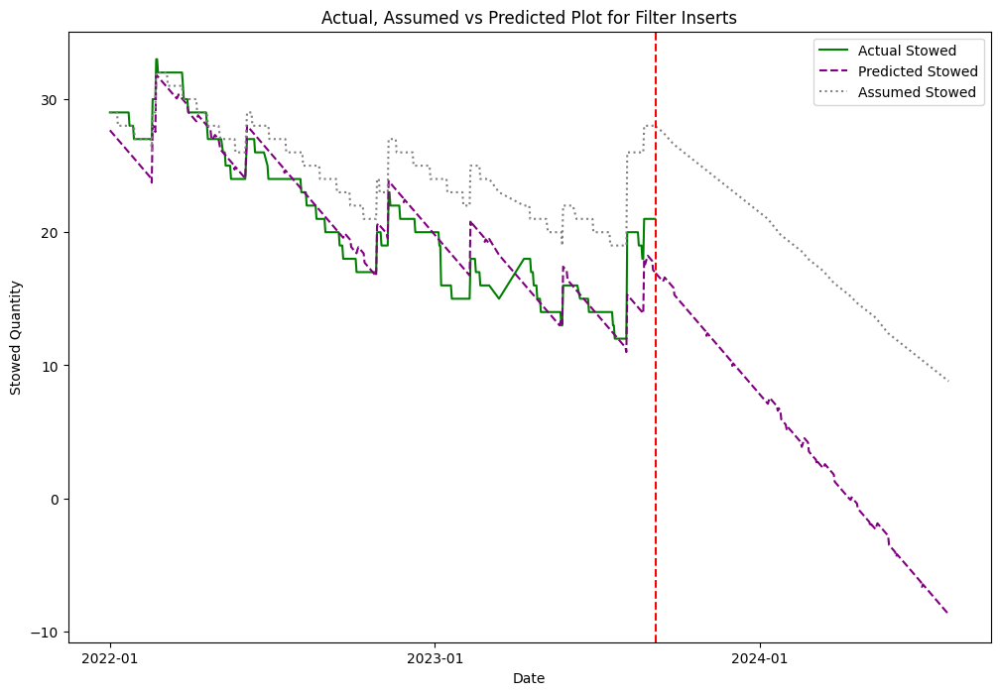

In [256]:
train_and_plot(df_master_PT_FI, merged_df_FI_Pred_Stowed_Qty, ['crew_count', 'time', 'event_encoded', 'segment_id'], 'datedim_date', 'resupplied_with_flight','Filter Inserts')


### Actual, Assumed vs Predicted Plot for ACY Inserts using linear regression

MSE for segment 1: 0.0
MSE for segment 2: 0.0
MSE for segment 3: 294.7695613737552
MSE for segment 4: 107.8311353523485
MSE for segment 5: 0.0
MSE for segment 6: 7.623159673078551
MSE for segment 7: 13.906604633462127
MSE for segment 8: 2.041440287196291
MSE for segment 9: 3.3986026077096883
MSE for segment 10: 5.726940100027101


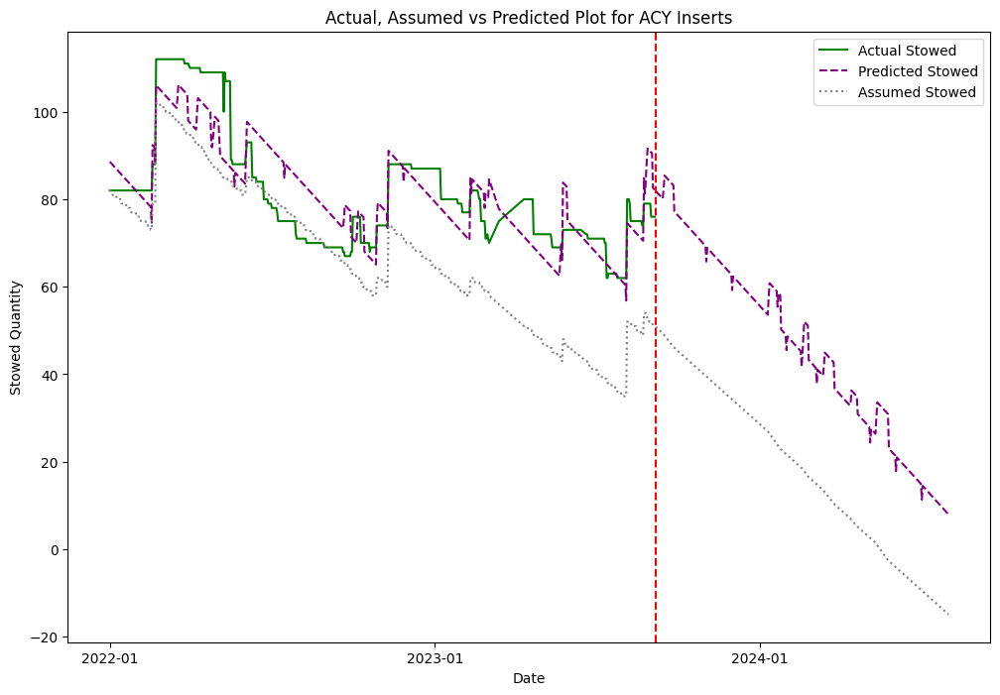

In [257]:
train_and_plot(df_master_PT_ACY_MOD, merged_df_ACY_Pred_Stowed_Qty, ['crew_count', 'time', 'event_encoded', 'segment_id'], 'datedim_date', 'resupplied_with_flight','ACY Inserts')


MSE for segment 1: 0.959508804859415
MSE for segment 2: 2.954978304836137
MSE for segment 3: 2.7902200468230545
MSE for segment 4: 1.399882391716997


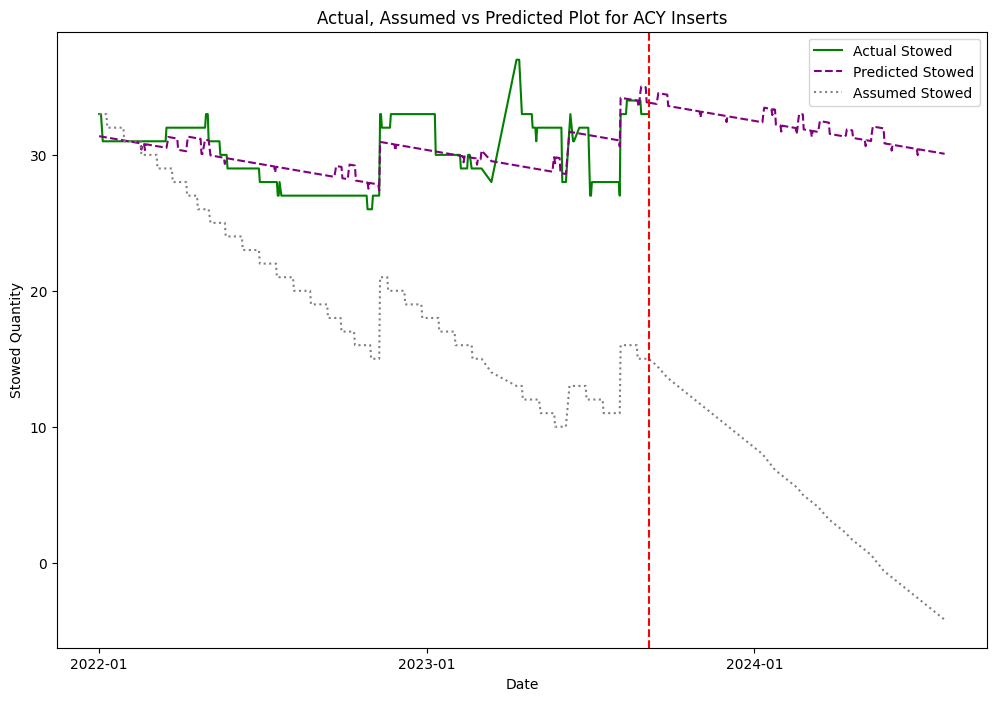

In [258]:
train_and_plot(df_master_PT_EDV, merged_df_EDV_Pred_Stowed_Qty, ['crew_count', 'time', 'event_encoded', 'segment_id'], 'datedim_date', 'resupplied_with_flight','ACY Inserts')
